In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
import numpy as onp
import scipy.io
from scipy.interpolate import griddata
import jax.numpy as np
from jax import random, grad, vmap, jit
from jax.example_libraries import optimizers
from jax import config
from jax.flatten_util import ravel_pytree
from jax.nn import relu, elu
import itertools
from functools import partial
from torch.utils import data
from tqdm import trange
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

# New Section

In [2]:
# Define MLP
def MLP(layers, activation=relu):
  ''' Vanilla MLP'''
  def init(rng_key):
      def init_layer(key, d_in, d_out):
          k1, k2 = random.split(key)
          glorot_stddev = 1. / np.sqrt((d_in + d_out) / 2.)
          W = glorot_stddev * random.normal(k1, (d_in, d_out))
          b = np.zeros(d_out)
          return W, b
      key, *keys = random.split(rng_key, len(layers))
      params = list(map(init_layer, keys, layers[:-1], layers[1:]))
      return params
  def apply(params, inputs):
      for W, b in params[:-1]:
          outputs = np.dot(inputs, W) + b
          inputs = activation(outputs)
      W, b = params[-1]
      outputs = np.dot(inputs, W) + b
      return outputs
  return init, apply

# Define modified MLP
def modified_MLP(layers, activation=relu):
  def xavier_init(key, d_in, d_out):
      glorot_stddev = 1. / np.sqrt((d_in + d_out) / 2.)
      W = glorot_stddev * random.normal(key, (d_in, d_out))
      b = np.zeros(d_out)
      return W, b

  def init(rng_key):
      U1, b1 =  xavier_init(random.PRNGKey(12345), layers[0], layers[1])
      U2, b2 =  xavier_init(random.PRNGKey(54321), layers[0], layers[1])
      def init_layer(key, d_in, d_out):
          k1, k2 = random.split(key)
          W, b = xavier_init(k1, d_in, d_out)
          return W, b
      key, *keys = random.split(rng_key, len(layers))
      params = list(map(init_layer, keys, layers[:-1], layers[1:]))
      return (params, U1, b1, U2, b2)

  def apply(params, inputs):
      params, U1, b1, U2, b2 = params
      U = activation(np.dot(inputs, U1) + b1)
      V = activation(np.dot(inputs, U2) + b2)
      for W, b in params[:-1]:
          outputs = activation(np.dot(inputs, W) + b)
          inputs = np.multiply(outputs, U) + np.multiply(1 - outputs, V)
      W, b = params[-1]
      outputs = np.dot(inputs, W) + b
      return outputs
  return init, apply


In [3]:
###################################################################################################################
# Data generator
class DataGenerator(data.Dataset):
    def __init__(self, u, y, s, v,
                 batch_size=64, rng_key=random.PRNGKey(1234)):
        'Initialization'
        self.u = u
        self.y = y
        self.s = s
        self.v = v

        self.N = u.shape[0]
        self.batch_size = batch_size
        self.key = rng_key

    def __getitem__(self, index):
        'Generate one batch of data'
        self.key, subkey = random.split(self.key)
        inputs, outputs = self.__data_generation(subkey)
        return inputs, outputs

    @partial(jit, static_argnums=(0,))
    def __data_generation(self, key):
        'Generates data containing batch_size samples'
        idx = random.choice(key, self.N, (self.batch_size,), replace=True)   ## 这里把false改成了true允许重复采样
        s = self.s[idx,:]
        y = self.y[idx,:]
        u = self.u[idx,:]
        v = self.v[idx,:]
        # Construct batch
        inputs = (u, y, v)
        outputs = s
        return inputs, outputs

In [4]:
# Define Physics-informed DeepONet model
class PI_DeepONet:
    def __init__(self, branch_layers, trunk_layers):
        # Network initialization and evaluation functions
        self.branch_init, self.branch_apply = modified_MLP(branch_layers, activation=np.tanh)
        self.trunk_init, self.trunk_apply = modified_MLP(trunk_layers, activation=np.tanh)

        # Initialize
        branch_params = self.branch_init(rng_key = random.PRNGKey(1234))
        trunk_params = self.trunk_init(rng_key = random.PRNGKey(4321))
        params = (branch_params, trunk_params)

        # Use optimizers to set optimizer initialization and update functions
        self.opt_init, \
        self.opt_update, \
        self.get_params = optimizers.adam(optimizers.exponential_decay(1e-3, decay_steps=2000,decay_rate=0.9))
        self.opt_state = self.opt_init(params)

        # Used to restore the trained model parameters
        _, self.unravel_params = ravel_pytree(params)

        # Logger
        self.itercount = itertools.count()
        self.loss_log = []
        self.loss_ics_log = []
        self.loss_bcs_log = []
        self.loss_res_log = []

    # Define DeepONet architecture
    def operator_net(self, params, u, t, x, v):
        branch_params, trunk_params = params
        # print(t.size, x.size, v.squeeze().size)
        # print(t.shape, x.shape, v.squeeze().shape)
        y = np.stack([t,x,v.squeeze()])
        B = self.branch_apply(branch_params, u)
        T = self.trunk_apply(trunk_params, y)
        outputs = np.sum(B * T)
        return   outputs

    # Define ds/dx
    def s_x_net(self, params, u, t, x, v):
         s_x = grad(self.operator_net, argnums=3)(params, u, t, x, v)
         return s_x

    # Define PDE residual
    def residual_net(self, params, u, t, x, v):
        s = self.operator_net(params, u, t, x, v)
        s_t = grad(self.operator_net, argnums=2)(params, u, t, x, v)
        s_x = grad(self.operator_net, argnums=3)(params, u, t, x, v)
        s_xx= grad(grad(self.operator_net, argnums=3), argnums=3)(params, u, t, x, v)

        res = s_t + s * s_x - v * s_xx
        return res

    # Define initial loss
    def loss_ics(self, params, batch):
        # Fetch data
        inputs, outputs = batch
        u, y, v = inputs

        # Compute forward pass
        s_pred = vmap(self.operator_net, (None, 0, 0, 0, 0))(params, u, y[:,0], y[:,1], v)

        # Compute loss
        loss = np.mean((outputs.flatten() - s_pred)**2)
        return loss

    # Define boundary loss
    def loss_bcs(self, params, batch):
        # Fetch data
        inputs, outputs = batch
        u, y, v = inputs

        # Compute forward pass
        s_bc1_pred = vmap(self.operator_net, (None, 0, 0, 0, 0))(params, u, y[:,0], y[:,1], v)
        s_bc2_pred = vmap(self.operator_net, (None, 0, 0, 0, 0))(params, u, y[:,2], y[:,3], v)

        s_x_bc1_pred = vmap(self.s_x_net, (None, 0, 0, 0, 0))(params, u, y[:,0], y[:,1], v)
        s_x_bc2_pred = vmap(self.s_x_net, (None, 0, 0, 0, 0))(params, u, y[:,2], y[:,3], v)

        # Compute loss
        loss_s_bc = np.mean((s_bc1_pred - s_bc2_pred)**2)
        loss_s_x_bc = np.mean((s_x_bc1_pred - s_x_bc2_pred)**2)

        return loss_s_bc + loss_s_x_bc

    # Define residual loss
    def loss_res(self, params, batch):
        # Fetch data
        inputs, outputs = batch
        u, y, v = inputs
        # Compute forward pass
        pred = vmap(self.residual_net, (None, 0, 0, 0, 0))(params, u, y[:,0], y[:,1], v)

        # Compute loss
        loss = np.mean((outputs.flatten() - pred)**2)
        return loss

    # Define total loss
    def loss(self, params, ics_batch, bcs_batch, res_batch):
        loss_ics = self.loss_ics(params, ics_batch)
        loss_bcs = self.loss_bcs(params, bcs_batch)
        loss_res = self.loss_res(params, res_batch)
        loss =  20 * loss_ics + loss_bcs +  loss_res
        return loss

    # Define a compiled update step
    @partial(jit, static_argnums=(0,))
    def step(self, i, opt_state, ics_batch, bcs_batch, res_batch):
        params = self.get_params(opt_state)
        g = grad(self.loss)(params, ics_batch, bcs_batch, res_batch)
        return self.opt_update(i, g, opt_state)

    # Optimize parameters in a loop
    def train(self, ics_dataset, bcs_dataset, res_dataset, nIter = 10000):
        ics_data = iter(ics_dataset)
        bcs_data = iter(bcs_dataset)
        res_data = iter(res_dataset)

        pbar = trange(nIter)
        # Main training loop
        for it in pbar:
            # Fetch data
            ics_batch= next(ics_data)
            bcs_batch= next(bcs_data)
            res_batch = next(res_data)

            self.opt_state = self.step(next(self.itercount), self.opt_state, ics_batch, bcs_batch, res_batch)

            if it % 100 == 0:
                params = self.get_params(self.opt_state)

                # Compute losses
                loss_value = self.loss(params, ics_batch, bcs_batch, res_batch)
                loss_ics_value = self.loss_ics(params, ics_batch)
                loss_bcs_value = self.loss_bcs(params, bcs_batch)
                loss_res_value = self.loss_res(params, res_batch)

                # Store losses
                self.loss_log.append(loss_value)
                self.loss_ics_log.append(loss_ics_value)
                self.loss_bcs_log.append(loss_bcs_value)
                self.loss_res_log.append(loss_res_value)

                # Print losses
                pbar.set_postfix({'Loss': loss_value,
                                  'loss_ics' : loss_ics_value,
                                  'loss_bcs' : loss_bcs_value,
                                  'loss_physics': loss_res_value})
                # Plot for one generated data
                k = 2 # index
                u = usol[k,:, :]
                u0 = usol[k,0,:]
                v0 = usol_v[k]
                P_test = 101
                m_test = 101
                t = np.linspace(0, 1, P_test)
                x = np.linspace(0, 1, P_test)
                T, X = np.meshgrid(t, x)
                u_test = np.tile(u0, (P_test*m_test, 1))
                y_test = np.hstack([T.flatten()[:,None], X.flatten()[:,None]])
                s_test = u.flatten()[:,None]
                v_test = np.tile(v0, (P_test*m_test, 1))
                s_pred = model.predict_s(params, u_test, y_test, v_test)[:,None]
                S_pred = griddata(y_test, s_pred.flatten(), (T, X), method='cubic')
                error_s = np.linalg.norm(u - S_pred.T, 2) / np.linalg.norm(u, 2)
                fig = plt.figure(figsize=(18,5))
                plt.subplot(1,2,1)
                plt.pcolor(T, X, u, cmap='jet')
                plt.xlabel('$x$')
                plt.ylabel('$t$')
                plt.title('Exact $s(x,t)$')
                plt.colorbar()
                plt.tight_layout()
                plt.subplot(1,2,2)
                plt.pcolor(T, X, S_pred.T, cmap='jet')
                plt.xlabel('$x$')
                plt.ylabel('$t$')
                plt.title('Predict $s(x,t)$')
                plt.colorbar()
                plt.tight_layout()
                plt.show()

    # Evaluates predictions at test points
    @partial(jit, static_argnums=(0,))
    def predict_s(self, params, U_star, Y_star, V_star):
        s_pred = vmap(self.operator_net, (None, 0, 0, 0, 0))(params, U_star, Y_star[:,0], Y_star[:,1], V_star)
        return s_pred

    @partial(jit, static_argnums=(0,))
    def predict_res(self, params, U_star, Y_star, V_star):
        r_pred = vmap(self.residual_net, (None, 0, 0, 0, 0))(params, U_star, Y_star[:,0], Y_star[:,1], V_star)
        return r_pred

In [5]:
# Geneate ics training data corresponding to one input sample
def generate_one_ics_training_data(key, u0, ut0_v, m=101, P=101):

    t_0 = np.zeros((P,1))
    x_0 = np.linspace(0, 1, P)[:, None]

    y = np.hstack([t_0, x_0])
    u = np.tile(u0, (P, 1))
    s = u0
    v = np.tile(ut0_v, (P, 1))

    return u, y, s, v

# Geneate bcs training data corresponding to one input sample
def generate_one_bcs_training_data(key, u0, ub01_v, m=101, P=100):

    t_bc = random.uniform(key, (P,1))
    x_bc1 = np.zeros((P, 1))
    x_bc2 = np.ones((P, 1))

    y1 = np.hstack([t_bc, x_bc1])  # shape = (P, 2)
    y2 = np.hstack([t_bc, x_bc2])  # shape = (P, 2)

    u = np.tile(u0, (P, 1))
    y =  np.hstack([y1, y2])  # shape = (P, 4)
    s = np.zeros((P, 1))
    v = np.tile(ub01_v, (P, 1))

    return u, y, s, v

# Geneate res training data corresponding to one input sample
def generate_one_res_training_data(key, u0, ures_v, m=101, P=1000):

    subkeys = random.split(key, 2)

    t_res = random.uniform(subkeys[0], (P,1))
    x_res = random.uniform(subkeys[1], (P,1))

    u = np.tile(u0, (P, 1))
    y =  np.hstack([t_res, x_res])
    s = np.zeros((P, 1))
    v = np.tile(ures_v, (P, 1))

    return u, y, s, v

# Geneate test data corresponding to one input sample
def generate_one_test_data(idx,usol, u_v, m=101, P=101):

    u = usol[idx]
    u0 = u[0,:]
    v0 = u_v[idx]

    t = np.linspace(0, 1, P)
    x = np.linspace(0, 1, P)
    T, X = np.meshgrid(t, x)

    s = u.T.flatten()
    u = np.tile(u0, (P**2, 1))
    y = np.hstack([T.flatten()[:,None], X.flatten()[:,None]])
    v = np.tile(v0, (P**2, 1))

    return u, y, s, v

# Geneate training data corresponding to N input sample
def compute_error(idx,u_v, usol,  m, P):
    u_test, y_test, s_test, v_test = generate_one_test_data(idx, usol, u_v,m, P )

    u_test = u_test.reshape(P**2,-1)
    y_test = y_test.reshape(P**2,-1)
    s_test = s_test.reshape(P**2,-1)
    v_test = v_test.reshape(P**2,-1)

    s_pred = model.predict_s(params, u_test, y_test, v_test)[:,None]
    error = np.linalg.norm(s_test - s_pred) / np.linalg.norm(s_test)

    return error

In [6]:
# Prepare the training data

# Load data
path = '/content/drive/MyDrive/nif/PIDON_BUR.mat'  # Please use the matlab script to generate data

data = scipy.io.loadmat(path)
usol = np.array( data['output'])
usol_v = np.array( data['vinput'])

N = usol.shape[0]  # number of total input samples
N_train =2      # number of input samples used for training
N_test = N - N_train  # number of input samples used for test
m = 101            # number of sensors for input samples
P_ics_train = 101   # number of locations for evulating the initial condition
P_bcs_train = 101    # number of locations for evulating the boundary condition
P_res_train = 2500   # number of locations for evulating the PDE residual
P_test = 101        # resolution of uniform grid for the test data

u0_train = usol[:N_train,0,:]   # input samples
v0_train = usol_v[:N_train]

key = random.PRNGKey(0) # use different key for generating test data
keys = random.split(key, N_train)

# Generate training data for inital condition
u_ics_train, y_ics_train, s_ics_train, v_ics_train = vmap(generate_one_ics_training_data, in_axes=(0, 0, 0, None, None))(keys, u0_train, v0_train, m, P_ics_train)

u_ics_train = u_ics_train.reshape(N_train * P_ics_train,-1)
y_ics_train = y_ics_train.reshape(N_train * P_ics_train,-1)
s_ics_train = s_ics_train.reshape(N_train * P_ics_train,-1)
v_ics_train = v_ics_train.reshape(N_train * P_ics_train,-1)

# Generate training data for boundary condition
u_bcs_train, y_bcs_train, s_bcs_train, v_bcs_train = vmap(generate_one_bcs_training_data, in_axes=(0, 0, 0, None, None))(keys, u0_train, v0_train, m, P_bcs_train)

u_bcs_train = u_bcs_train.reshape(N_train * P_bcs_train,-1)
y_bcs_train = y_bcs_train.reshape(N_train * P_bcs_train,-1)
s_bcs_train = s_bcs_train.reshape(N_train * P_bcs_train,-1)
v_bcs_train = v_bcs_train.reshape(N_train * P_bcs_train,-1)

# Generate training data for PDE residual
u_res_train, y_res_train, s_res_train, v_res_train = vmap(generate_one_res_training_data, in_axes=(0, 0, 0, None, None))(keys, u0_train, v0_train, m, P_res_train)

u_res_train = u_res_train.reshape(N_train * P_res_train,-1)
y_res_train = y_res_train.reshape(N_train * P_res_train,-1)
s_res_train = s_res_train.reshape(N_train * P_res_train,-1)
v_res_train = v_res_train.reshape(N_train * P_res_train,-1)

In [7]:
# Initialize model
branch_layers = [m, 100, 100, 100, 100, 100, 100, 100]
trunk_layers =  [3, 100, 100, 100, 100, 100, 100, 100]
model = PI_DeepONet(branch_layers, trunk_layers)

In [8]:
# Create data set
batch_size = 5000
ics_dataset = DataGenerator(u_ics_train, y_ics_train, s_ics_train, v_ics_train, batch_size)
bcs_dataset = DataGenerator(u_bcs_train, y_bcs_train, s_bcs_train, v_bcs_train, batch_size)
res_dataset = DataGenerator(u_res_train, y_res_train, s_res_train, v_res_train, batch_size)

  0%|          | 0/20000 [00:20<?, ?it/s, Loss=8.838282, loss_ics=0.37498197, loss_bcs=0.92487234, loss_physics=0.41376927]

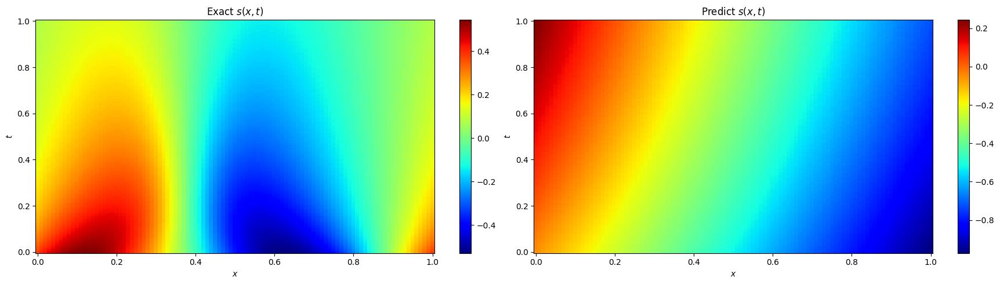

  0%|          | 96/20000 [00:27<08:01, 41.38it/s, Loss=1.8292648, loss_ics=0.079096764, loss_bcs=0.20694381, loss_physics=0.040385574]

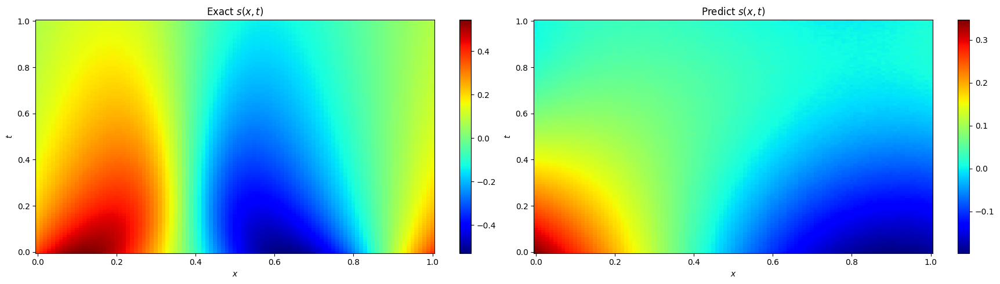

  1%|          | 195/20000 [00:31<06:16, 52.64it/s, Loss=0.16421479, loss_ics=0.0024636276, loss_bcs=0.030559931, loss_physics=0.0843823]

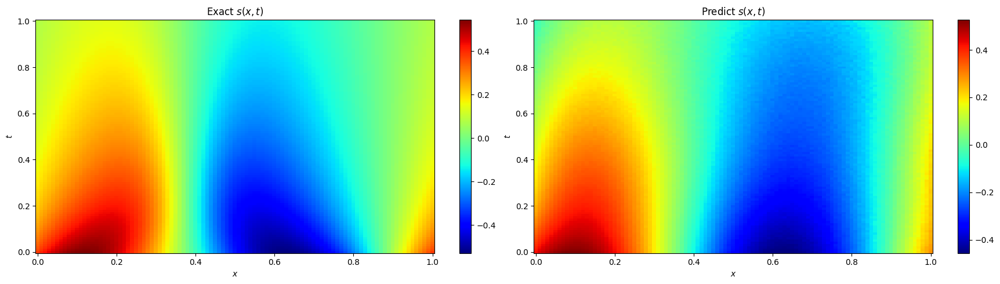

  1%|▏         | 295/20000 [00:36<06:12, 52.89it/s, Loss=0.10314602, loss_ics=0.00095383776, loss_bcs=0.0067537925, loss_physics=0.07731547]

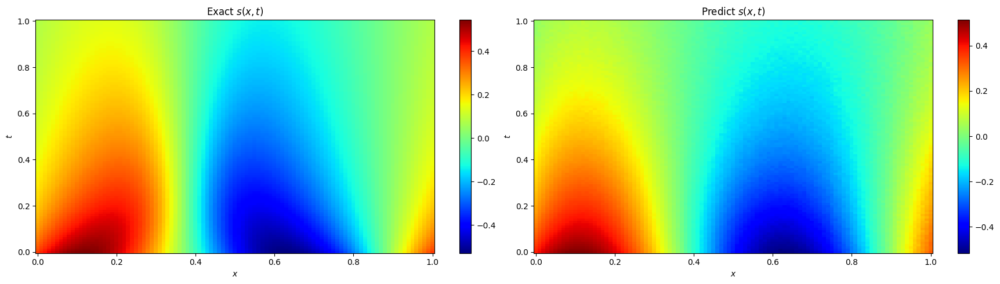

  2%|▏         | 395/20000 [00:40<06:09, 53.00it/s, Loss=0.08590391, loss_ics=0.0006870875, loss_bcs=0.004786521, loss_physics=0.06737564]  

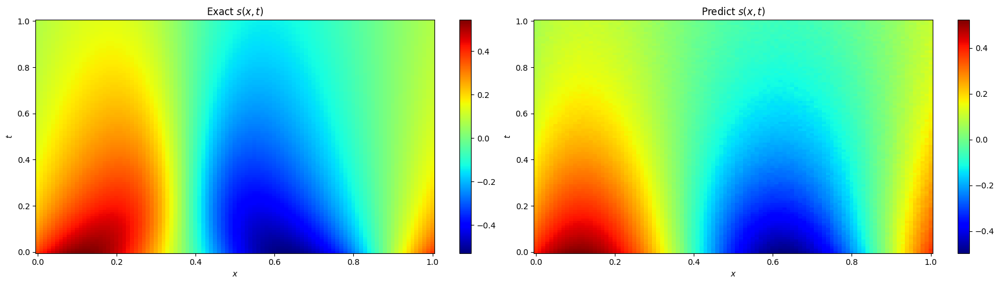

  2%|▏         | 495/20000 [00:44<06:07, 53.09it/s, Loss=0.07747301, loss_ics=0.0004007765, loss_bcs=0.0024526978, loss_physics=0.06700478]

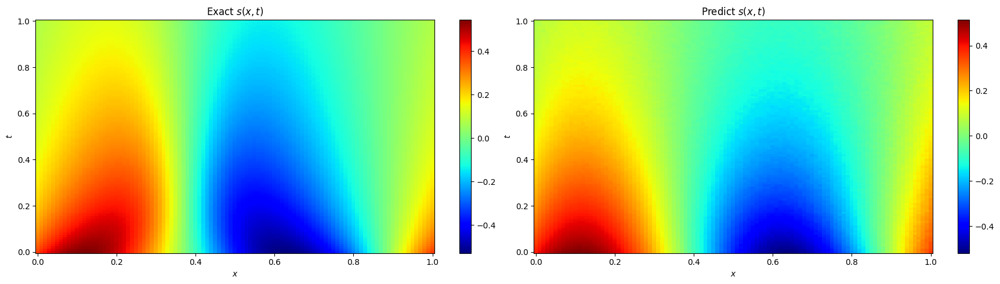

  3%|▎         | 595/20000 [00:48<06:05, 53.11it/s, Loss=0.08558764, loss_ics=0.0008876732, loss_bcs=0.003097881, loss_physics=0.0647363]  

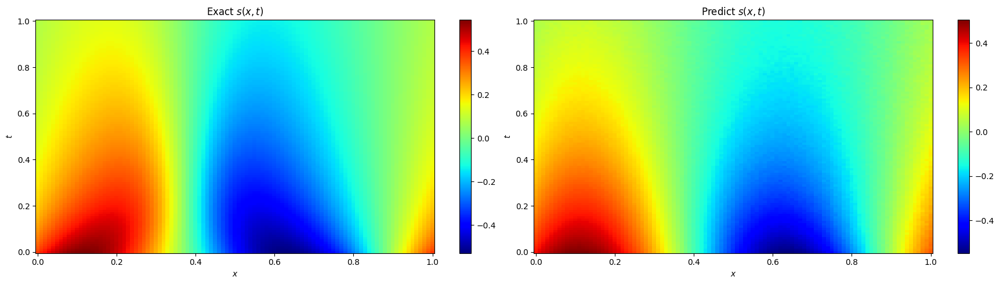

  3%|▎         | 696/20000 [00:52<06:04, 52.97it/s, Loss=0.086629346, loss_ics=0.000791977, loss_bcs=0.008192983, loss_physics=0.06259682]

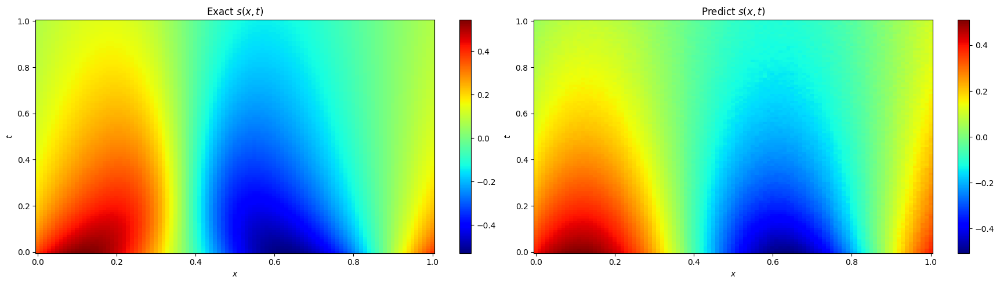

  4%|▍         | 795/20000 [00:56<06:01, 53.09it/s, Loss=0.06631567, loss_ics=0.00045453123, loss_bcs=0.0018963269, loss_physics=0.055328723]

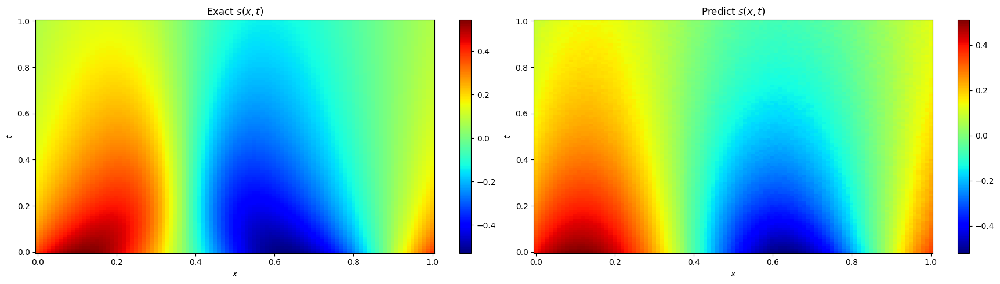

  4%|▍         | 895/20000 [01:00<05:59, 53.09it/s, Loss=0.06254359, loss_ics=0.00041160805, loss_bcs=0.0015854387, loss_physics=0.052725993]

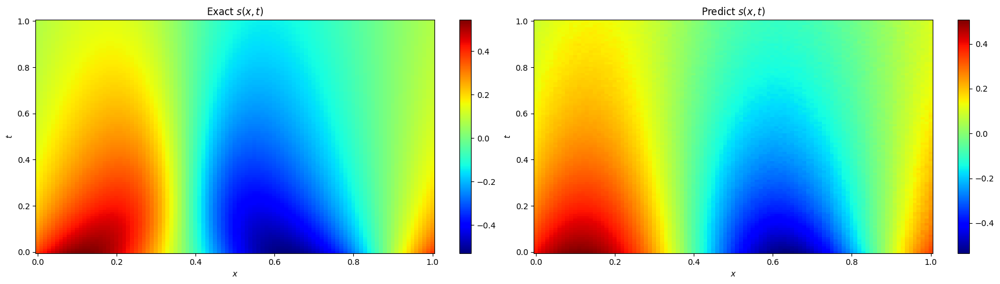

  5%|▍         | 995/20000 [01:04<05:59, 52.91it/s, Loss=0.05683537, loss_ics=0.00047335576, loss_bcs=0.0017956137, loss_physics=0.04557264] 

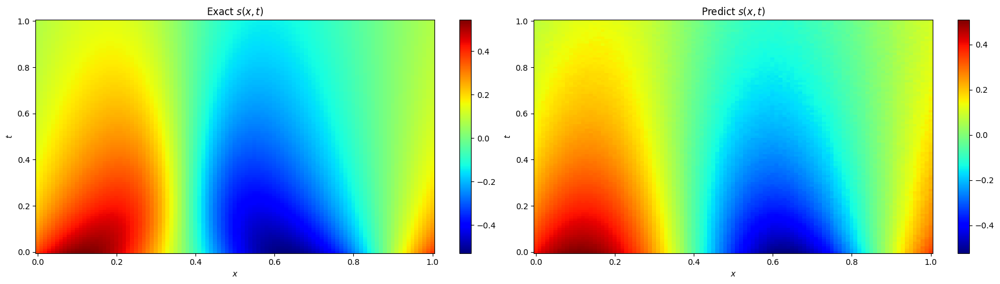

  5%|▌         | 1095/20000 [01:08<05:56, 53.10it/s, Loss=0.05166732, loss_ics=0.00043953178, loss_bcs=0.0014675849, loss_physics=0.0414091] 

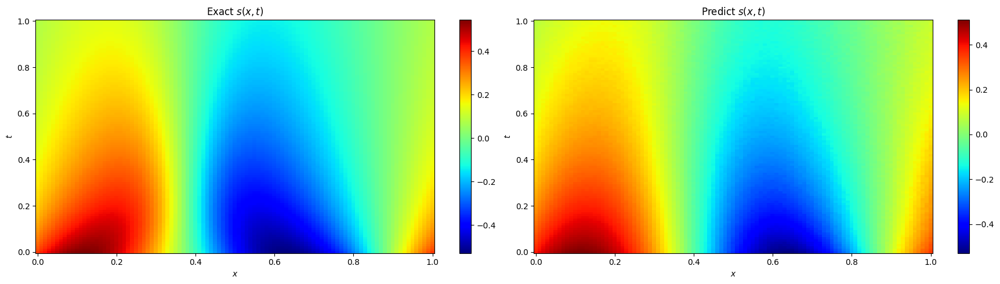

  6%|▌         | 1195/20000 [01:12<05:54, 53.12it/s, Loss=0.05251922, loss_ics=0.000676674, loss_bcs=0.0020038453, loss_physics=0.036981896]

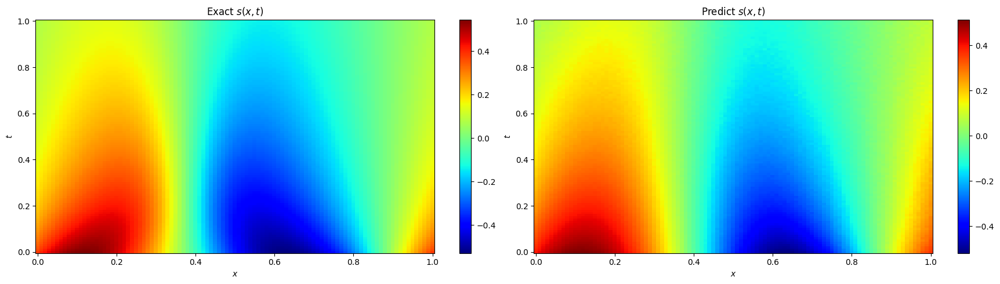

  6%|▋         | 1295/20000 [01:16<06:04, 51.39it/s, Loss=0.04606543, loss_ics=0.00028133232, loss_bcs=0.0018873392, loss_physics=0.038551446]

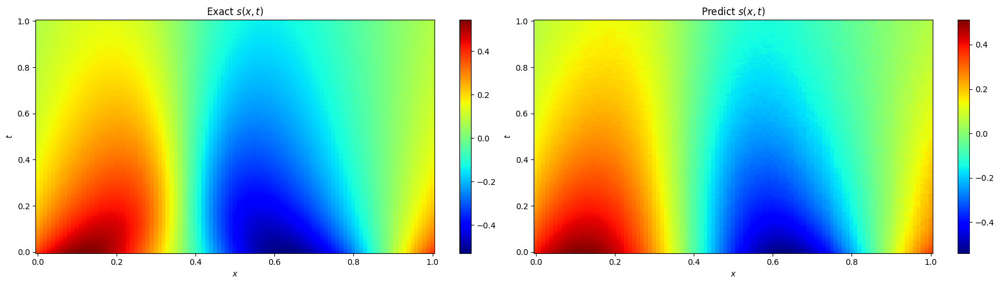

  7%|▋         | 1395/20000 [01:20<05:50, 53.07it/s, Loss=0.039155733, loss_ics=0.00024765154, loss_bcs=0.0017903681, loss_physics=0.032412335]

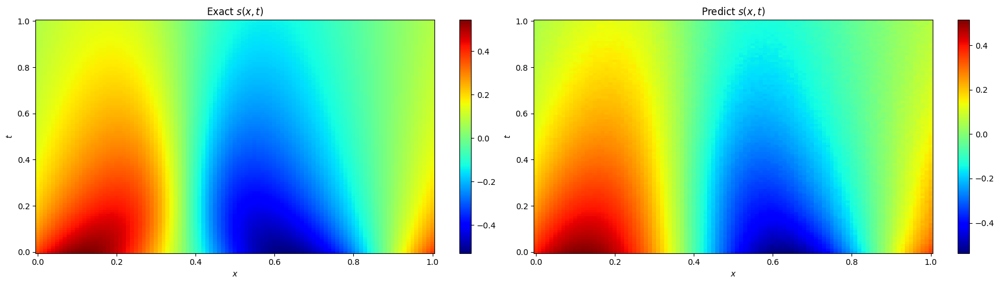

  7%|▋         | 1495/20000 [01:24<05:48, 53.11it/s, Loss=0.048585333, loss_ics=0.00065598194, loss_bcs=0.006902393, loss_physics=0.0285633]   

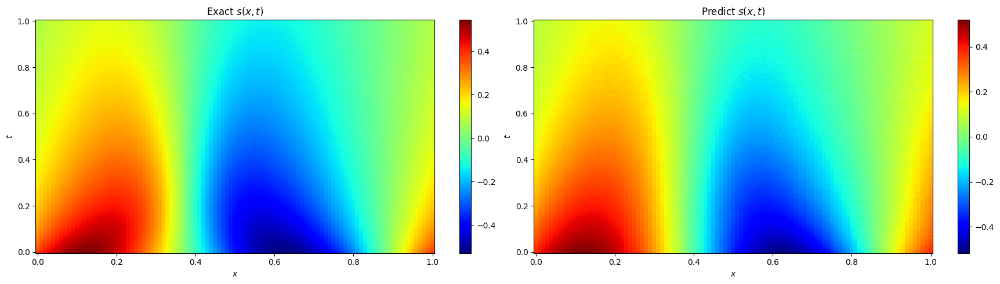

  8%|▊         | 1595/20000 [01:29<05:48, 52.89it/s, Loss=0.034335017, loss_ics=0.00019953446, loss_bcs=0.002218222, loss_physics=0.028126108]

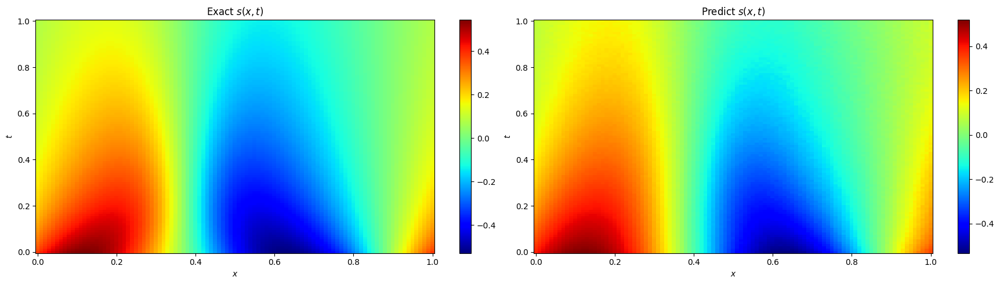

  8%|▊         | 1695/20000 [01:33<05:44, 53.10it/s, Loss=0.030906308, loss_ics=0.00015744226, loss_bcs=0.0023768542, loss_physics=0.025380608]

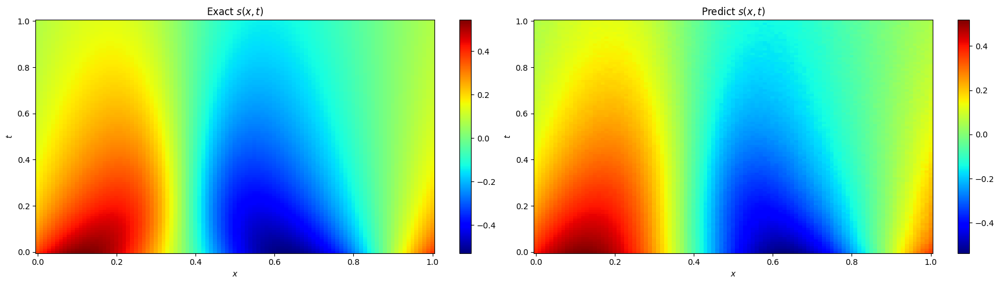

  9%|▉         | 1795/20000 [01:37<05:42, 53.13it/s, Loss=0.030477878, loss_ics=0.00016608887, loss_bcs=0.002701305, loss_physics=0.024454795] 

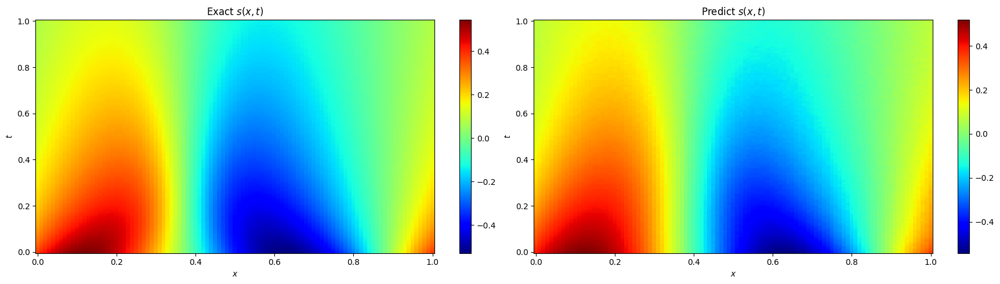

  9%|▉         | 1895/20000 [01:41<05:42, 52.90it/s, Loss=0.027194656, loss_ics=0.00016704462, loss_bcs=0.001869074, loss_physics=0.021984689]

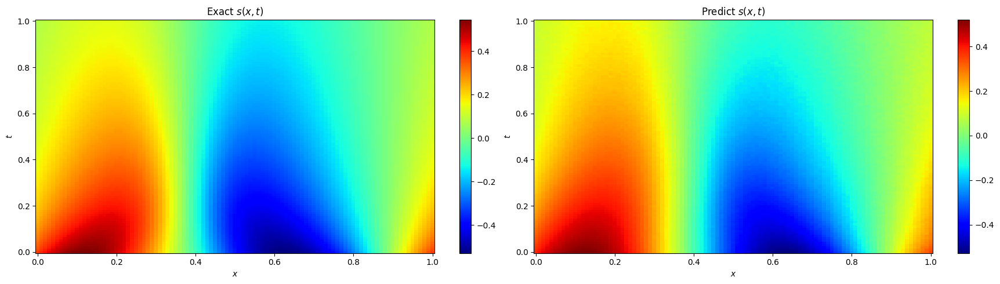

 10%|▉         | 1995/20000 [01:45<05:39, 53.06it/s, Loss=0.024571199, loss_ics=0.00012401032, loss_bcs=0.0019287376, loss_physics=0.020162255]

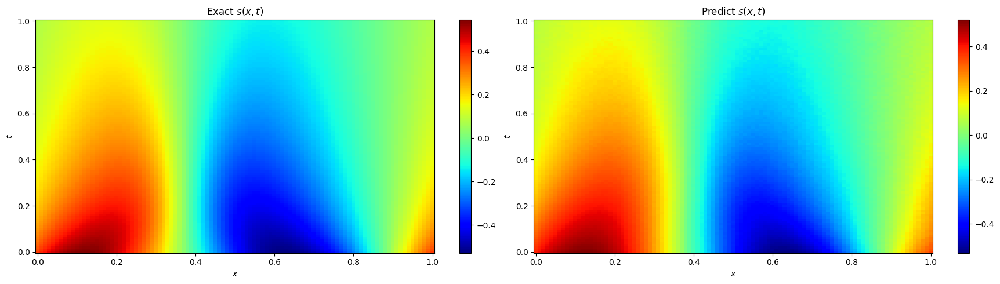

 10%|█         | 2095/20000 [01:49<05:36, 53.13it/s, Loss=0.022685228, loss_ics=0.00016876892, loss_bcs=0.0013831104, loss_physics=0.01792674] 

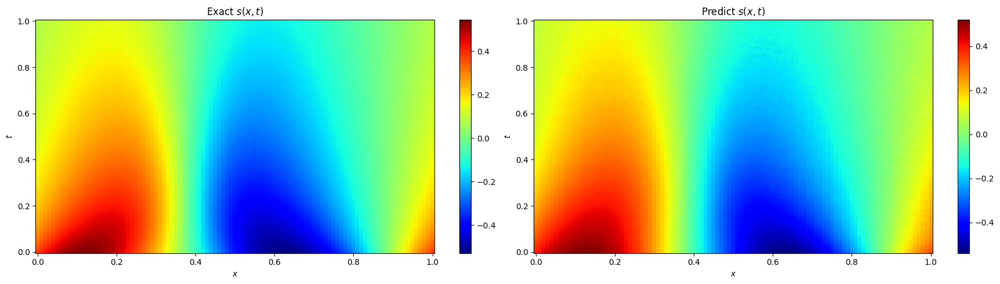

 11%|█         | 2195/20000 [01:53<05:35, 53.08it/s, Loss=0.021917013, loss_ics=0.000135353, loss_bcs=0.0014258757, loss_physics=0.017784078] 

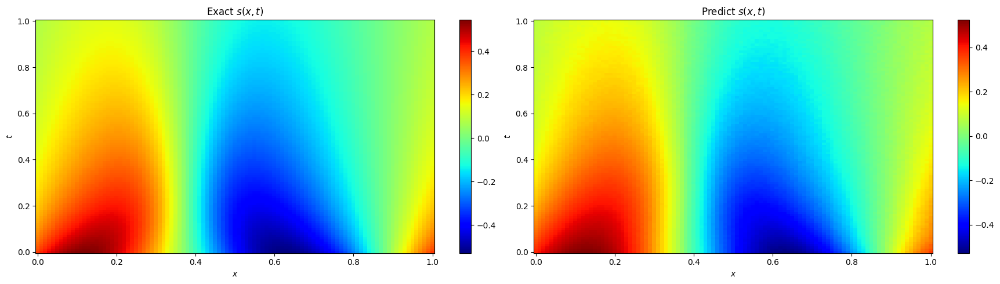

 11%|█▏        | 2295/20000 [01:57<05:34, 52.91it/s, Loss=0.020272475, loss_ics=0.00010141389, loss_bcs=0.0011440432, loss_physics=0.017100153]

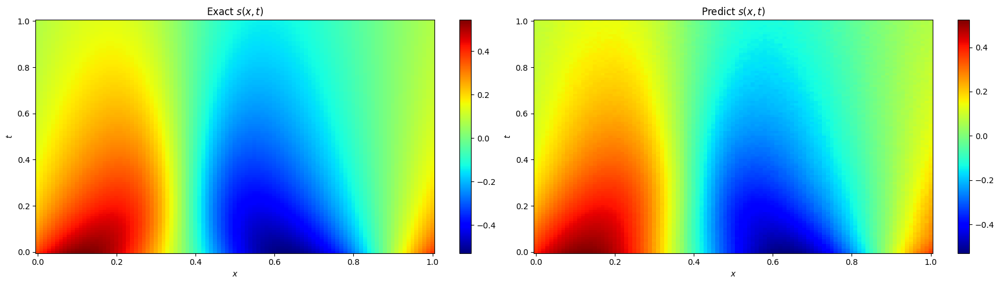

 12%|█▏        | 2395/20000 [02:01<05:31, 53.14it/s, Loss=0.019012643, loss_ics=0.00011908538, loss_bcs=0.00096512504, loss_physics=0.01566581]

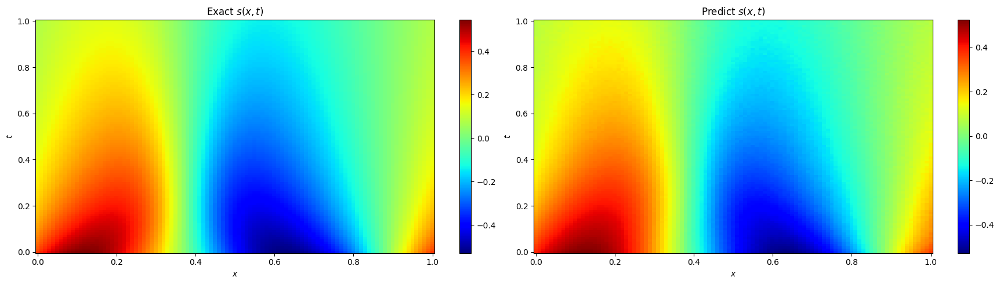

 12%|█▏        | 2495/20000 [02:05<05:29, 53.10it/s, Loss=0.047429144, loss_ics=0.0013395225, loss_bcs=0.0038350876, loss_physics=0.016803605] 

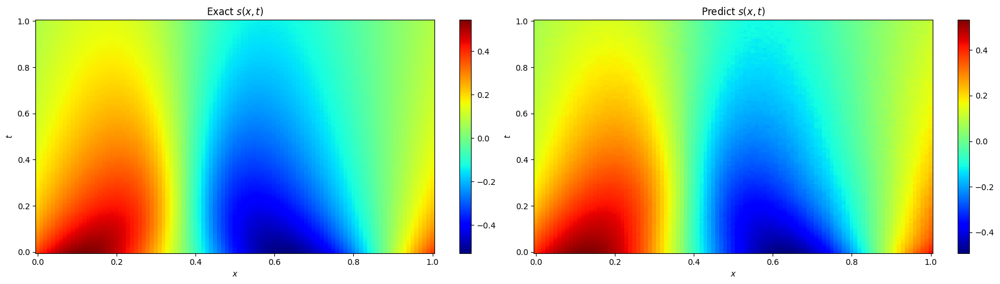

 13%|█▎        | 2595/20000 [02:09<05:29, 52.88it/s, Loss=0.020874156, loss_ics=0.00012936172, loss_bcs=0.0018364338, loss_physics=0.016450487]

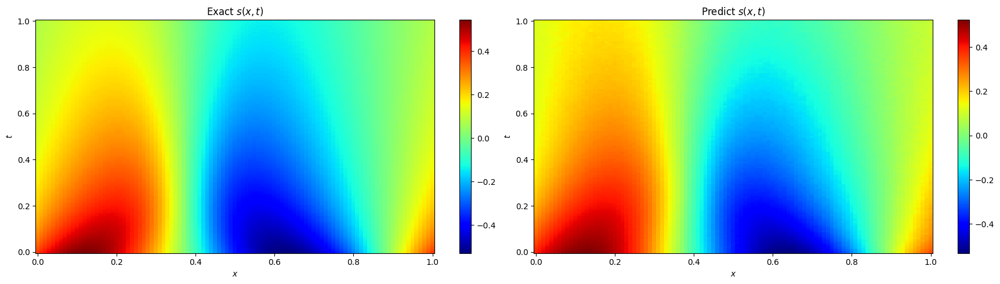

 13%|█▎        | 2695/20000 [02:13<05:25, 53.08it/s, Loss=0.020195123, loss_ics=0.0001512578, loss_bcs=0.0008701867, loss_physics=0.01629978]  

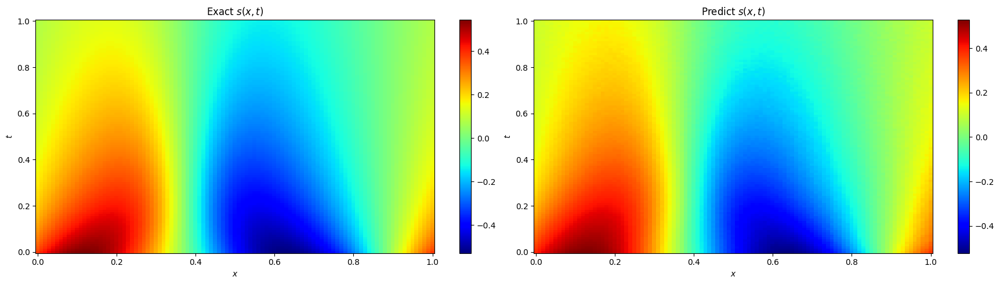

 14%|█▍        | 2795/20000 [02:17<05:23, 53.13it/s, Loss=0.018347127, loss_ics=0.00016627152, loss_bcs=0.0008705043, loss_physics=0.014151193]

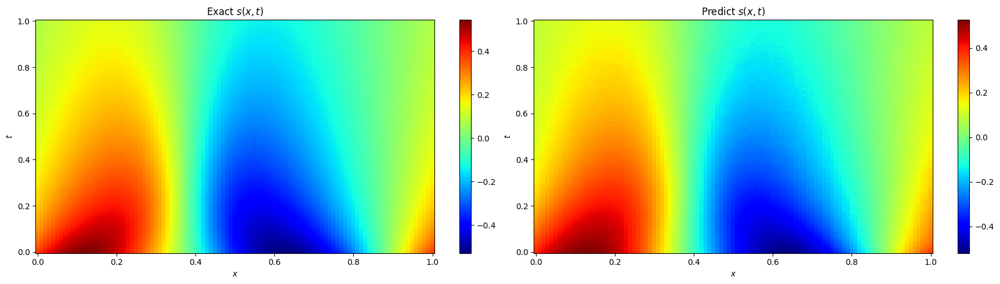

 14%|█▍        | 2895/20000 [02:21<05:23, 52.93it/s, Loss=0.01726973, loss_ics=0.000103146005, loss_bcs=0.0010502916, loss_physics=0.0141565185]

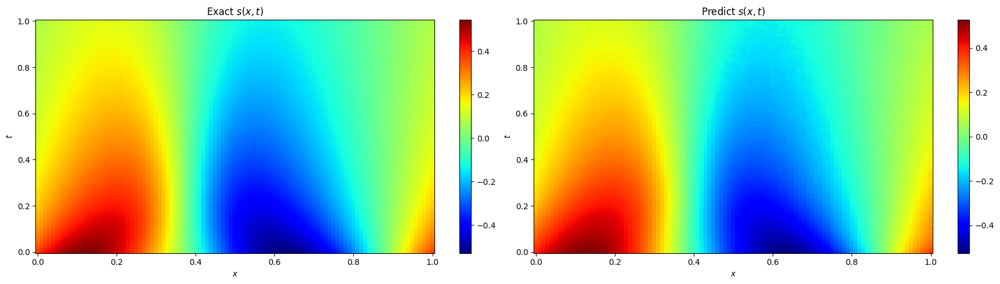

 15%|█▍        | 2995/20000 [02:25<05:20, 53.12it/s, Loss=0.017246695, loss_ics=9.912117e-05, loss_bcs=0.0011597773, loss_physics=0.014104494]  

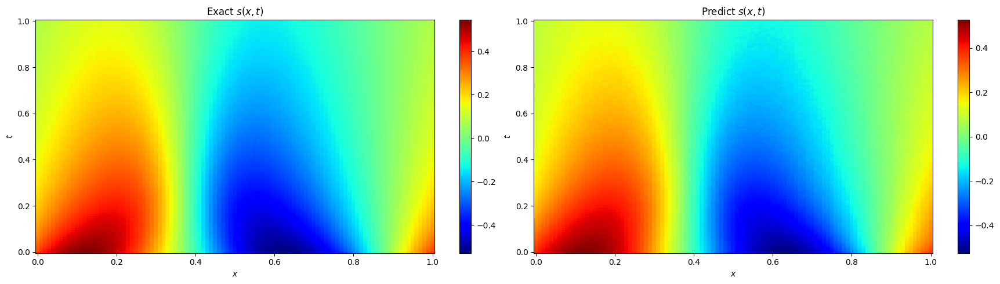

 15%|█▌        | 3095/20000 [02:29<05:18, 53.08it/s, Loss=0.015999911, loss_ics=9.42691e-05, loss_bcs=0.00076844706, loss_physics=0.013346082]

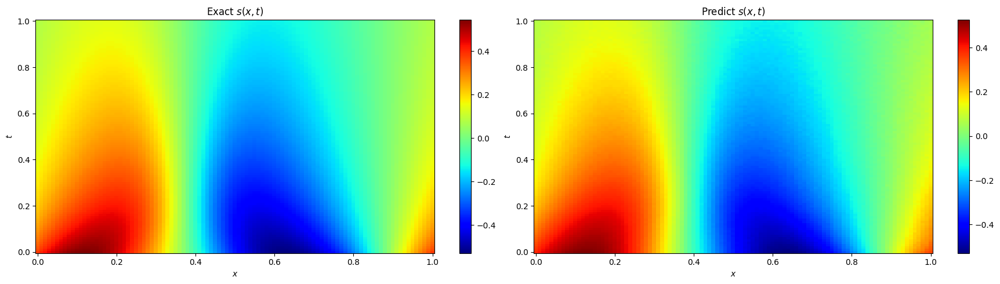

 16%|█▌        | 3200/20000 [02:34<05:14, 53.35it/s, Loss=0.016637215, loss_ics=0.00013254405, loss_bcs=0.0007392266, loss_physics=0.013247107]

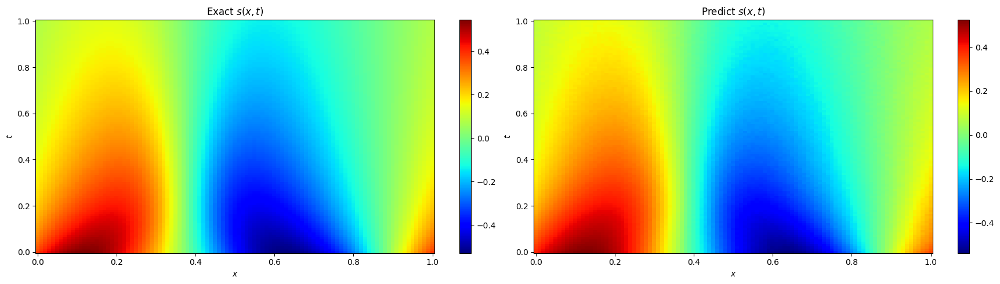

 16%|█▋        | 3296/20000 [02:38<05:14, 53.08it/s, Loss=0.015155105, loss_ics=9.740608e-05, loss_bcs=0.0011936902, loss_physics=0.012013293] 

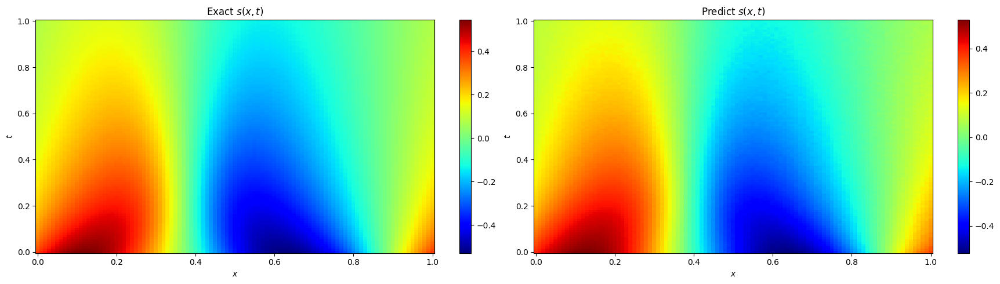

 17%|█▋        | 3395/20000 [02:42<05:12, 53.10it/s, Loss=0.013425237, loss_ics=8.104605e-05, loss_bcs=0.0005995055, loss_physics=0.01120481] 

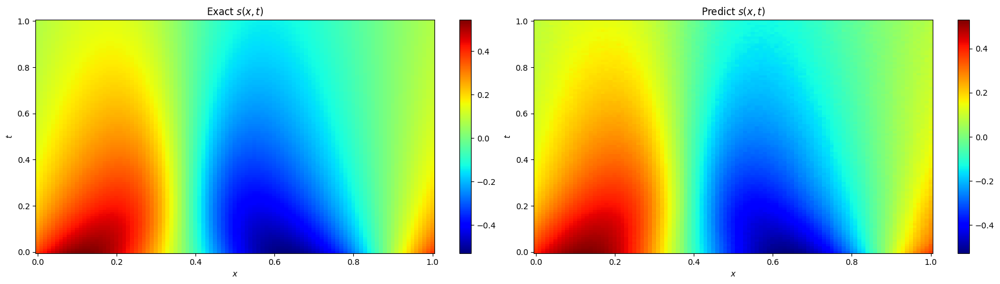

 17%|█▋        | 3495/20000 [02:46<05:11, 53.06it/s, Loss=0.014791438, loss_ics=9.0346715e-05, loss_bcs=0.0019377961, loss_physics=0.011046708]

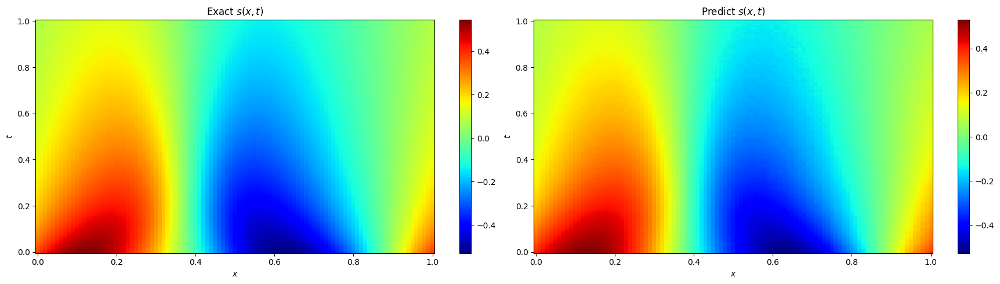

 18%|█▊        | 3595/20000 [02:50<05:10, 52.92it/s, Loss=0.013569779, loss_ics=8.8449495e-05, loss_bcs=0.0007579714, loss_physics=0.0110428175]

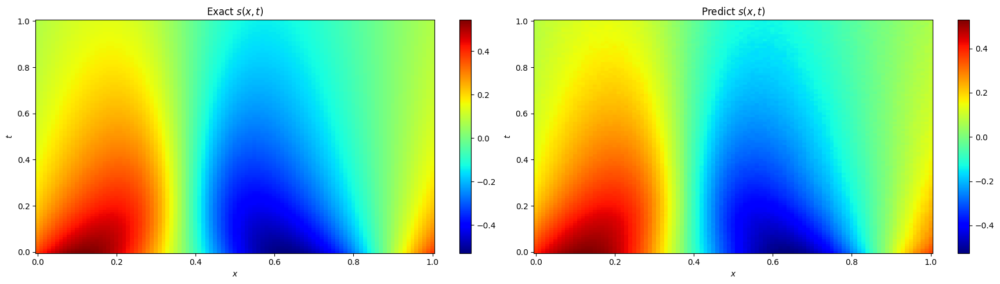

 18%|█▊        | 3700/20000 [02:54<05:04, 53.50it/s, Loss=0.012181465, loss_ics=8.585679e-05, loss_bcs=0.000588009, loss_physics=0.009876319]   

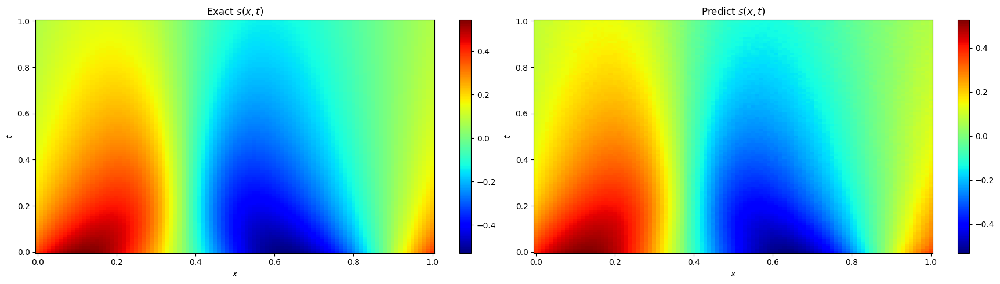

 19%|█▉        | 3796/20000 [02:58<05:05, 53.03it/s, Loss=0.014471187, loss_ics=0.00012911491, loss_bcs=0.002237939, loss_physics=0.00965095]

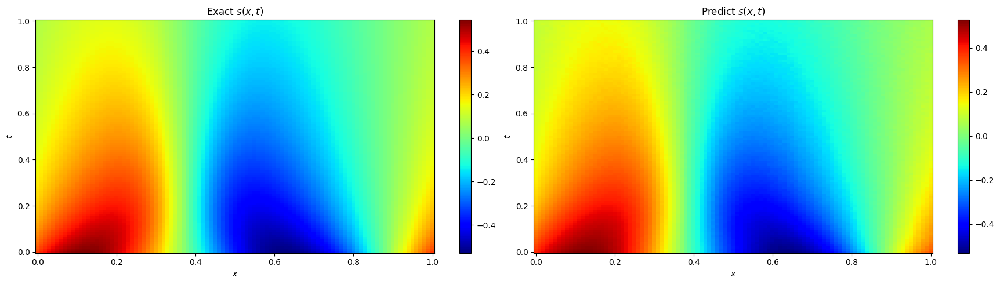

 19%|█▉        | 3895/20000 [03:02<05:04, 52.94it/s, Loss=0.019730257, loss_ics=0.00033182657, loss_bcs=0.0029162127, loss_physics=0.010177514]

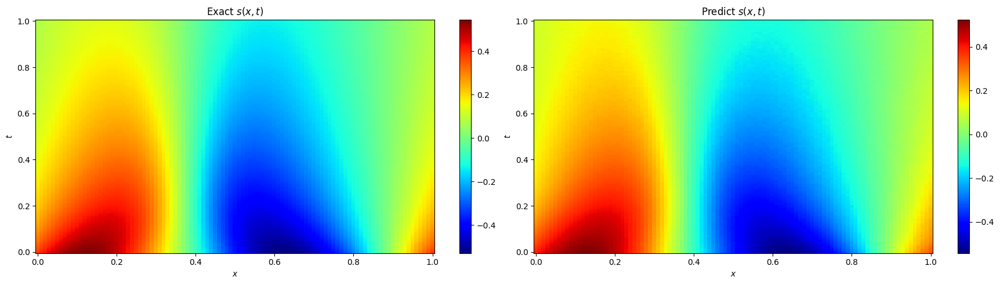

 20%|█▉        | 3995/20000 [03:06<05:01, 53.08it/s, Loss=0.011425264, loss_ics=9.038878e-05, loss_bcs=0.00061640935, loss_physics=0.009001079]

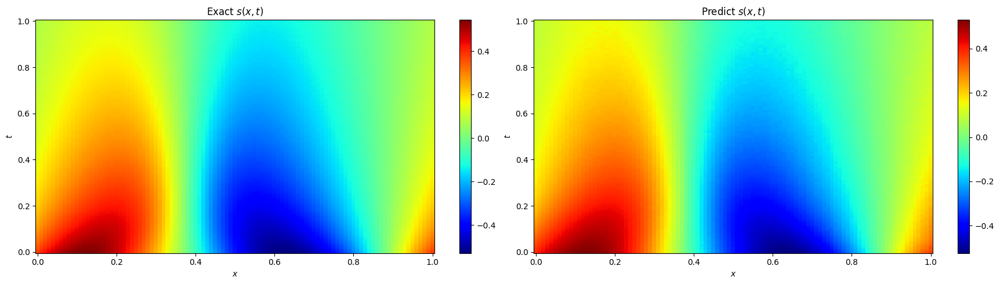

 20%|██        | 4095/20000 [03:10<04:59, 53.03it/s, Loss=0.010584628, loss_ics=7.986642e-05, loss_bcs=0.0007794749, loss_physics=0.008207825] 

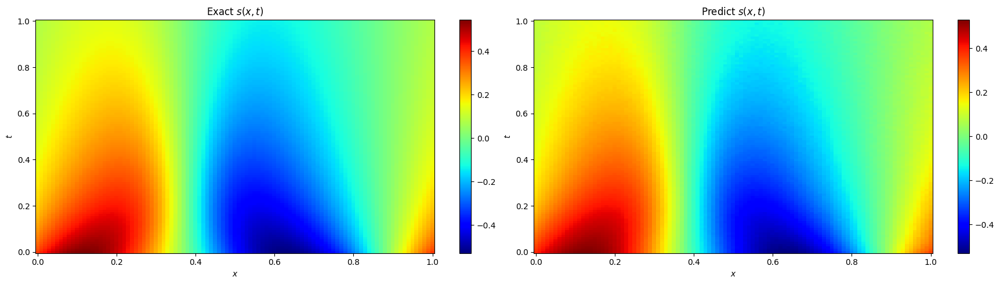

 21%|██        | 4195/20000 [03:14<04:58, 52.90it/s, Loss=0.00977932, loss_ics=7.172296e-05, loss_bcs=0.0005324279, loss_physics=0.007812433] 

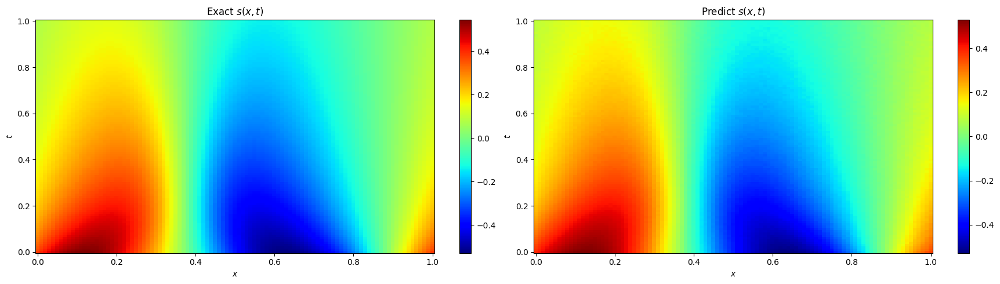

 21%|██▏       | 4295/20000 [03:18<04:55, 53.12it/s, Loss=0.010091359, loss_ics=7.487883e-05, loss_bcs=0.0007155003, loss_physics=0.007878282]

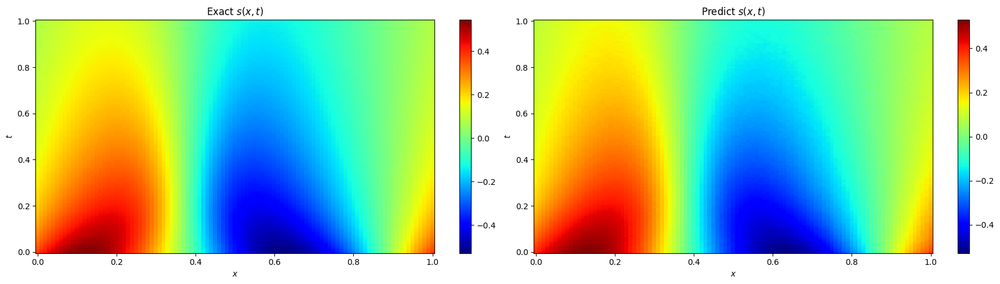

 22%|██▏       | 4395/20000 [03:22<04:54, 53.03it/s, Loss=0.010146663, loss_ics=7.2055744e-05, loss_bcs=0.0008137107, loss_physics=0.0078918375]

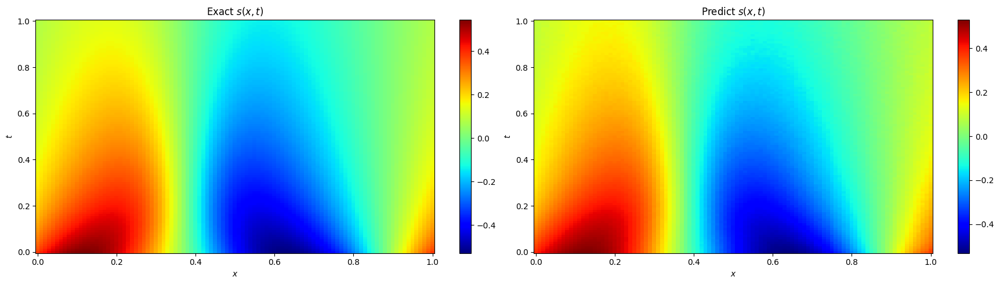

 22%|██▏       | 4495/20000 [03:27<04:52, 52.93it/s, Loss=0.024458688, loss_ics=0.0007361335, loss_bcs=0.0022502309, loss_physics=0.007485789]  

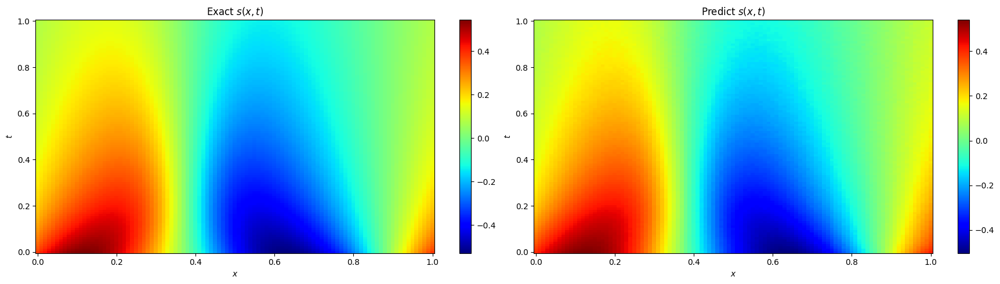

 23%|██▎       | 4595/20000 [03:31<04:50, 53.05it/s, Loss=0.010864589, loss_ics=0.00011181825, loss_bcs=0.0017588215, loss_physics=0.006869403]

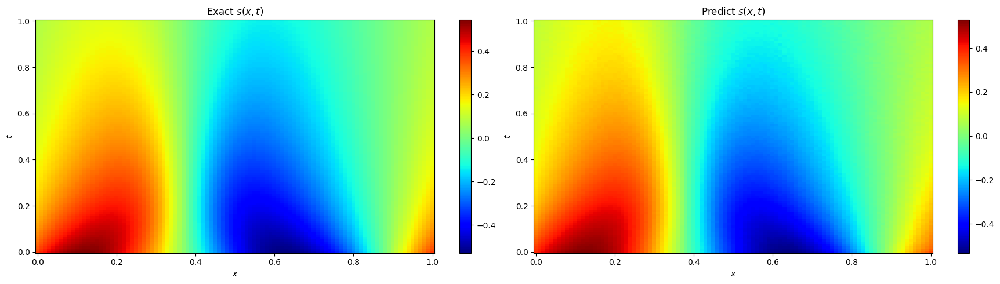

 23%|██▎       | 4695/20000 [03:35<04:48, 53.04it/s, Loss=0.00830799, loss_ics=8.227246e-05, loss_bcs=0.00041298172, loss_physics=0.0062495586]

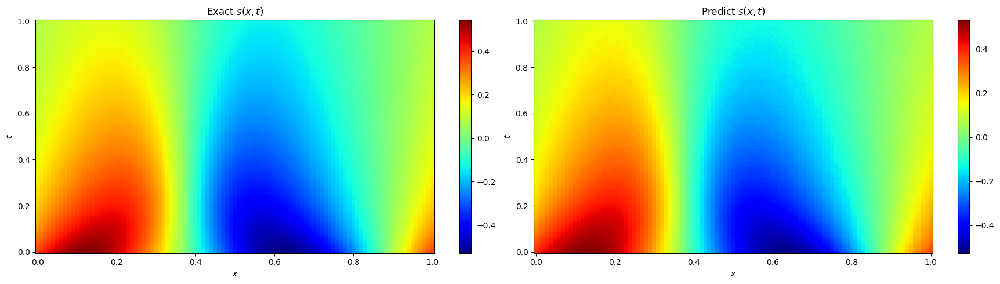

 24%|██▍       | 4800/20000 [03:39<04:44, 53.36it/s, Loss=0.007450384, loss_ics=6.6316454e-05, loss_bcs=0.00069288973, loss_physics=0.0054311655]

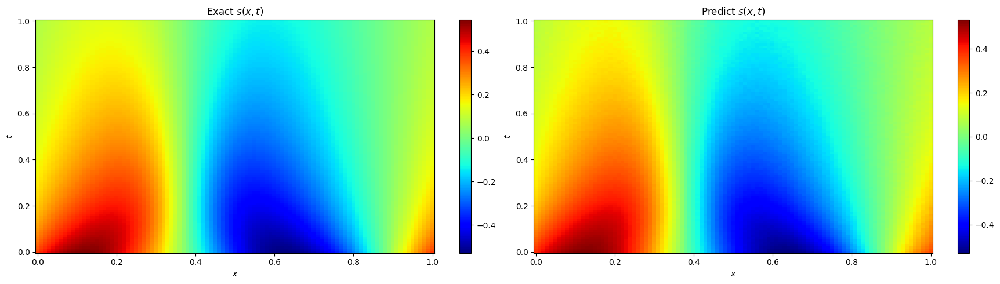

 24%|██▍       | 4897/20000 [03:43<04:43, 53.18it/s, Loss=0.015641998, loss_ics=0.00040206, loss_bcs=0.0015298997, loss_physics=0.0060708993]    

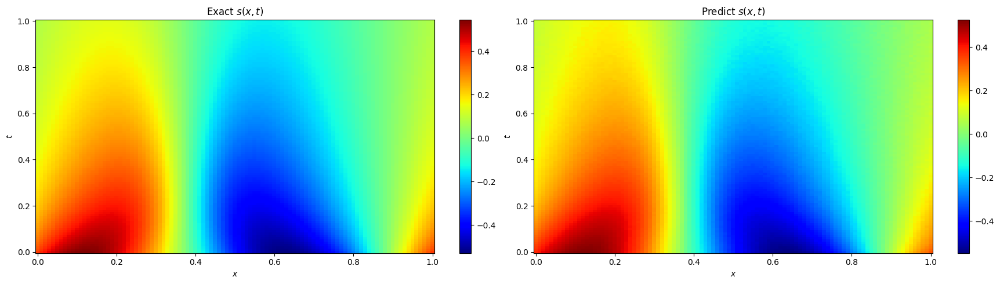

 25%|██▍       | 4995/20000 [03:47<04:42, 53.03it/s, Loss=0.009095004, loss_ics=0.00017388015, loss_bcs=0.00083081657, loss_physics=0.0047865845]

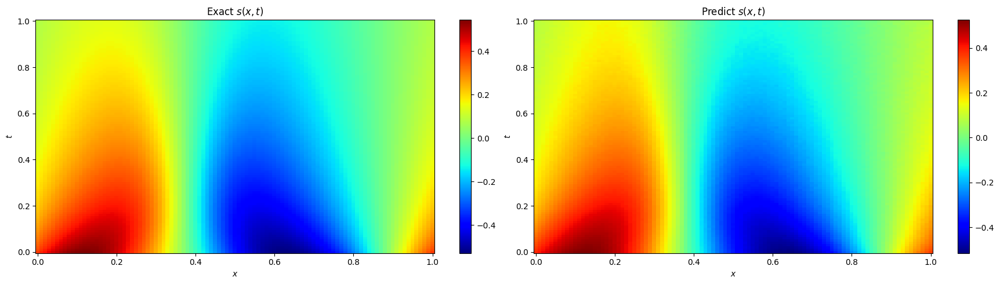

 25%|██▌       | 5095/20000 [03:51<04:41, 52.89it/s, Loss=0.007514911, loss_ics=7.923492e-05, loss_bcs=0.00092498446, loss_physics=0.005005228]  

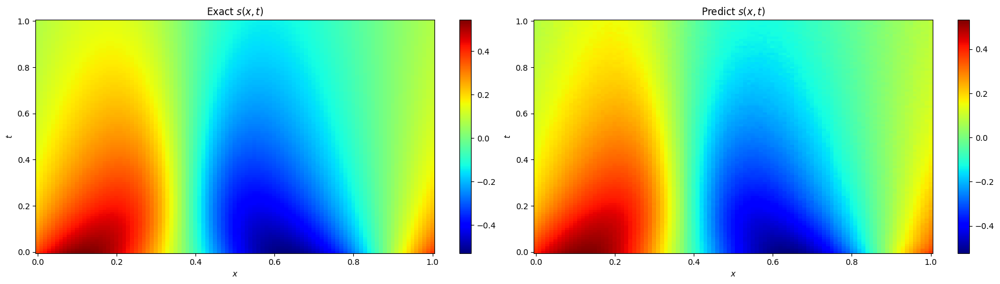

 26%|██▌       | 5195/20000 [03:55<04:38, 53.10it/s, Loss=0.0057576005, loss_ics=6.048715e-05, loss_bcs=0.0003750812, loss_physics=0.0041727764]

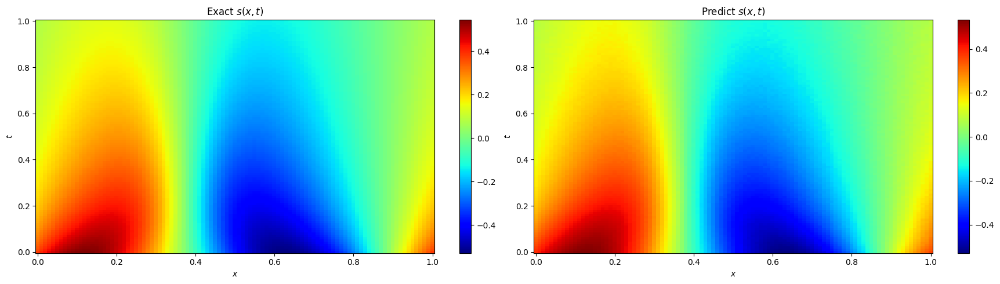

 26%|██▋       | 5300/20000 [03:59<04:35, 53.42it/s, Loss=0.0069392137, loss_ics=9.530449e-05, loss_bcs=0.00079528405, loss_physics=0.00423784] 

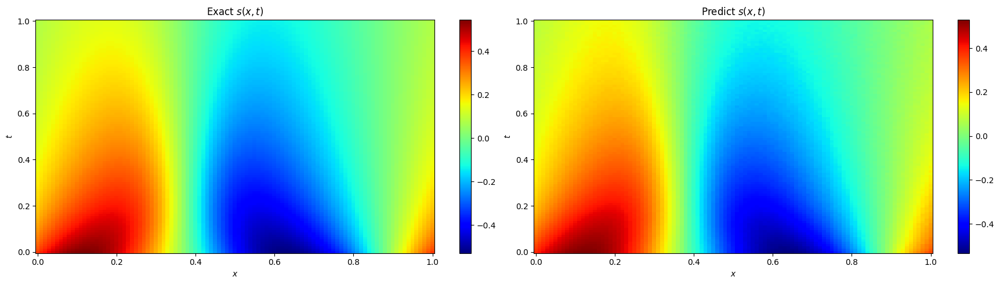

 27%|██▋       | 5396/20000 [04:03<04:35, 52.91it/s, Loss=0.005438283, loss_ics=6.4111526e-05, loss_bcs=0.0004123846, loss_physics=0.003743668]

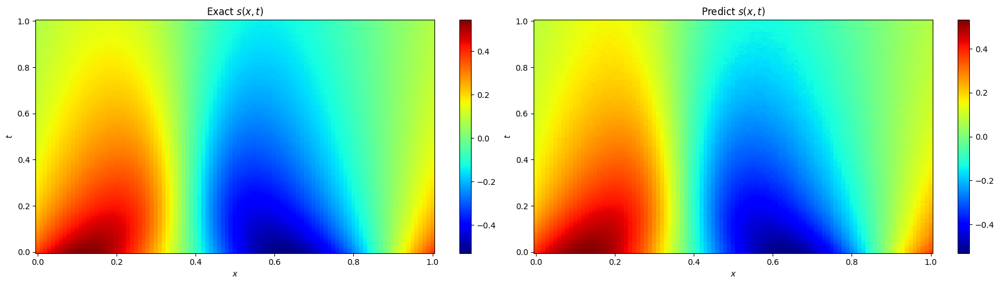

 27%|██▋       | 5495/20000 [04:08<04:33, 53.12it/s, Loss=0.009735519, loss_ics=0.000195683, loss_bcs=0.002224364, loss_physics=0.0035974954]  

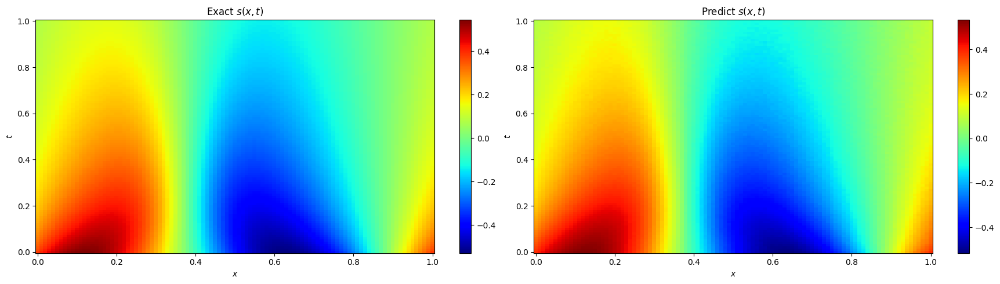

 28%|██▊       | 5595/20000 [04:12<04:31, 53.03it/s, Loss=0.005584352, loss_ics=7.0270115e-05, loss_bcs=0.00037893193, loss_physics=0.003800018]

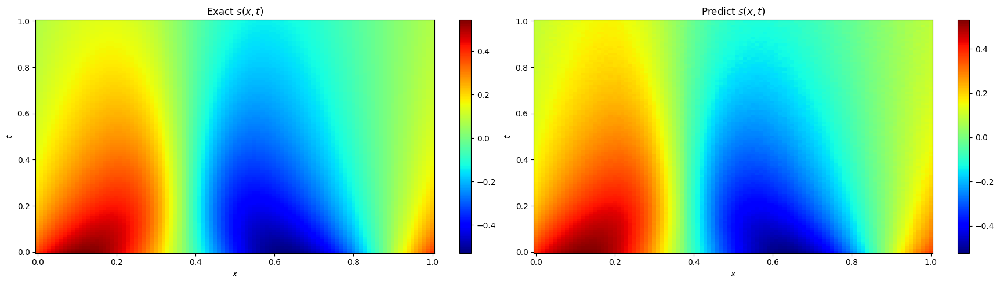

 28%|██▊       | 5695/20000 [04:15<04:29, 53.11it/s, Loss=0.005641697, loss_ics=7.3067335e-05, loss_bcs=0.00038087112, loss_physics=0.0037994795]

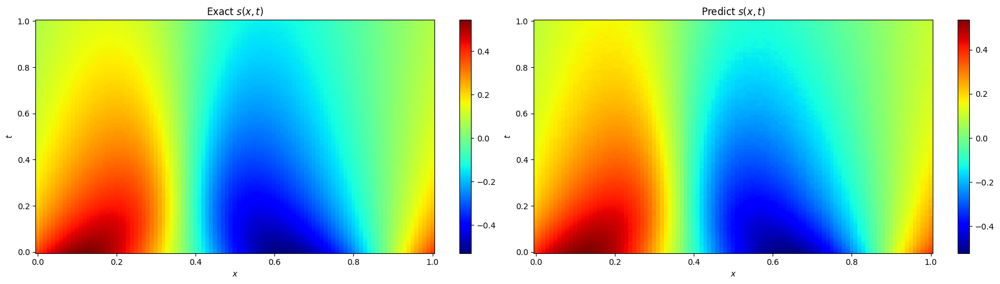

 29%|██▉       | 5800/20000 [04:20<04:26, 53.37it/s, Loss=0.011929583, loss_ics=0.00026323035, loss_bcs=0.0034340532, loss_physics=0.0032309215] 

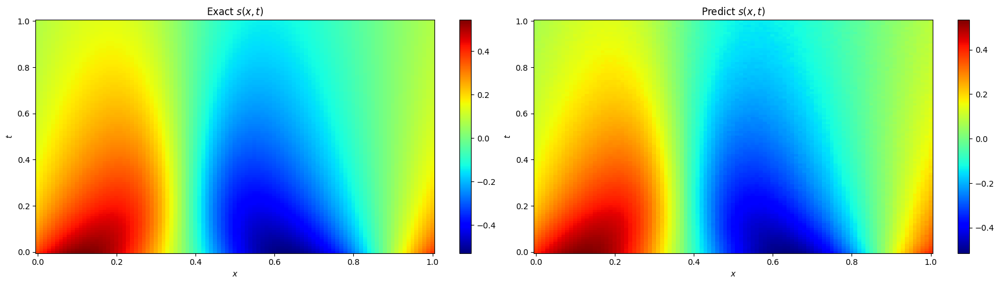

 29%|██▉       | 5896/20000 [04:24<04:26, 52.96it/s, Loss=0.00809236, loss_ics=0.00011044969, loss_bcs=0.002988425, loss_physics=0.0028949406]  

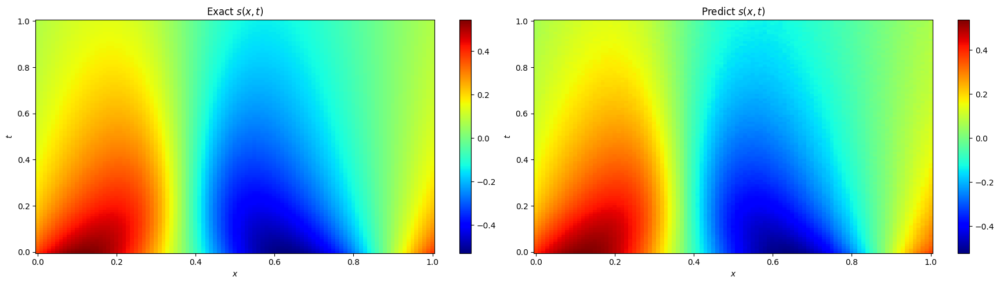

 30%|██▉       | 5995/20000 [04:28<04:23, 53.11it/s, Loss=0.0070254942, loss_ics=0.00015645567, loss_bcs=0.0012252345, loss_physics=0.0026711463]

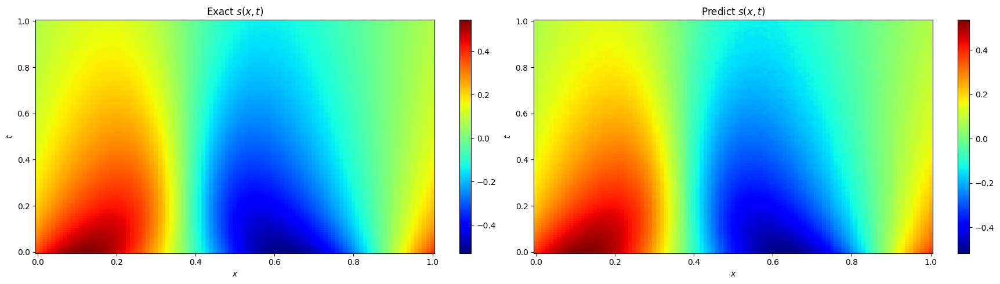

 30%|███       | 6095/20000 [04:32<04:22, 52.92it/s, Loss=0.004286182, loss_ics=6.113216e-05, loss_bcs=0.0003157024, loss_physics=0.0027478368]  

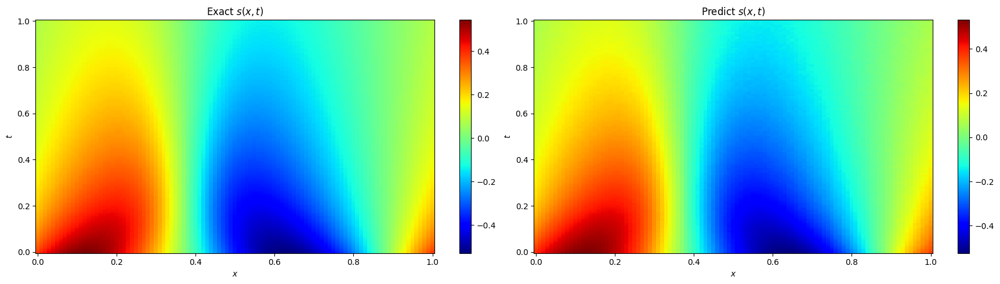

 31%|███       | 6195/20000 [04:36<04:20, 52.91it/s, Loss=0.007989005, loss_ics=0.00015944085, loss_bcs=0.0018755277, loss_physics=0.00292466] 

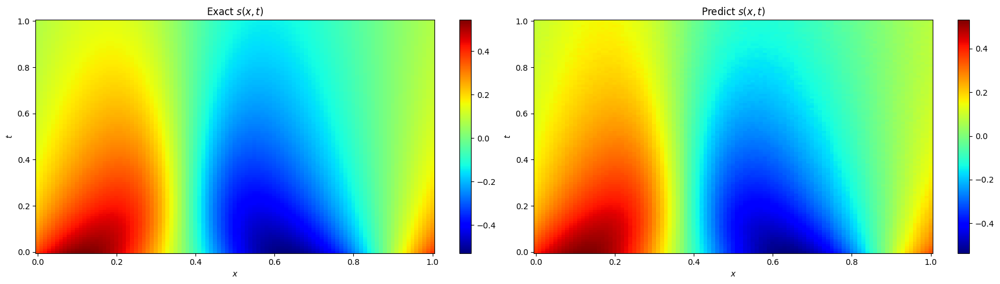

 31%|███▏      | 6295/20000 [04:40<04:18, 53.09it/s, Loss=0.0037995344, loss_ics=5.1746225e-05, loss_bcs=0.00030919124, loss_physics=0.0024554187]

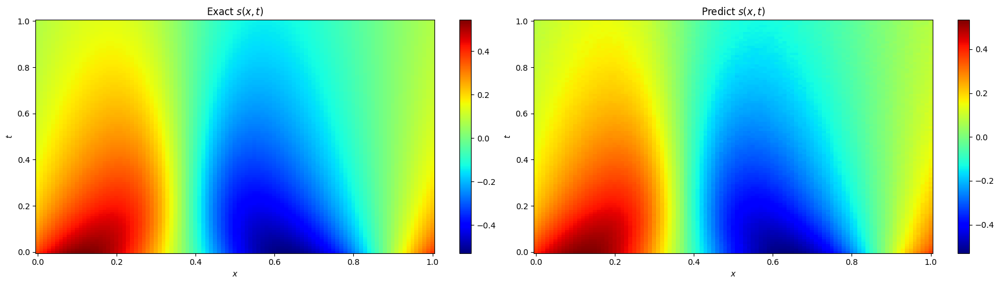

 32%|███▏      | 6395/20000 [04:45<04:17, 52.93it/s, Loss=0.0058346735, loss_ics=0.0001367951, loss_bcs=0.00062902283, loss_physics=0.002469749]  

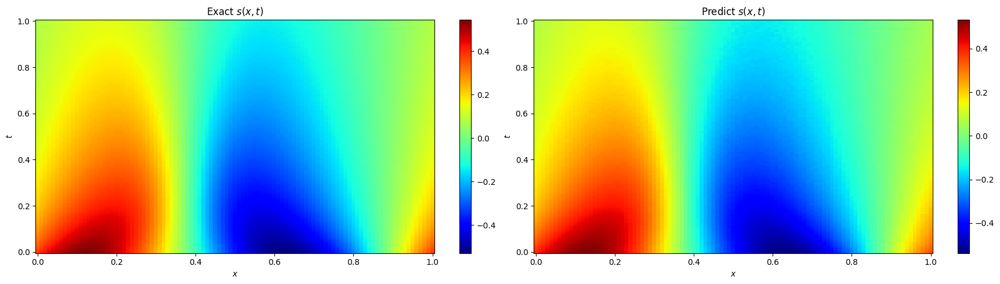

 32%|███▏      | 6495/20000 [04:49<04:14, 53.05it/s, Loss=0.003466253, loss_ics=4.654261e-05, loss_bcs=0.00027994195, loss_physics=0.0022554589]

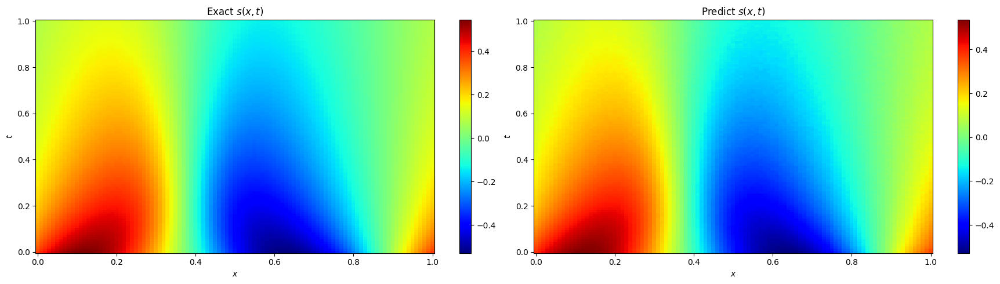

 33%|███▎      | 6595/20000 [04:53<04:12, 53.09it/s, Loss=0.0042350087, loss_ics=7.84532e-05, loss_bcs=0.00042707223, loss_physics=0.0022388722]

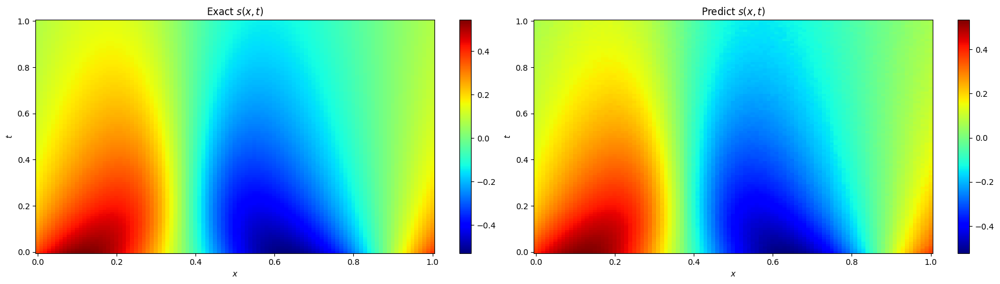

 33%|███▎      | 6695/20000 [04:57<04:11, 52.92it/s, Loss=0.0035354225, loss_ics=5.8153586e-05, loss_bcs=0.00033880398, loss_physics=0.0020335468]

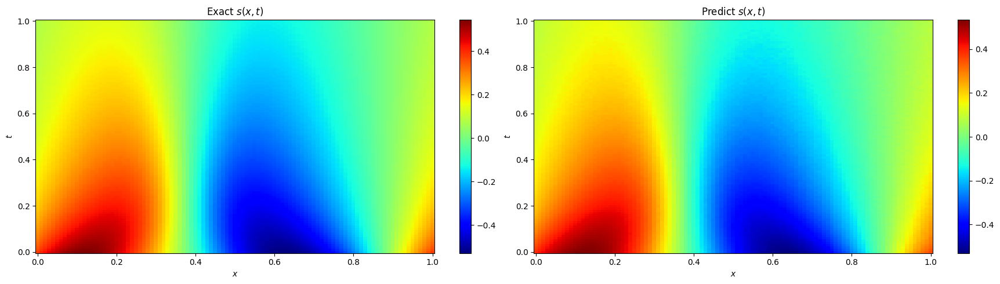

 34%|███▍      | 6795/20000 [05:01<04:09, 52.92it/s, Loss=0.0039184485, loss_ics=5.2871423e-05, loss_bcs=0.0007747199, loss_physics=0.0020863004] 

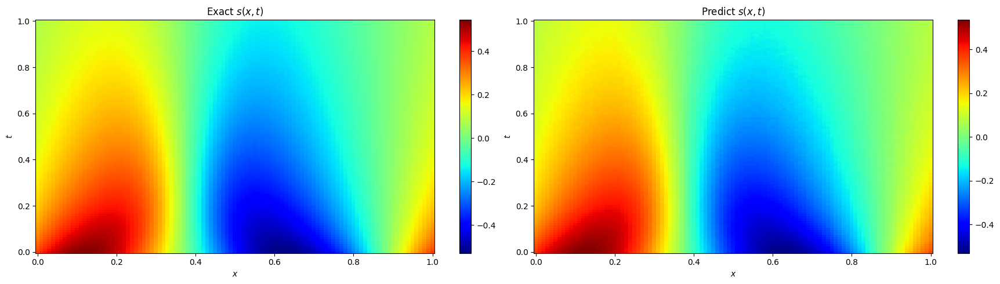

 34%|███▍      | 6900/20000 [05:05<04:04, 53.47it/s, Loss=0.003132738, loss_ics=5.205845e-05, loss_bcs=0.00031055993, loss_physics=0.0017810089] 

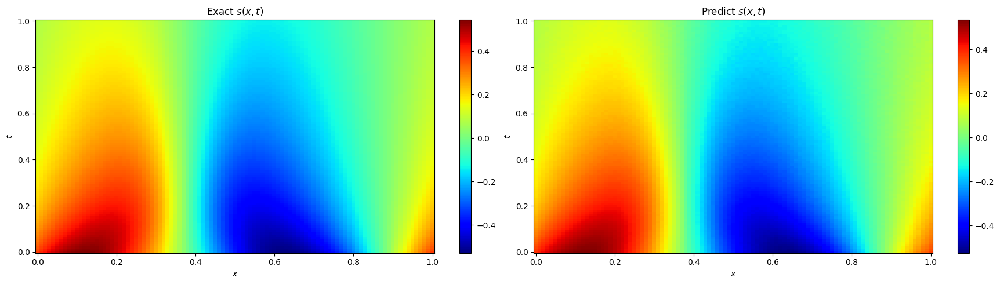

 35%|███▍      | 6997/20000 [05:10<04:06, 52.84it/s, Loss=0.00687055, loss_ics=7.1564806e-05, loss_bcs=0.0030095987, loss_physics=0.0024296553] 

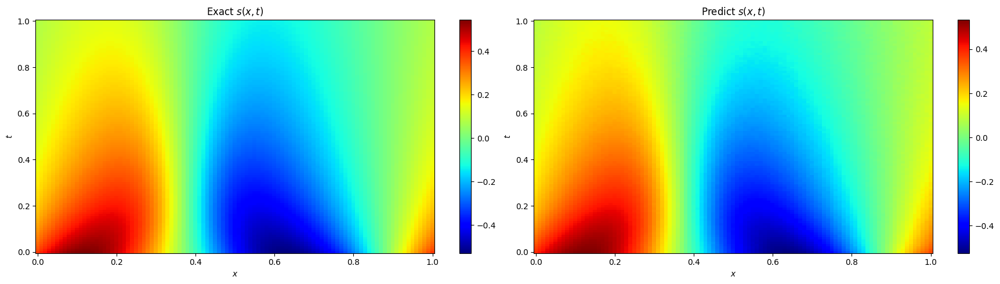

 35%|███▌      | 7095/20000 [05:14<04:03, 52.94it/s, Loss=0.0025052822, loss_ics=4.0966253e-05, loss_bcs=0.0002462336, loss_physics=0.0014397234]

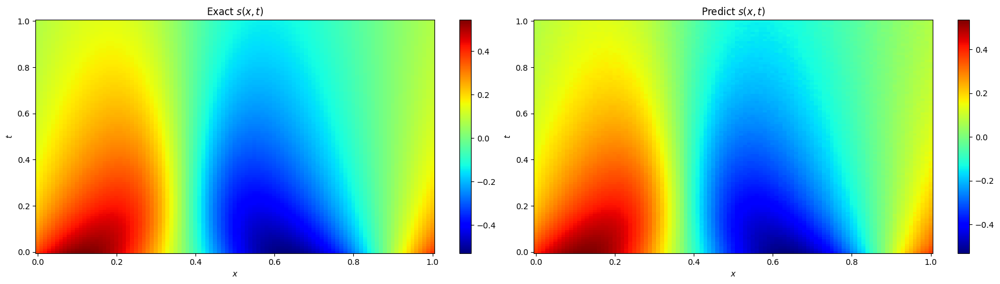

 36%|███▌      | 7195/20000 [05:18<04:01, 53.08it/s, Loss=0.0036800252, loss_ics=4.4761782e-05, loss_bcs=0.00024104743, loss_physics=0.0025437423]

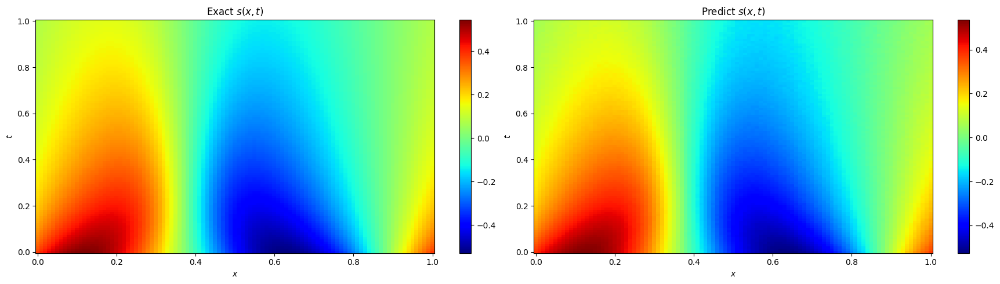

 36%|███▋      | 7295/20000 [05:22<03:59, 53.06it/s, Loss=0.0033751014, loss_ics=7.2424096e-05, loss_bcs=0.00025321168, loss_physics=0.0016734079]

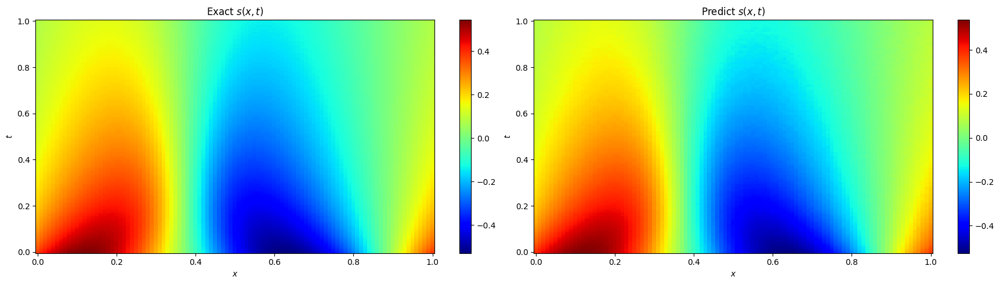

 37%|███▋      | 7395/20000 [05:26<03:58, 52.84it/s, Loss=0.0032077255, loss_ics=4.2062093e-05, loss_bcs=0.0006820255, loss_physics=0.0016844581] 

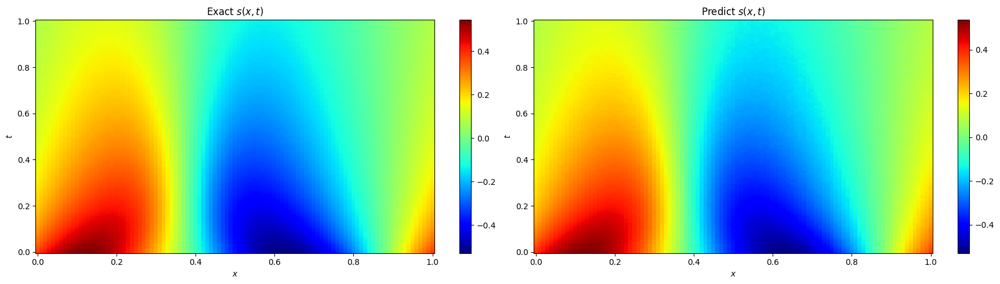

 37%|███▋      | 7495/20000 [05:30<03:56, 52.97it/s, Loss=0.0028793544, loss_ics=4.0523886e-05, loss_bcs=0.00020246032, loss_physics=0.0018664164]

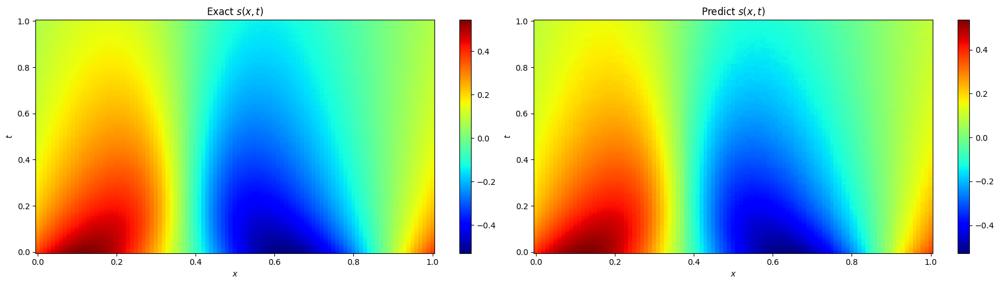

 38%|███▊      | 7595/20000 [05:34<03:53, 53.08it/s, Loss=0.002502706, loss_ics=3.8798044e-05, loss_bcs=0.00030014143, loss_physics=0.0014266038] 

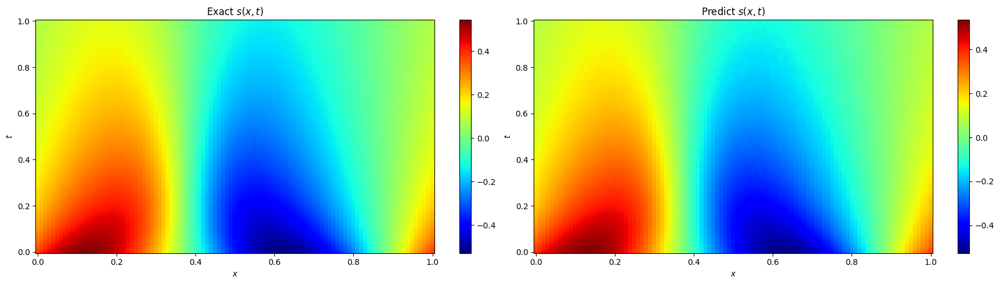

 38%|███▊      | 7695/20000 [05:39<03:53, 52.73it/s, Loss=0.0025921916, loss_ics=4.8362213e-05, loss_bcs=0.00021312937, loss_physics=0.001411818]

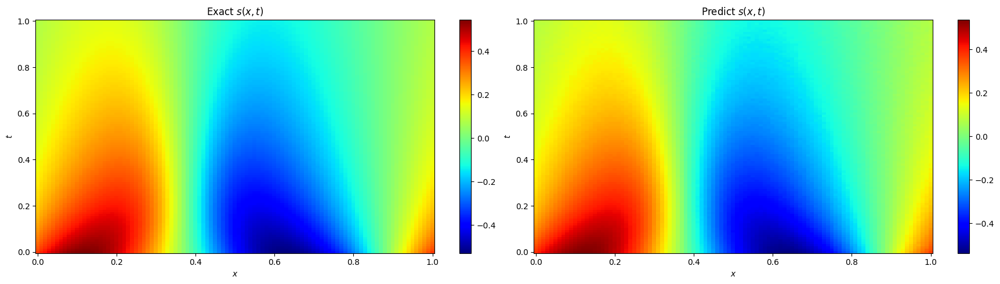

 39%|███▉      | 7795/20000 [05:43<03:50, 52.95it/s, Loss=0.00252752, loss_ics=4.100536e-05, loss_bcs=0.00019706521, loss_physics=0.0015103476]  

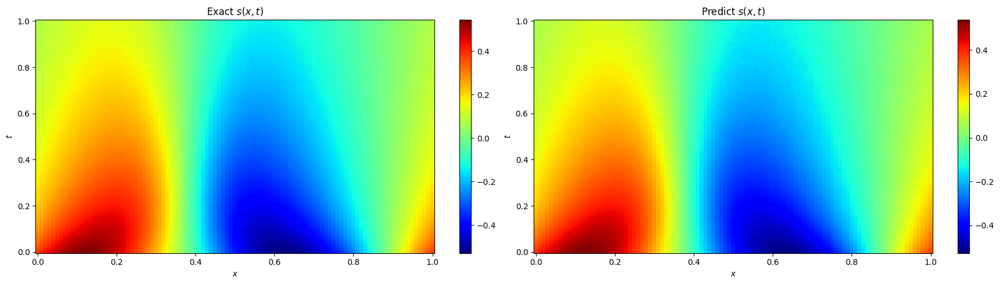

 39%|███▉      | 7895/20000 [05:47<03:48, 53.00it/s, Loss=0.008595427, loss_ics=0.00020940868, loss_bcs=0.0020228282, loss_physics=0.0023844251]

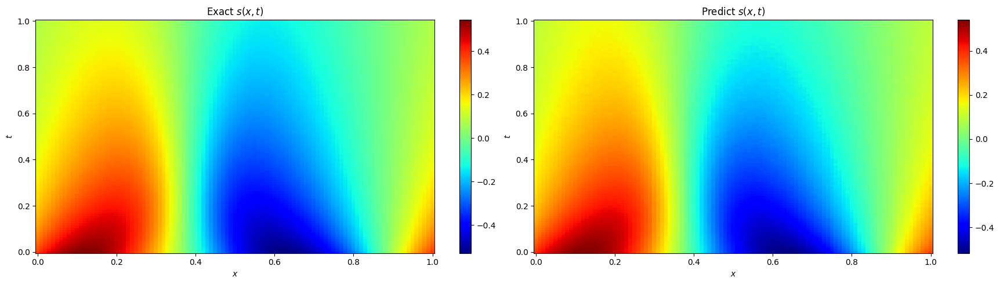

 40%|███▉      | 7995/20000 [05:51<03:47, 52.81it/s, Loss=0.0032121069, loss_ics=6.468371e-05, loss_bcs=0.0005075664, loss_physics=0.0014108663]

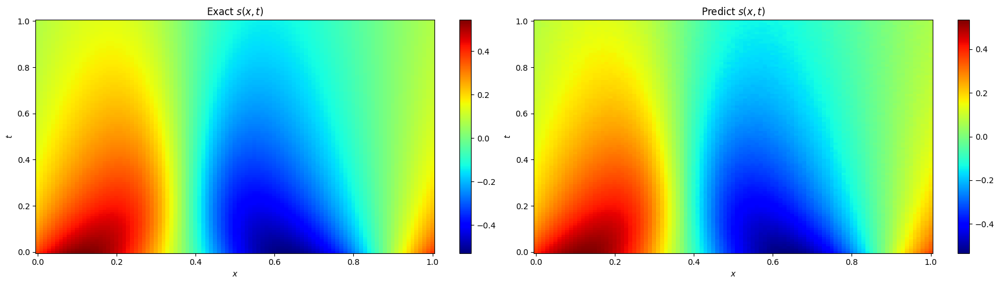

 40%|████      | 8095/20000 [05:56<03:44, 53.07it/s, Loss=0.004122647, loss_ics=0.000110773086, loss_bcs=0.00041509682, loss_physics=0.0014920883]

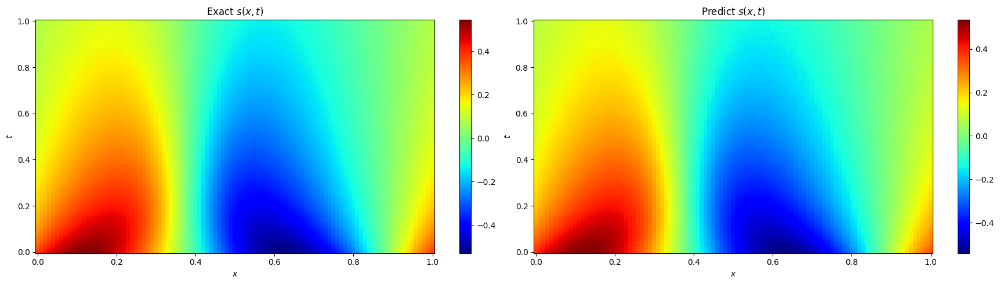

 41%|████      | 8195/20000 [06:00<03:42, 53.05it/s, Loss=0.0024058616, loss_ics=4.6023313e-05, loss_bcs=0.00019532029, loss_physics=0.001290075] 

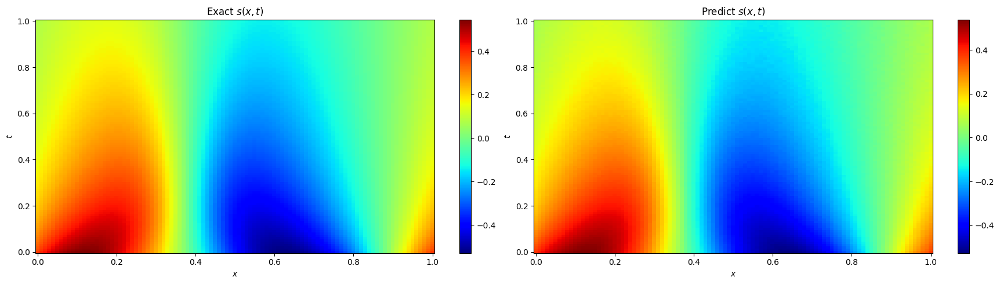

 41%|████▏     | 8295/20000 [06:04<03:41, 52.93it/s, Loss=0.0022271846, loss_ics=3.7358695e-05, loss_bcs=0.00019943647, loss_physics=0.0012805742]

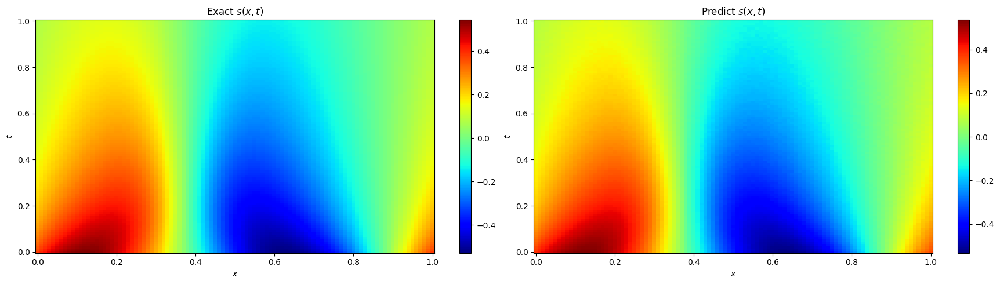

 42%|████▏     | 8395/20000 [06:08<03:39, 52.83it/s, Loss=0.002057335, loss_ics=3.1987238e-05, loss_bcs=0.00016672793, loss_physics=0.0012508624] 

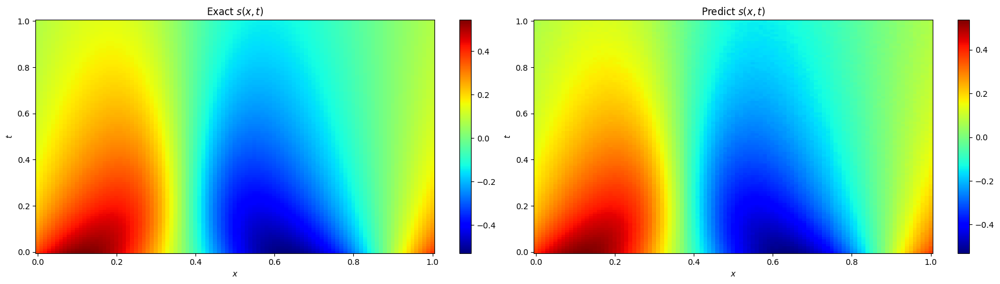

 42%|████▏     | 8495/20000 [06:12<03:36, 53.12it/s, Loss=0.0023627975, loss_ics=4.660373e-05, loss_bcs=0.00020237206, loss_physics=0.0012283507]

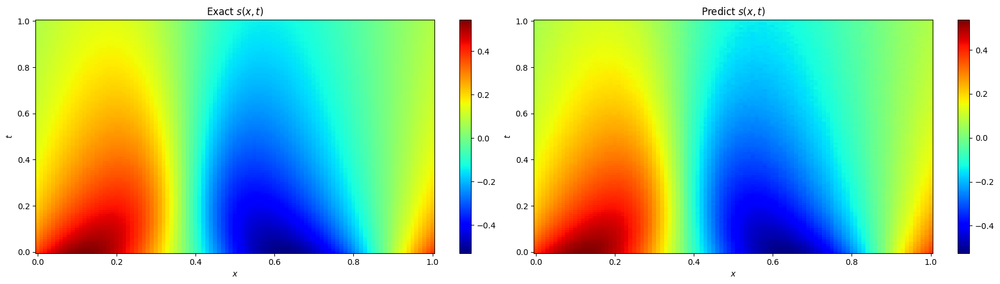

 43%|████▎     | 8600/20000 [06:16<03:33, 53.46it/s, Loss=0.0024422319, loss_ics=3.7915524e-05, loss_bcs=0.0005167944, loss_physics=0.001167127] 

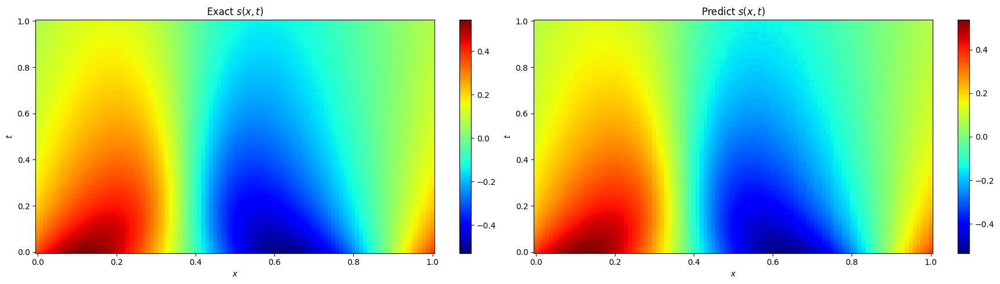

 43%|████▎     | 8696/20000 [06:20<03:33, 52.94it/s, Loss=0.0025609005, loss_ics=3.8068993e-05, loss_bcs=0.00020755231, loss_physics=0.0015919682]

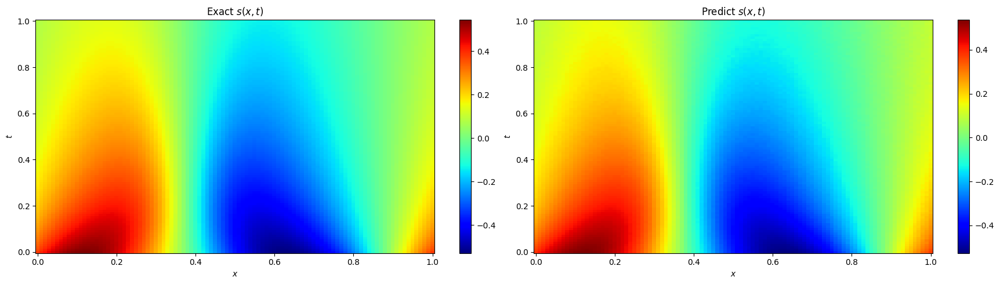

 44%|████▍     | 8795/20000 [06:24<03:31, 53.07it/s, Loss=0.0022400788, loss_ics=3.7884103e-05, loss_bcs=0.00022749903, loss_physics=0.0012548977]

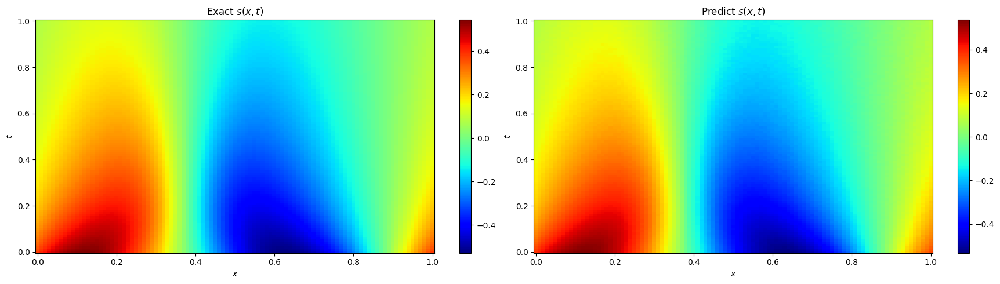

 44%|████▍     | 8895/20000 [06:28<03:29, 53.00it/s, Loss=0.0025991732, loss_ics=5.9315917e-05, loss_bcs=0.00026473746, loss_physics=0.0011481174]

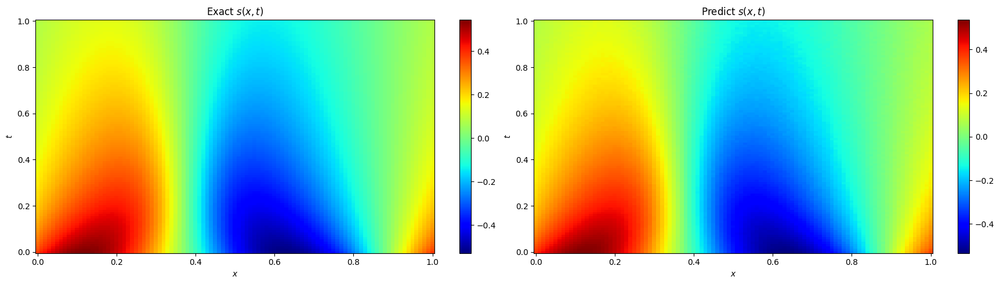

 45%|████▍     | 8995/20000 [06:33<03:28, 52.90it/s, Loss=0.0018903348, loss_ics=2.7974334e-05, loss_bcs=0.00012168447, loss_physics=0.0012091636]

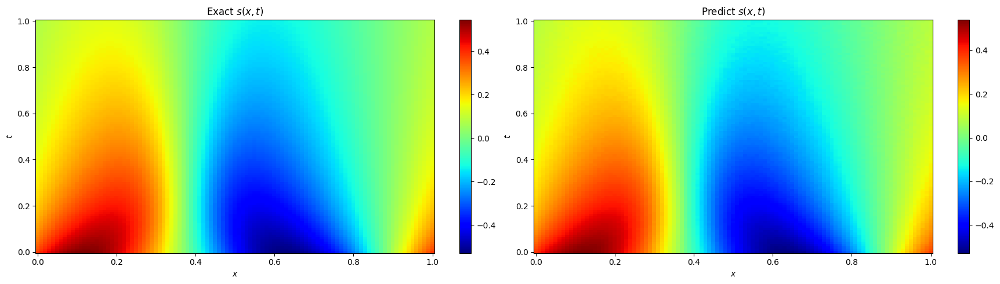

 45%|████▌     | 9095/20000 [06:37<03:25, 53.09it/s, Loss=0.0019743768, loss_ics=3.701466e-05, loss_bcs=0.00012078228, loss_physics=0.0011133013] 

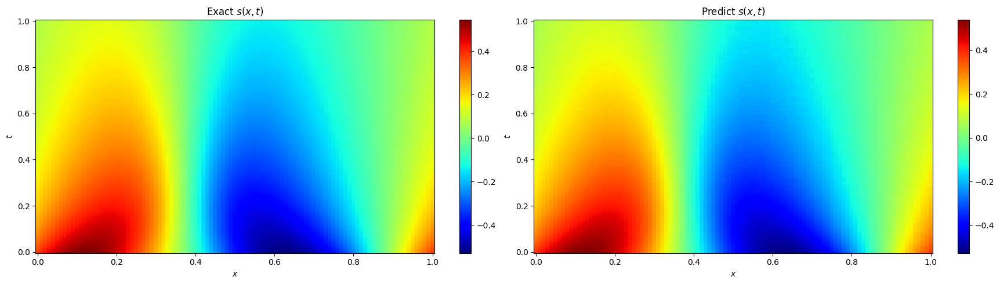

 46%|████▌     | 9195/20000 [06:40<03:23, 53.07it/s, Loss=0.0019477787, loss_ics=3.1173742e-05, loss_bcs=0.00025748363, loss_physics=0.0010668203]

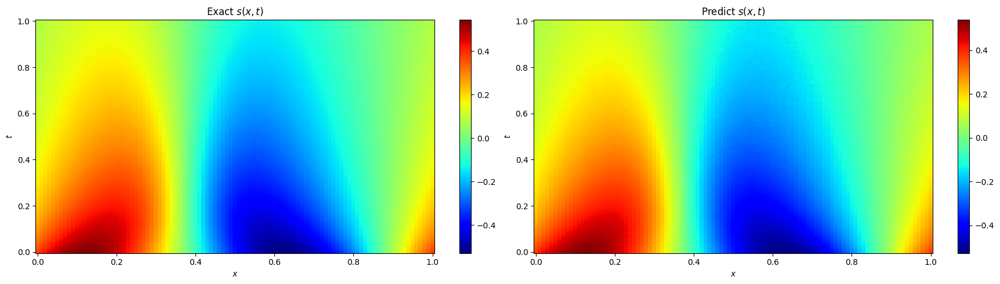

 46%|████▋     | 9296/20000 [06:45<03:21, 53.19it/s, Loss=0.0031803674, loss_ics=7.962697e-05, loss_bcs=0.00041855848, loss_physics=0.0011692694] 

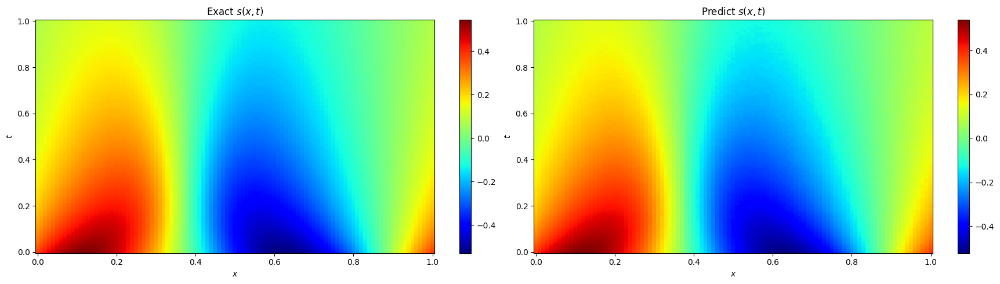

 47%|████▋     | 9395/20000 [06:49<03:19, 53.12it/s, Loss=0.0022633024, loss_ics=4.57686e-05, loss_bcs=0.00025642564, loss_physics=0.0010915049] 

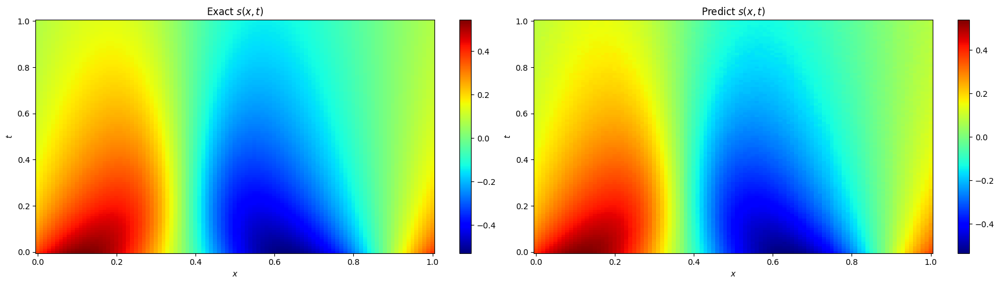

 47%|████▋     | 9495/20000 [06:53<03:18, 53.00it/s, Loss=0.002894708, loss_ics=7.212651e-05, loss_bcs=0.0003554568, loss_physics=0.0010967209] 

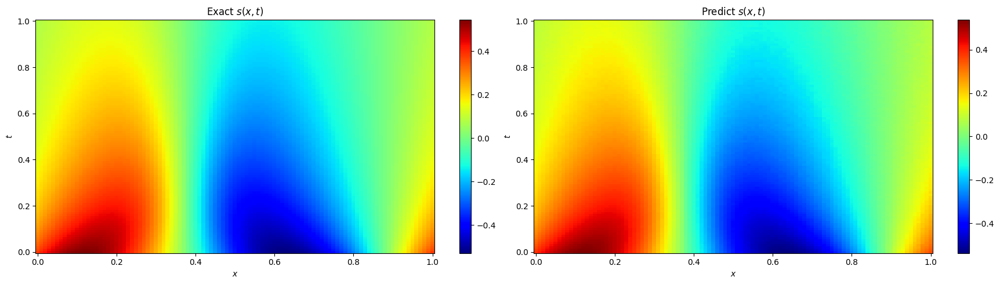

 48%|████▊     | 9595/20000 [06:57<03:16, 52.91it/s, Loss=0.0118546095, loss_ics=0.00039202478, loss_bcs=0.0011309015, loss_physics=0.0028832124]

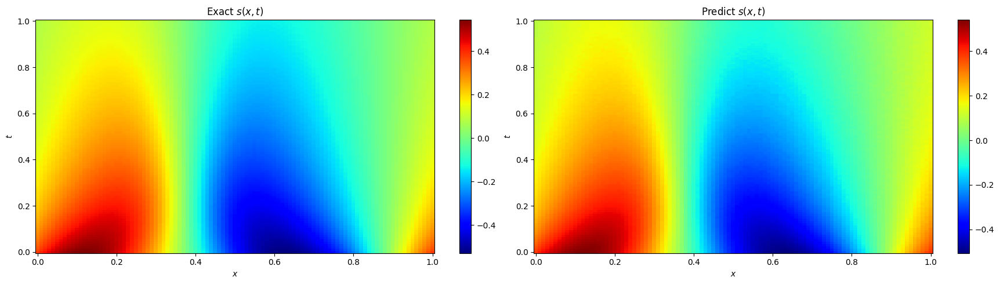

 48%|████▊     | 9696/20000 [07:01<03:14, 53.11it/s, Loss=0.0025908235, loss_ics=2.5059959e-05, loss_bcs=0.0011186356, loss_physics=0.0009709886]

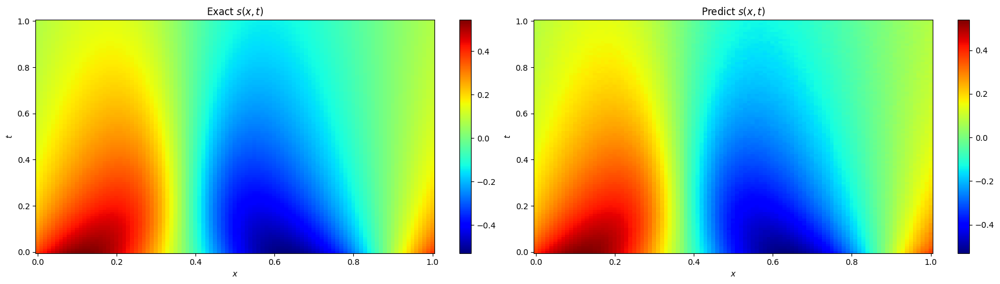

 49%|████▉     | 9795/20000 [07:05<03:12, 53.04it/s, Loss=0.0014549417, loss_ics=2.4493089e-05, loss_bcs=0.00015409902, loss_physics=0.0008109809]

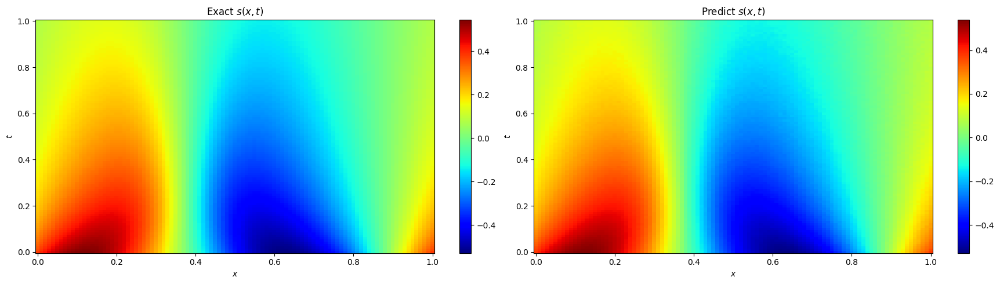

 49%|████▉     | 9895/20000 [07:09<03:10, 53.11it/s, Loss=0.0016478528, loss_ics=2.4633886e-05, loss_bcs=0.000121716745, loss_physics=0.0010334584]

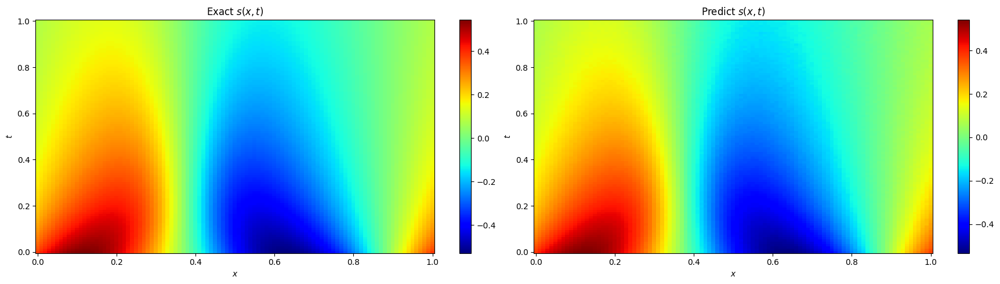

 50%|████▉     | 9995/20000 [07:13<03:09, 52.94it/s, Loss=0.0013963727, loss_ics=2.2208622e-05, loss_bcs=0.0001064236, loss_physics=0.0008457767]  

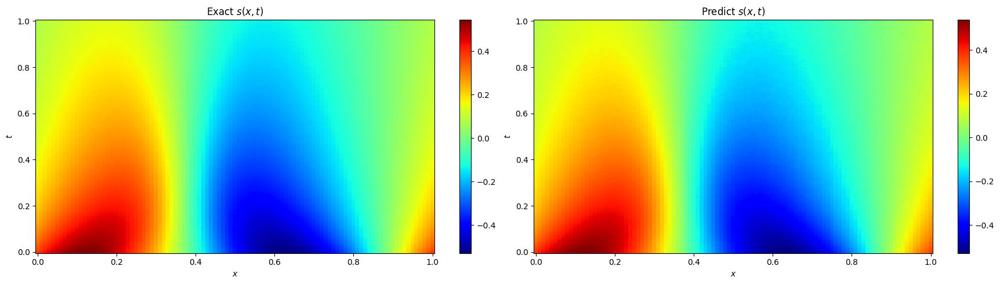

 50%|█████     | 10095/20000 [07:17<03:07, 52.90it/s, Loss=0.0032108743, loss_ics=5.6994442e-05, loss_bcs=0.0009799548, loss_physics=0.0010910305]

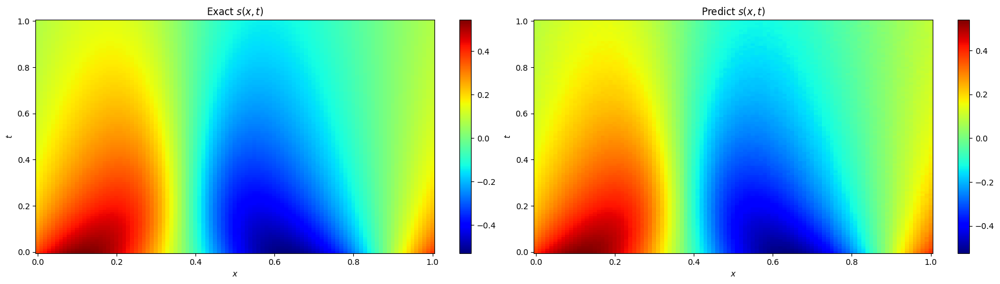

 51%|█████     | 10200/20000 [07:22<03:03, 53.46it/s, Loss=0.0014925587, loss_ics=2.792825e-05, loss_bcs=0.0001281876, loss_physics=0.0008058062] 

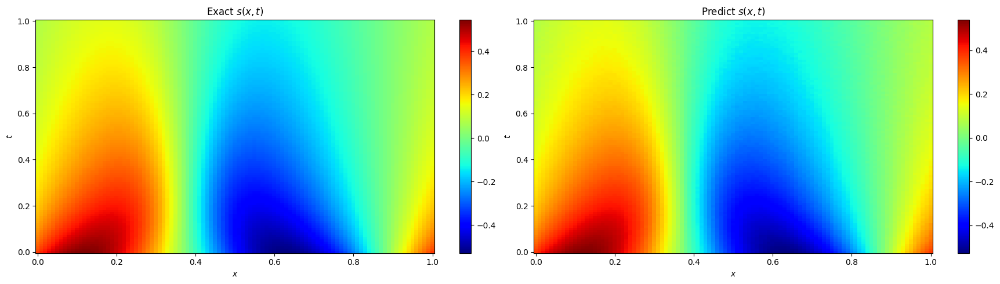

 51%|█████▏    | 10296/20000 [07:26<03:03, 52.79it/s, Loss=0.0030688115, loss_ics=2.66232e-05, loss_bcs=0.0014712219, loss_physics=0.0010651255] 

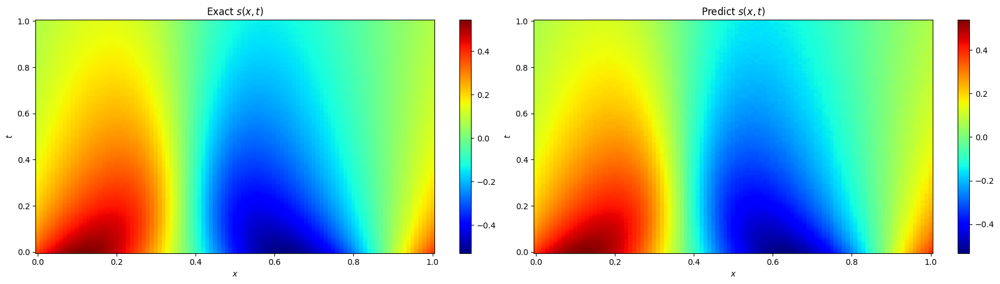

 52%|█████▏    | 10395/20000 [07:30<03:01, 53.01it/s, Loss=0.0016373508, loss_ics=3.4998026e-05, loss_bcs=0.00018332375, loss_physics=0.00075406645]

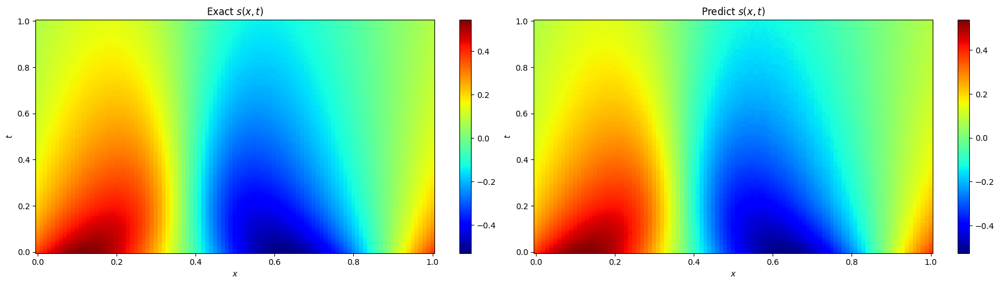

 52%|█████▏    | 10495/20000 [07:34<02:58, 53.12it/s, Loss=0.0016301146, loss_ics=2.1937194e-05, loss_bcs=0.00038718912, loss_physics=0.00080418156]

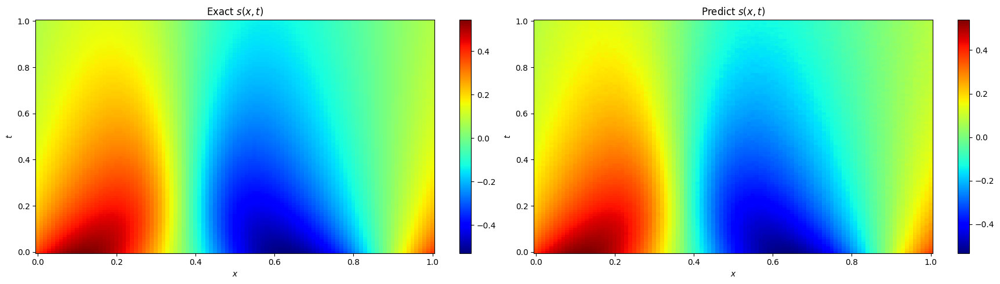

 53%|█████▎    | 10595/20000 [07:38<02:57, 52.91it/s, Loss=0.0011955404, loss_ics=1.8551573e-05, loss_bcs=7.742073e-05, loss_physics=0.0007470883]  

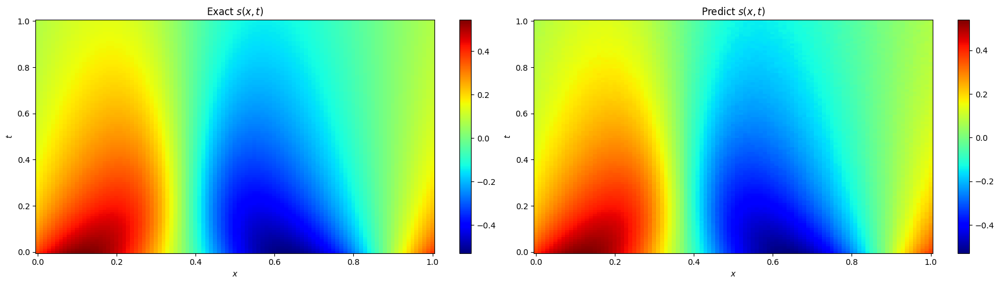

 53%|█████▎    | 10695/20000 [07:42<02:55, 53.00it/s, Loss=0.0013472637, loss_ics=1.8235738e-05, loss_bcs=0.0002598755, loss_physics=0.00072267343]

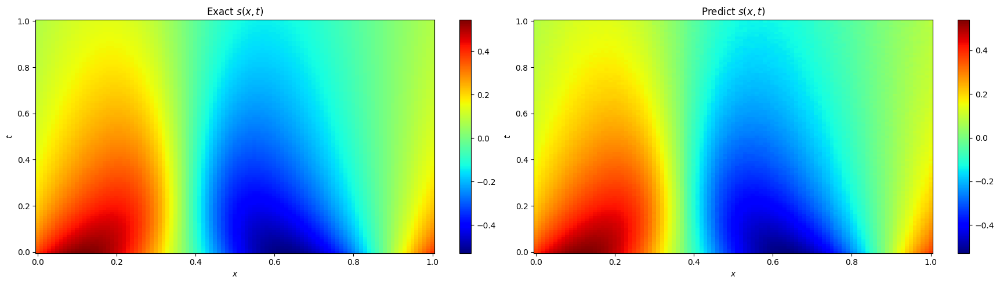

 54%|█████▍    | 10795/20000 [07:46<02:53, 53.10it/s, Loss=0.002323223, loss_ics=5.9915772e-05, loss_bcs=0.00039336935, loss_physics=0.0007315383] 

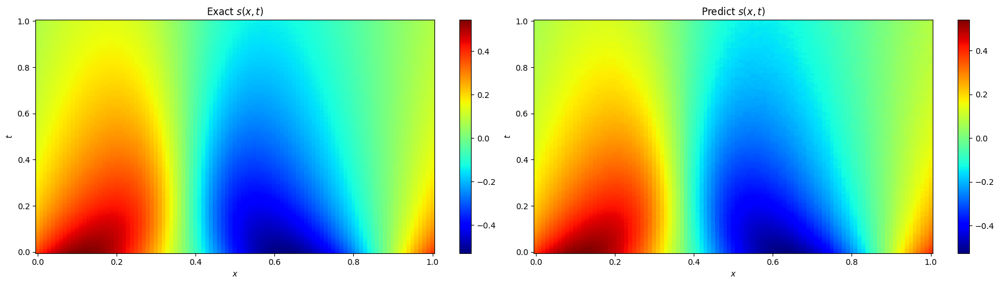

 54%|█████▍    | 10895/20000 [07:50<02:51, 53.11it/s, Loss=0.0012655484, loss_ics=2.095748e-05, loss_bcs=0.0001352442, loss_physics=0.0007111546] 

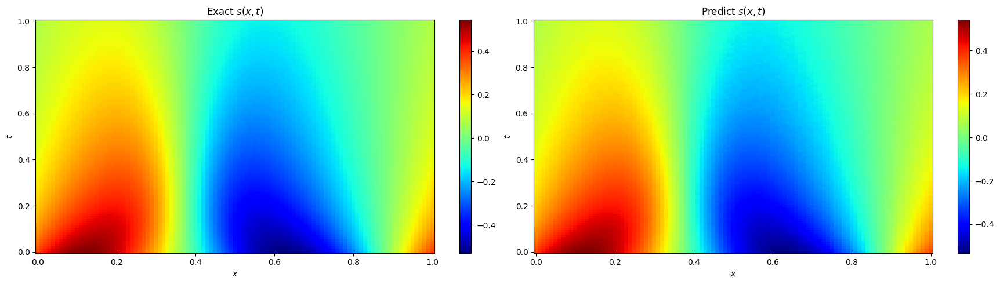

 55%|█████▍    | 10995/20000 [07:54<02:50, 52.79it/s, Loss=0.0011866561, loss_ics=1.7125787e-05, loss_bcs=0.00014884479, loss_physics=0.0006952955]

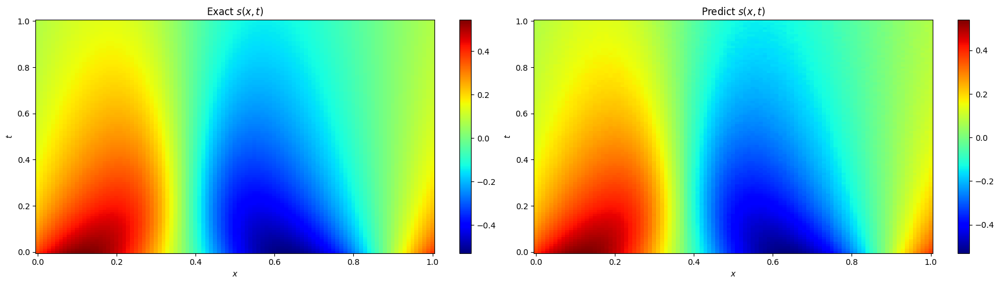

 55%|█████▌    | 11095/20000 [07:58<02:47, 53.05it/s, Loss=0.00218925, loss_ics=6.788904e-05, loss_bcs=0.00016898432, loss_physics=0.0006624848]   

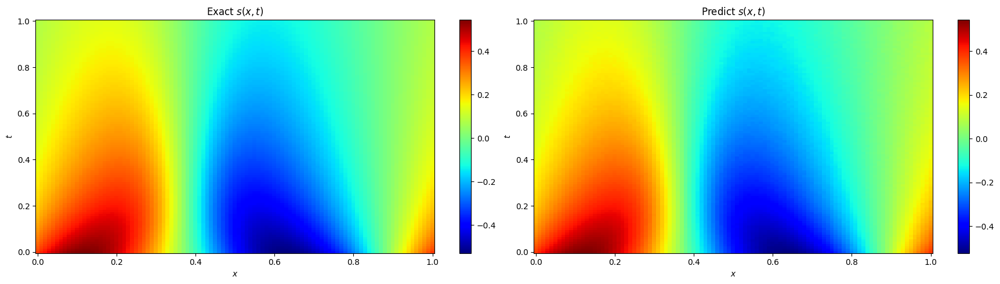

 56%|█████▌    | 11195/20000 [08:02<02:45, 53.06it/s, Loss=0.0011682091, loss_ics=2.0725945e-05, loss_bcs=0.000117188814, loss_physics=0.0006365014]

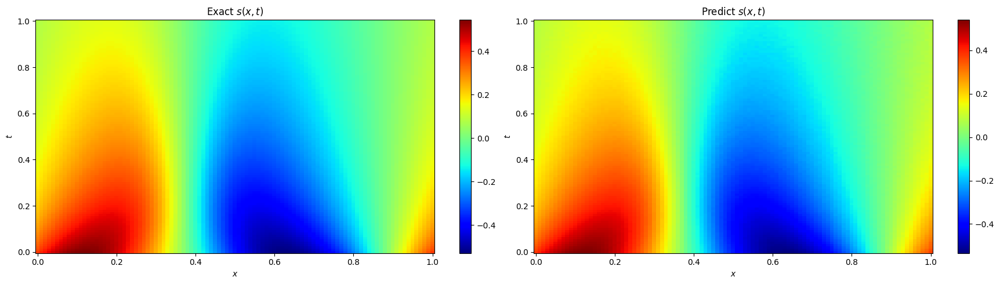

 56%|█████▋    | 11300/20000 [08:07<02:43, 53.32it/s, Loss=0.0010599953, loss_ics=1.5103856e-05, loss_bcs=0.00012060351, loss_physics=0.0006373147] 

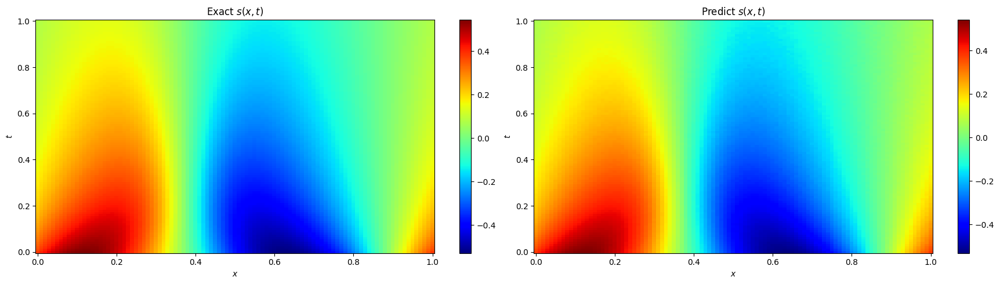

 57%|█████▋    | 11396/20000 [08:11<02:42, 53.07it/s, Loss=0.0037719905, loss_ics=6.109065e-05, loss_bcs=0.0018326513, loss_physics=0.0007175262]  

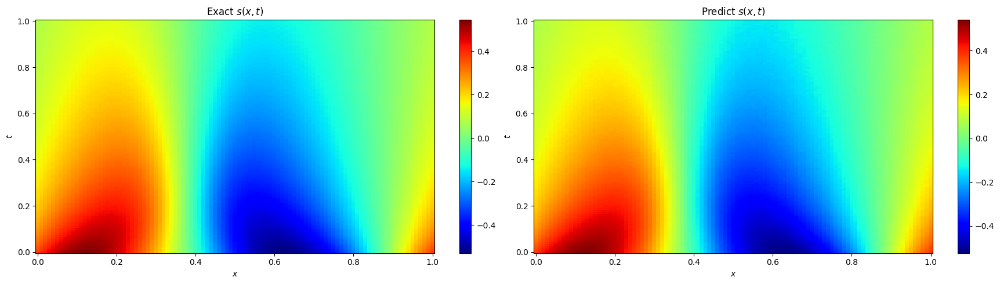

 57%|█████▋    | 11495/20000 [08:15<02:40, 52.99it/s, Loss=0.000991668, loss_ics=1.545025e-05, loss_bcs=8.414482e-05, loss_physics=0.0005985182] 

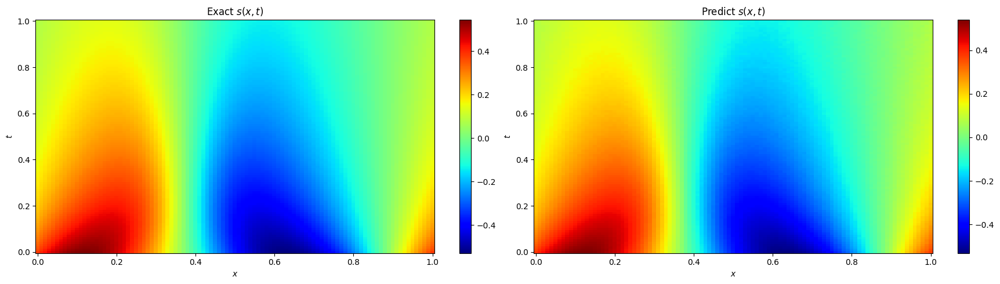

 58%|█████▊    | 11595/20000 [08:19<02:39, 52.78it/s, Loss=0.001188867, loss_ics=1.9068268e-05, loss_bcs=0.00021541856, loss_physics=0.00059208303]

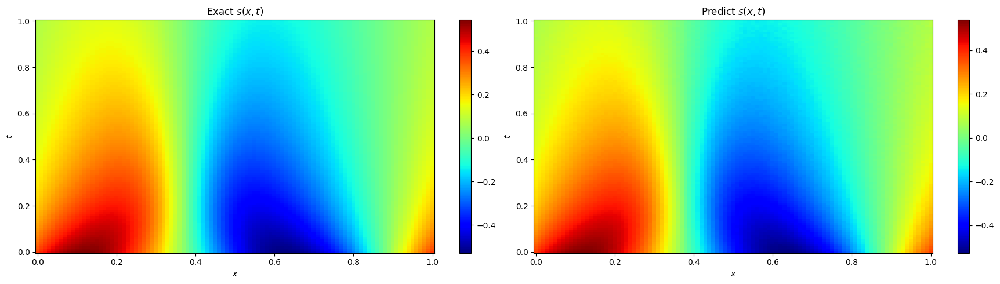

 58%|█████▊    | 11695/20000 [08:24<02:36, 53.05it/s, Loss=0.0009851925, loss_ics=1.5739197e-05, loss_bcs=0.00012642794, loss_physics=0.00054398057]

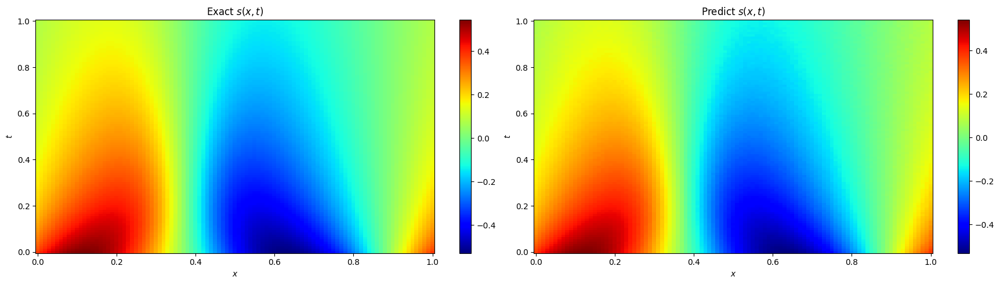

 59%|█████▉    | 11795/20000 [08:28<02:34, 52.98it/s, Loss=0.00094583776, loss_ics=1.4625765e-05, loss_bcs=5.7381665e-05, loss_physics=0.0005959408]

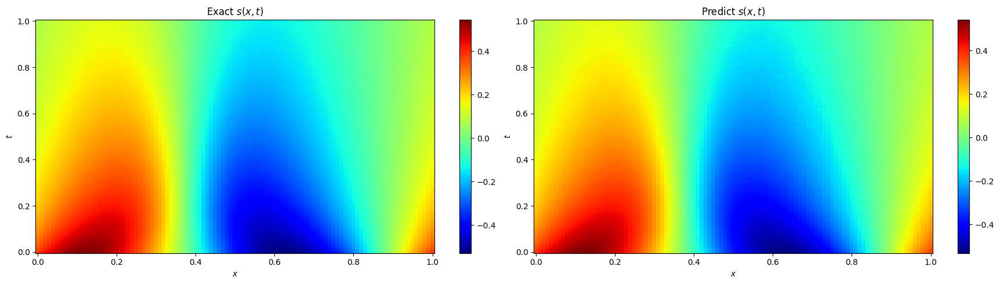

 60%|█████▉    | 11900/20000 [08:32<02:32, 53.29it/s, Loss=0.0013111429, loss_ics=1.584328e-05, loss_bcs=0.00042321347, loss_physics=0.00057106384] 

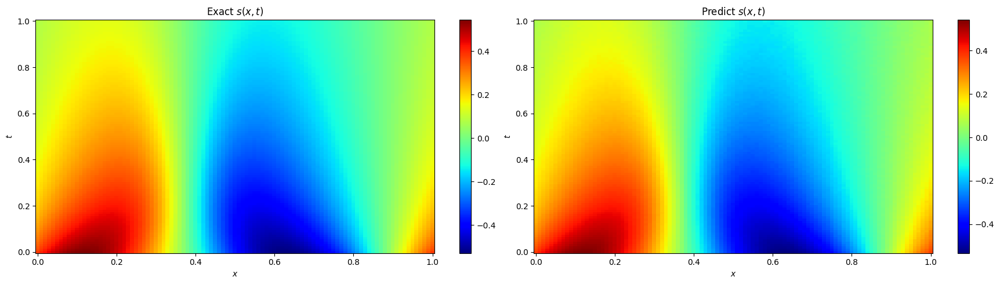

 60%|█████▉    | 11996/20000 [08:36<02:30, 53.08it/s, Loss=0.0013725228, loss_ics=1.27504045e-05, loss_bcs=0.0001640958, loss_physics=0.0009534189]

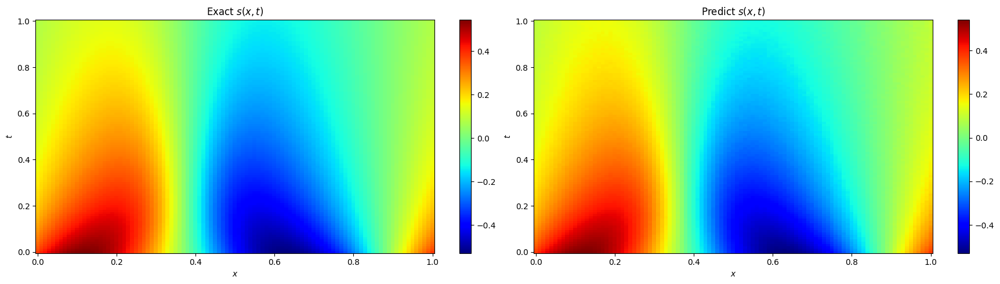

 60%|██████    | 12095/20000 [08:40<02:28, 53.07it/s, Loss=0.0008901715, loss_ics=1.3658642e-05, loss_bcs=7.4300355e-05, loss_physics=0.00054269825]

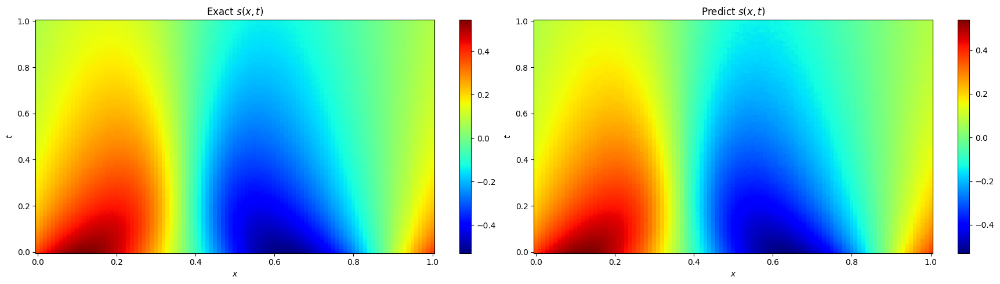

 61%|██████    | 12195/20000 [08:45<02:28, 52.73it/s, Loss=0.00082365476, loss_ics=1.2426844e-05, loss_bcs=6.1634564e-05, loss_physics=0.0005134833]

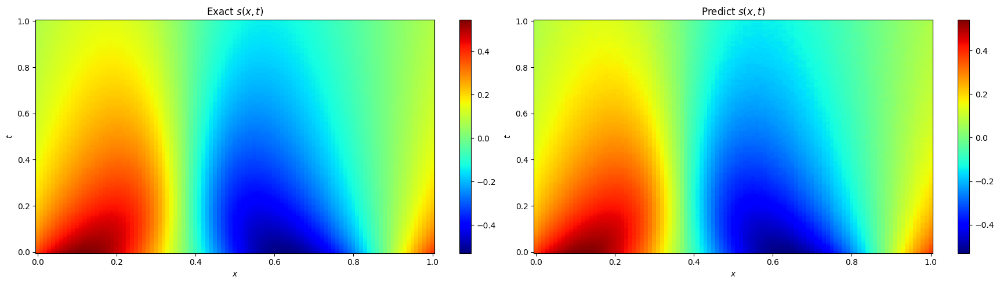

 61%|██████▏   | 12295/20000 [08:49<02:25, 52.96it/s, Loss=0.0011638526, loss_ics=1.3234856e-05, loss_bcs=0.000103928396, loss_physics=0.0007952272]

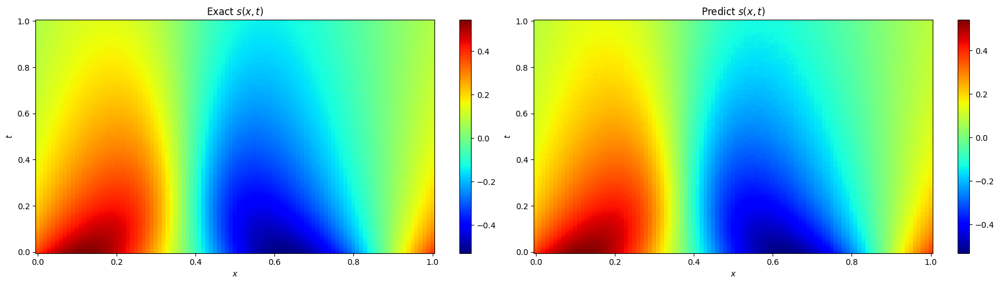

 62%|██████▏   | 12395/20000 [08:53<02:23, 53.06it/s, Loss=0.00091880944, loss_ics=1.2991047e-05, loss_bcs=9.3065544e-05, loss_physics=0.00056592294]

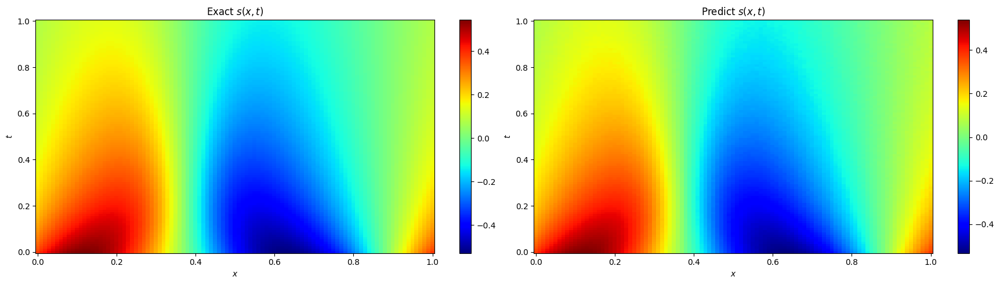

 62%|██████▏   | 12495/20000 [08:57<02:21, 52.95it/s, Loss=0.0008942262, loss_ics=1.4100316e-05, loss_bcs=9.0530935e-05, loss_physics=0.00052168895] 

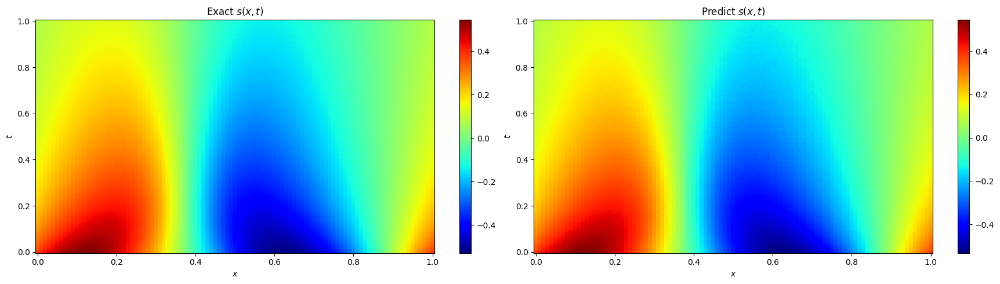

 63%|██████▎   | 12595/20000 [09:01<02:19, 52.95it/s, Loss=0.00080498186, loss_ics=1.0404906e-05, loss_bcs=0.000111562236, loss_physics=0.0004853215]

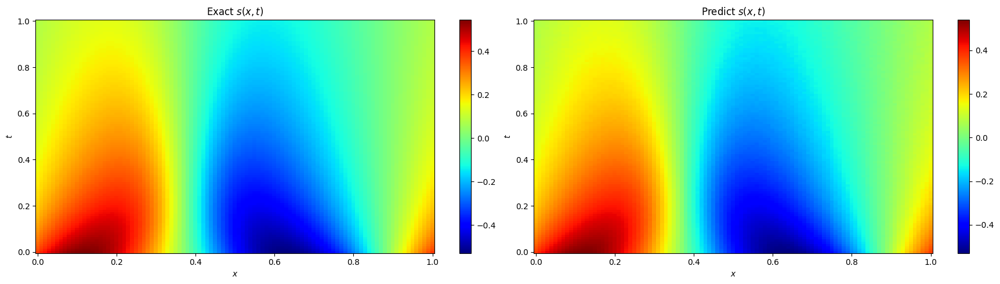

 63%|██████▎   | 12695/20000 [09:05<02:17, 53.07it/s, Loss=0.001421284, loss_ics=4.11719e-05, loss_bcs=9.2610135e-05, loss_physics=0.00050523586]    

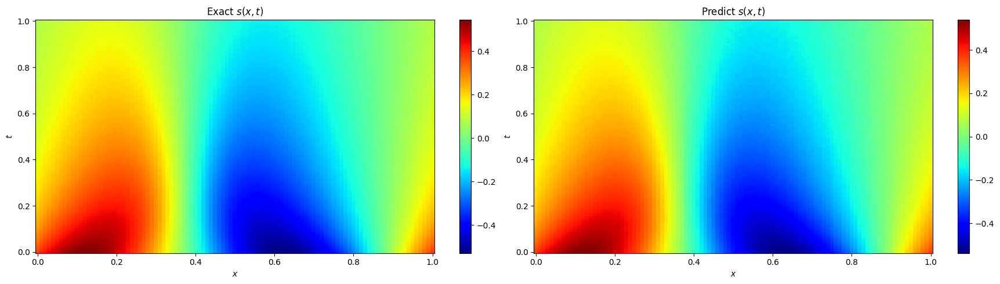

 64%|██████▍   | 12795/20000 [09:09<02:15, 53.02it/s, Loss=0.0012606676, loss_ics=2.6999602e-05, loss_bcs=0.00022164782, loss_physics=0.0004990278]

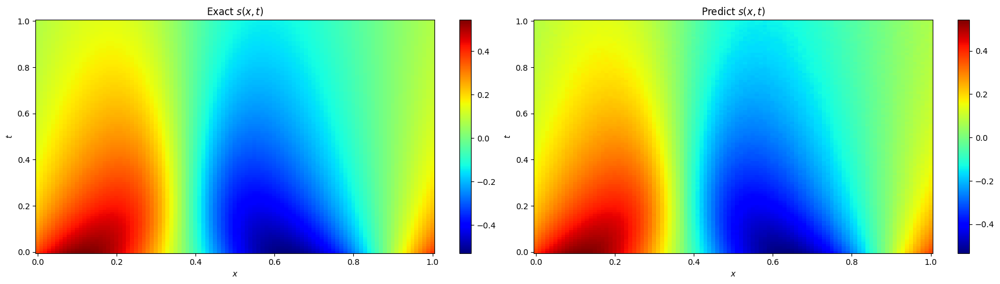

 64%|██████▍   | 12895/20000 [09:14<02:14, 52.89it/s, Loss=0.00083969324, loss_ics=1.1834176e-05, loss_bcs=0.00012896626, loss_physics=0.00047404348]

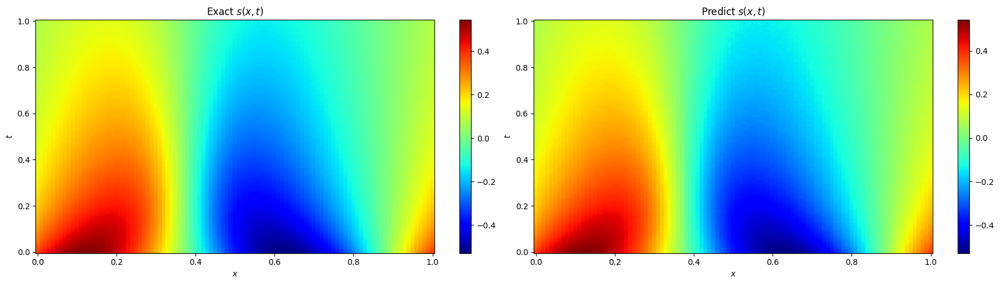

 65%|██████▍   | 12997/20000 [09:18<02:11, 53.06it/s, Loss=0.00083559036, loss_ics=1.1495418e-05, loss_bcs=0.00012903912, loss_physics=0.00047664286]

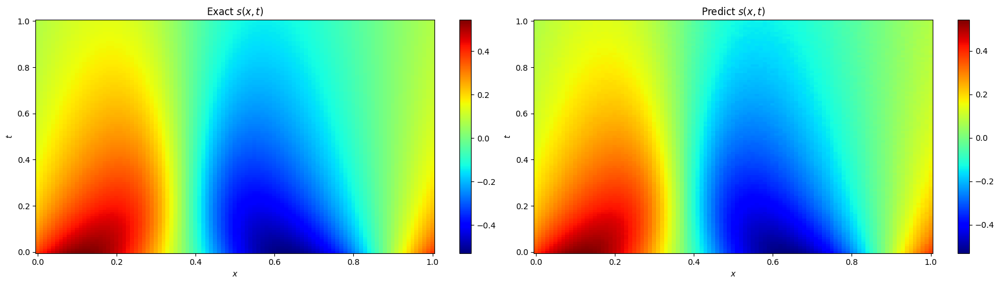

 65%|██████▌   | 13096/20000 [09:22<02:10, 53.03it/s, Loss=0.0009322269, loss_ics=1.0237553e-05, loss_bcs=9.703462e-05, loss_physics=0.0006304412]   

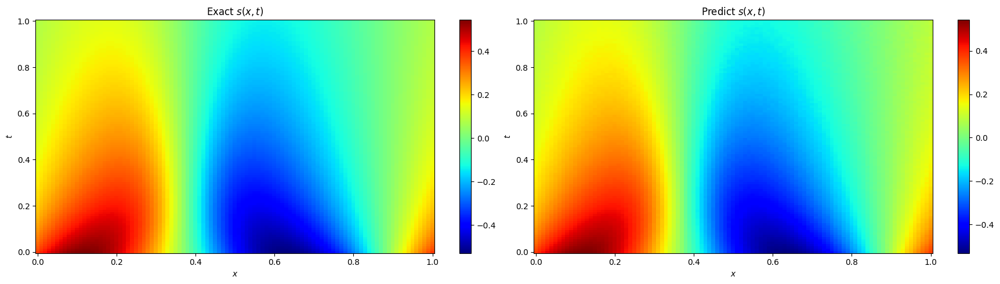

 66%|██████▌   | 13196/20000 [09:26<02:07, 53.20it/s, Loss=0.0007422348, loss_ics=1.1455062e-05, loss_bcs=6.166105e-05, loss_physics=0.00045147253]

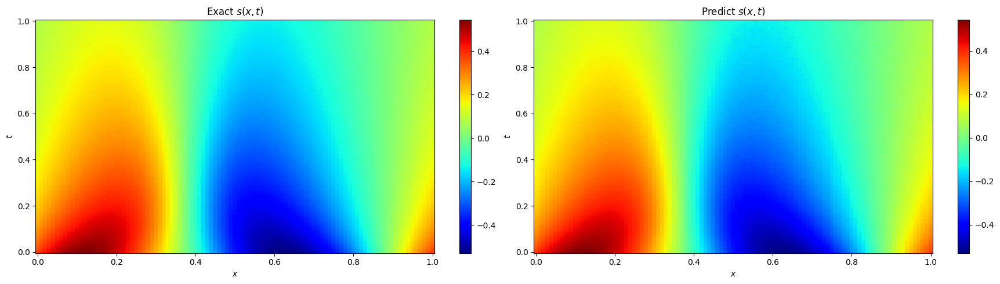

 66%|██████▋   | 13295/20000 [09:30<02:06, 53.00it/s, Loss=0.000725952, loss_ics=9.940045e-06, loss_bcs=8.1030674e-05, loss_physics=0.0004461204]  

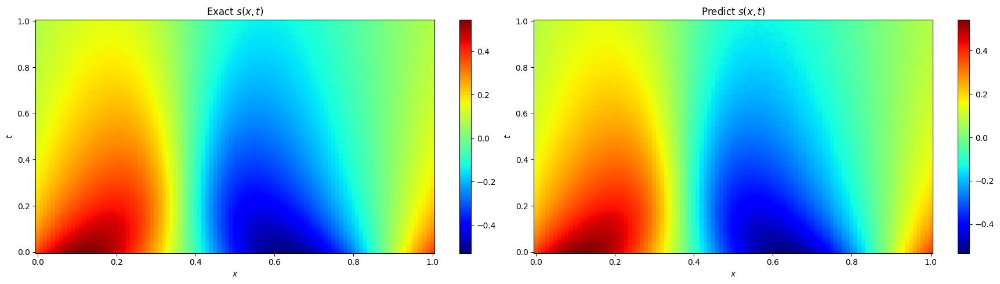

 67%|██████▋   | 13395/20000 [09:34<02:04, 52.97it/s, Loss=0.0014489013, loss_ics=1.6134802e-05, loss_bcs=0.00057078595, loss_physics=0.00055541925]

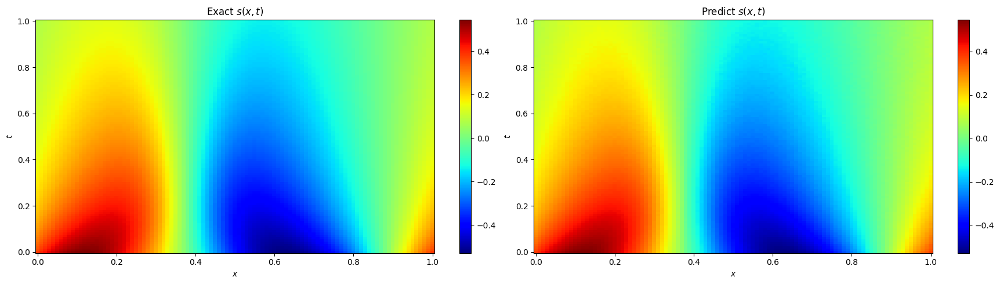

 67%|██████▋   | 13495/20000 [09:38<02:02, 53.07it/s, Loss=0.00088492443, loss_ics=1.5409905e-05, loss_bcs=0.00011866835, loss_physics=0.00045805794]

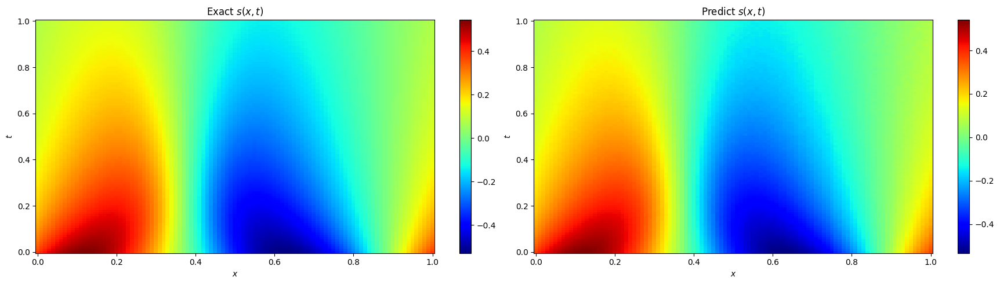

 68%|██████▊   | 13600/20000 [09:43<02:00, 53.31it/s, Loss=0.0007142114, loss_ics=1.1025281e-05, loss_bcs=5.8467638e-05, loss_physics=0.00043523812] 

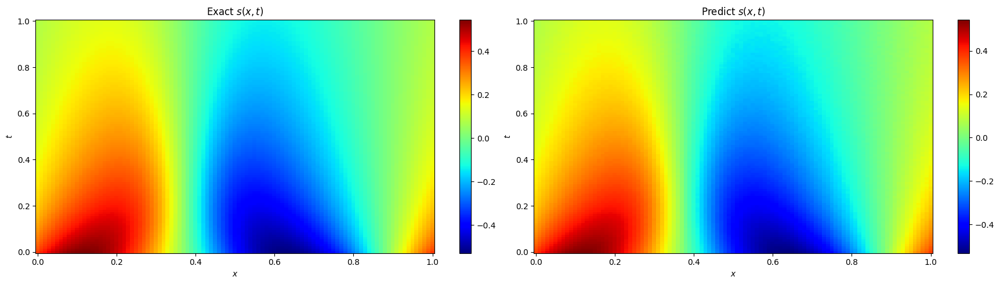

 68%|██████▊   | 13696/20000 [09:47<01:59, 52.94it/s, Loss=0.0013755598, loss_ics=3.0959683e-05, loss_bcs=0.00012563265, loss_physics=0.00063073356]

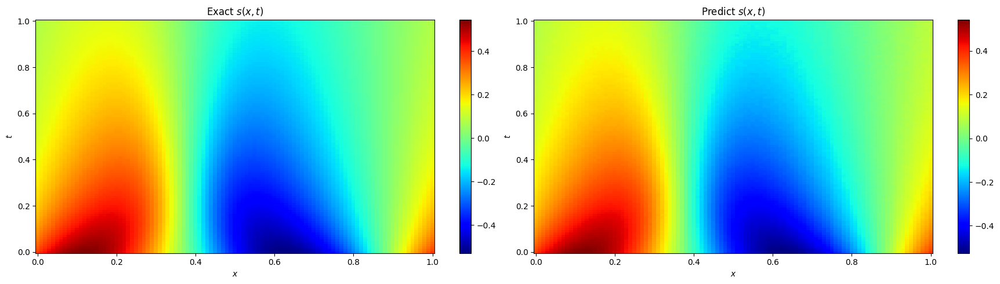

 69%|██████▉   | 13795/20000 [09:51<01:57, 53.03it/s, Loss=0.00072952703, loss_ics=8.789407e-06, loss_bcs=0.00010655111, loss_physics=0.00044718778]

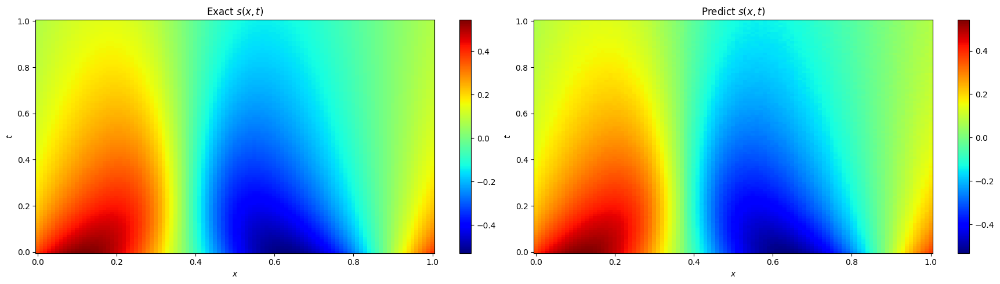

 69%|██████▉   | 13895/20000 [09:55<01:55, 52.80it/s, Loss=0.0007548643, loss_ics=8.876964e-06, loss_bcs=0.00015728969, loss_physics=0.0004200353]  

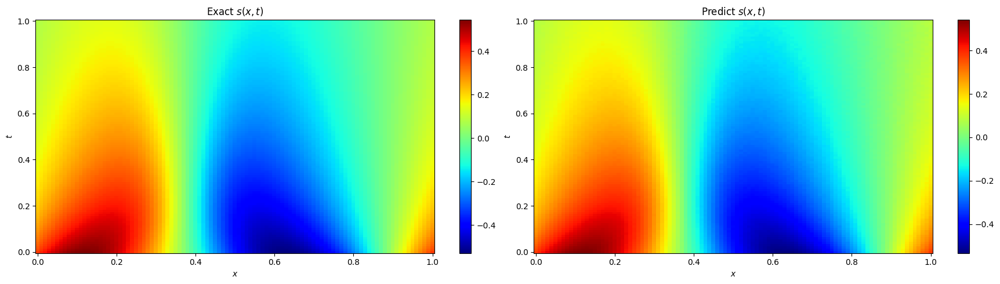

 70%|██████▉   | 13995/20000 [09:59<01:53, 52.91it/s, Loss=0.0008132241, loss_ics=9.452496e-06, loss_bcs=5.7659578e-05, loss_physics=0.0005665146]

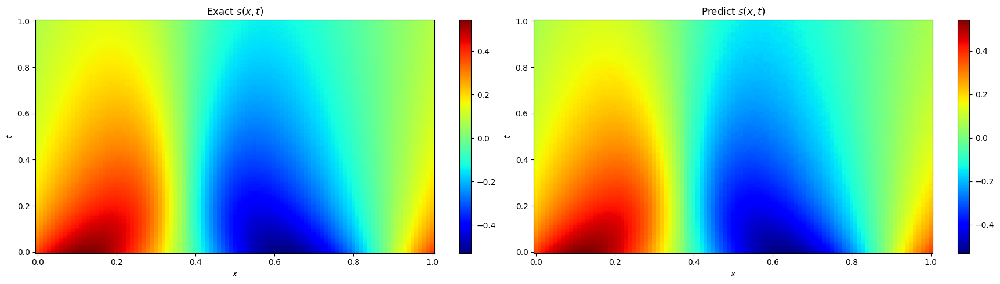

 70%|███████   | 14095/20000 [10:03<01:51, 53.02it/s, Loss=0.0006320651, loss_ics=8.88474e-06, loss_bcs=6.1294915e-05, loss_physics=0.00039307543]

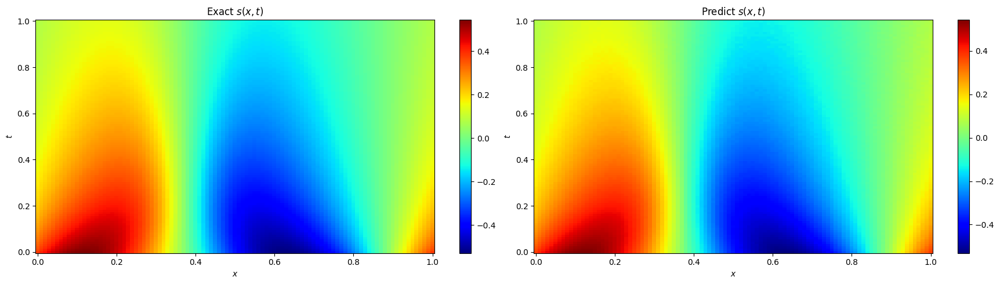

 71%|███████   | 14200/20000 [10:08<01:48, 53.33it/s, Loss=0.0011116398, loss_ics=2.8563903e-05, loss_bcs=9.912484e-05, loss_physics=0.00044123692]

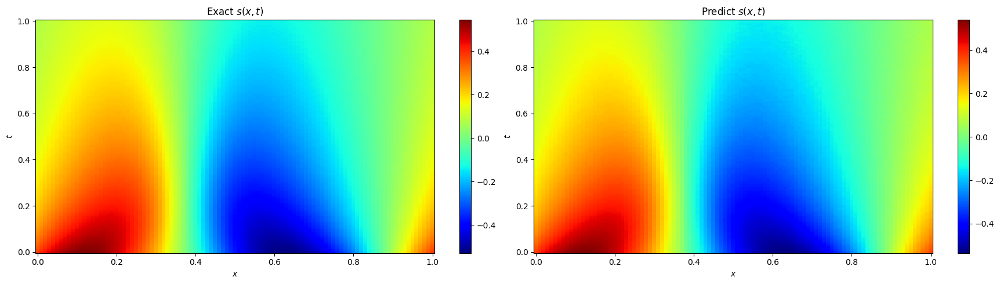

 71%|███████▏  | 14296/20000 [10:12<01:47, 52.96it/s, Loss=0.0011715502, loss_ics=1.1112235e-05, loss_bcs=6.841929e-05, loss_physics=0.0008808862] 

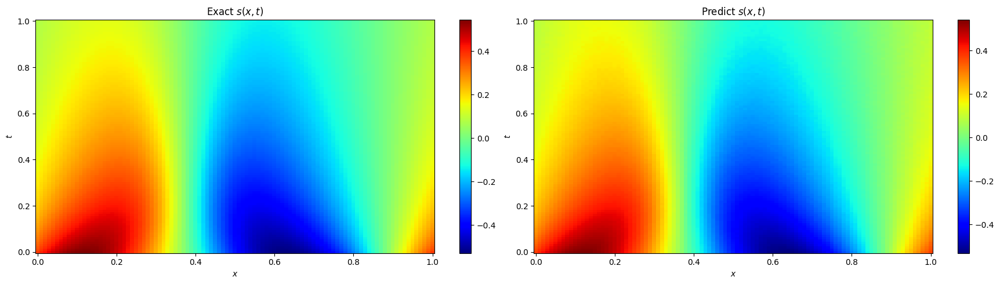

 72%|███████▏  | 14395/20000 [10:16<01:45, 53.07it/s, Loss=0.0008134572, loss_ics=8.972525e-06, loss_bcs=0.00024480888, loss_physics=0.0003891978]

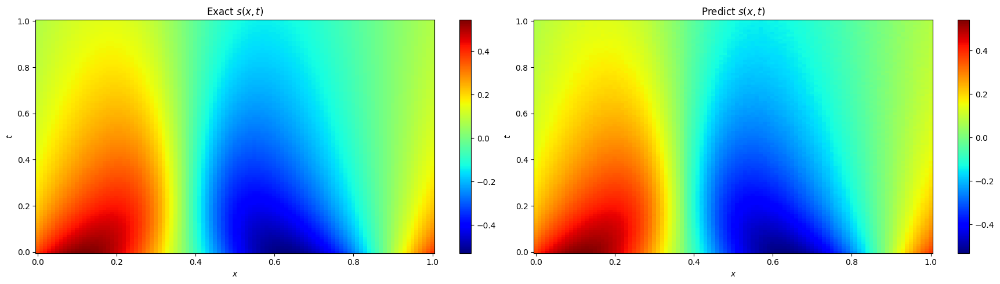

 72%|███████▏  | 14495/20000 [10:20<01:44, 52.84it/s, Loss=0.0007593866, loss_ics=1.2006612e-05, loss_bcs=0.00012483826, loss_physics=0.00039441604]

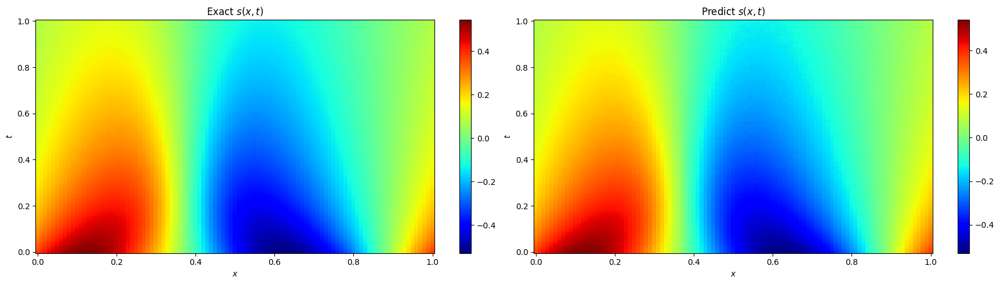

 73%|███████▎  | 14595/20000 [10:24<01:42, 52.98it/s, Loss=0.0008093159, loss_ics=1.5734287e-05, loss_bcs=0.00010165472, loss_physics=0.0003929754] 

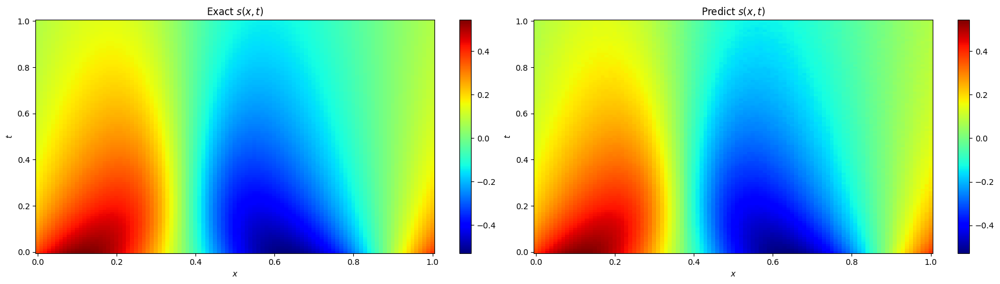

 73%|███████▎  | 14695/20000 [10:28<01:40, 53.03it/s, Loss=0.0019385, loss_ics=6.546312e-05, loss_bcs=0.00016971481, loss_physics=0.00045952268]   

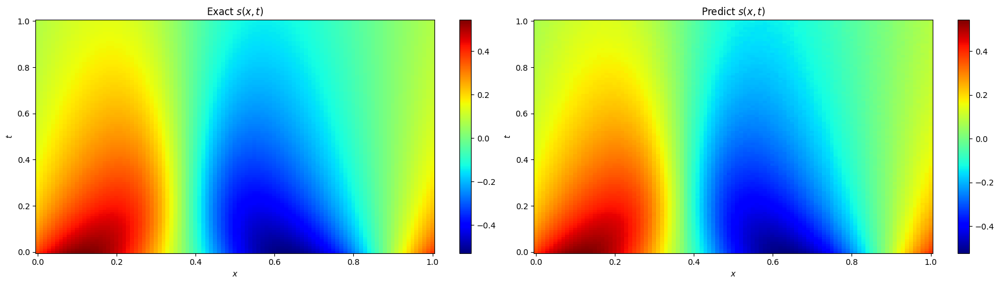

 74%|███████▍  | 14795/20000 [10:32<01:38, 53.07it/s, Loss=0.00076186506, loss_ics=1.10216815e-05, loss_bcs=9.869717e-05, loss_physics=0.00044273425]

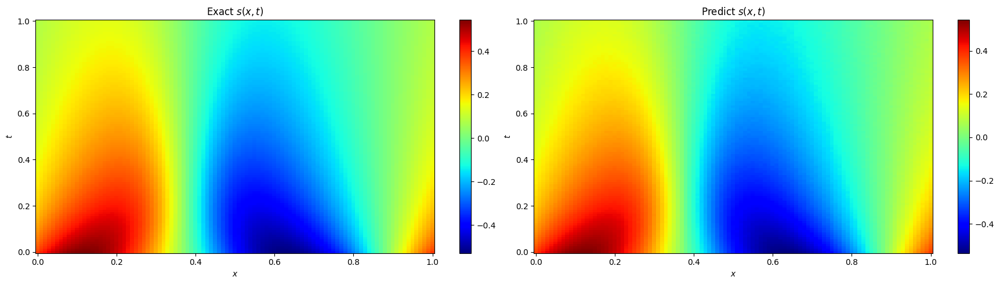

 74%|███████▍  | 14895/20000 [10:37<01:36, 52.77it/s, Loss=0.001376404, loss_ics=1.1969792e-05, loss_bcs=0.00049636804, loss_physics=0.0006406401]   

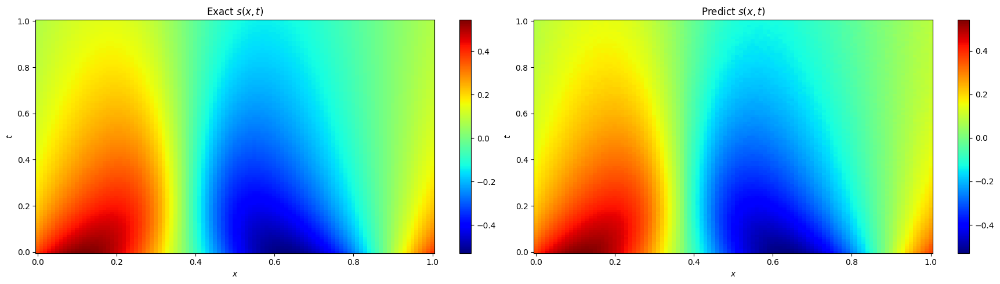

 75%|███████▍  | 14995/20000 [10:41<01:34, 53.00it/s, Loss=0.0006213071, loss_ics=9.165747e-06, loss_bcs=5.796084e-05, loss_physics=0.00038003136]

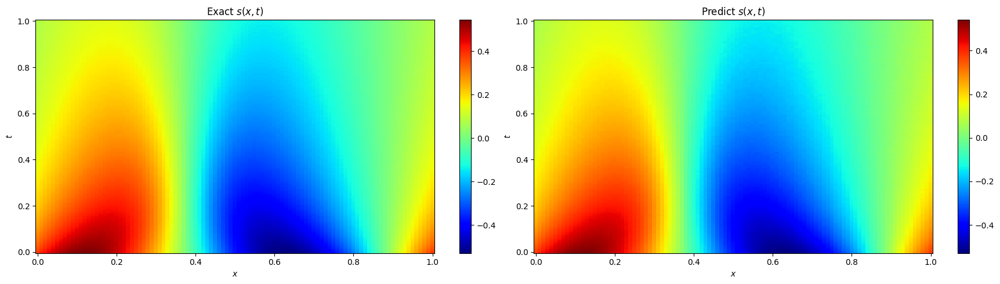

 75%|███████▌  | 15095/20000 [10:45<01:32, 53.09it/s, Loss=0.00078381074, loss_ics=1.1598757e-05, loss_bcs=5.4689976e-05, loss_physics=0.00049714564]

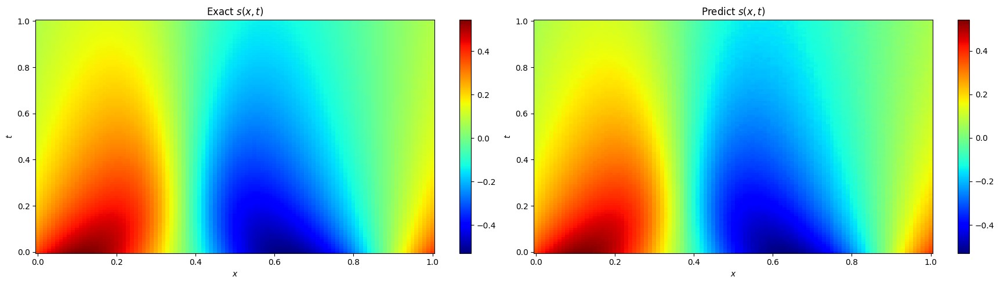

 76%|███████▌  | 15195/20000 [10:49<01:31, 52.71it/s, Loss=0.0009207161, loss_ics=7.903846e-06, loss_bcs=0.0003504039, loss_physics=0.0004122353]    

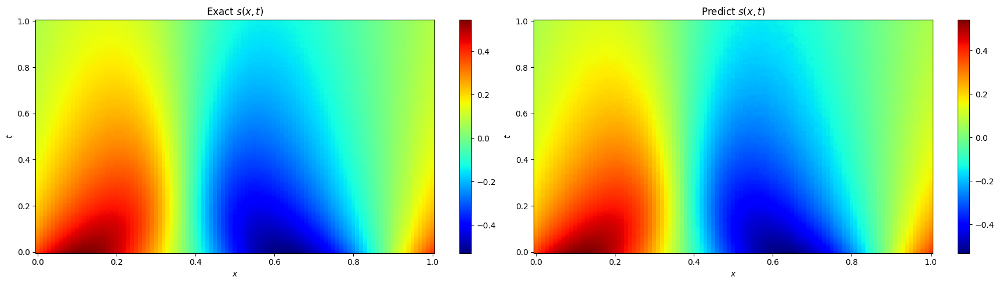

 76%|███████▋  | 15295/20000 [10:54<01:28, 53.09it/s, Loss=0.001430592, loss_ics=1.0737206e-05, loss_bcs=0.00016175628, loss_physics=0.0010540916]

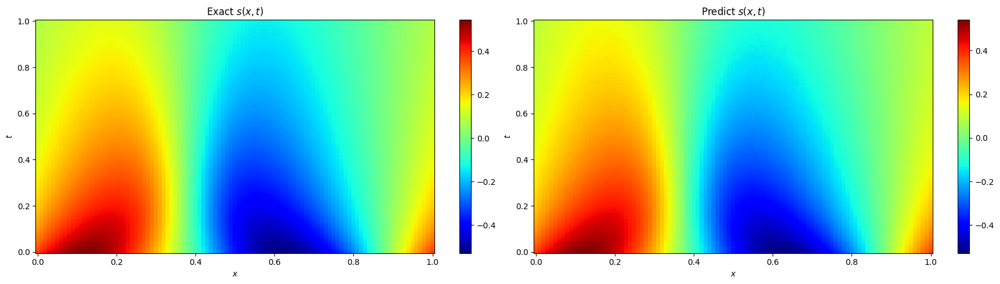

 77%|███████▋  | 15395/20000 [10:58<01:26, 53.07it/s, Loss=0.0019441132, loss_ics=5.841652e-05, loss_bcs=0.00023272881, loss_physics=0.00054305396]

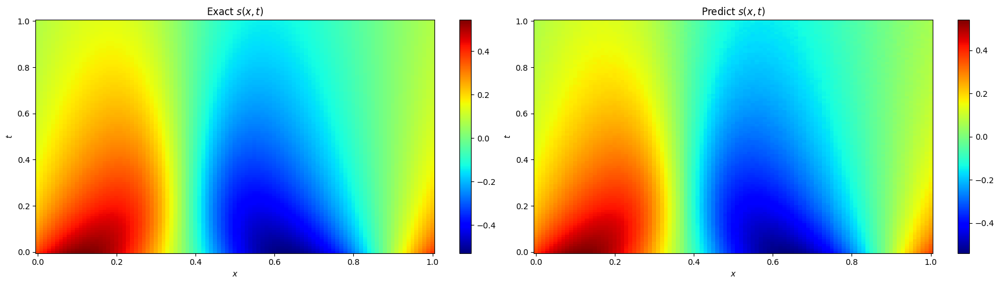

 77%|███████▋  | 15496/20000 [11:02<01:25, 52.81it/s, Loss=0.000805379, loss_ics=8.1636135e-06, loss_bcs=7.849999e-05, loss_physics=0.00056360674] 

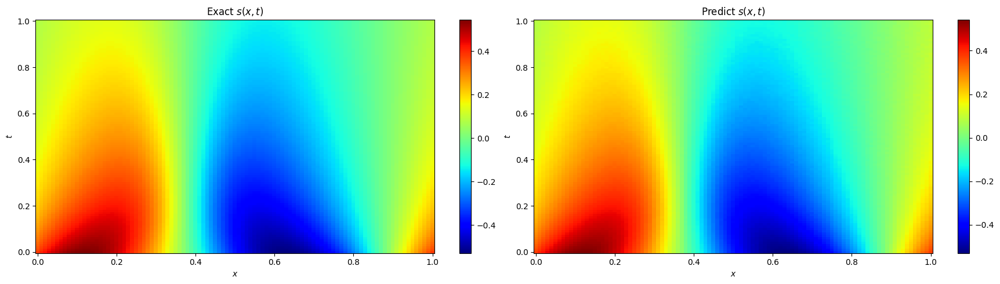

 78%|███████▊  | 15595/20000 [11:06<01:23, 53.05it/s, Loss=0.0006246562, loss_ics=8.967528e-06, loss_bcs=5.5854234e-05, loss_physics=0.00038945145]

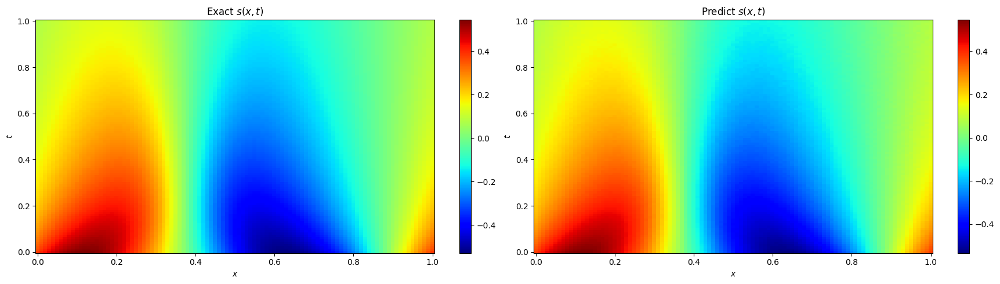

 78%|███████▊  | 15695/20000 [11:10<01:21, 53.02it/s, Loss=0.0010805794, loss_ics=1.4584951e-05, loss_bcs=0.00027109752, loss_physics=0.0005177828]

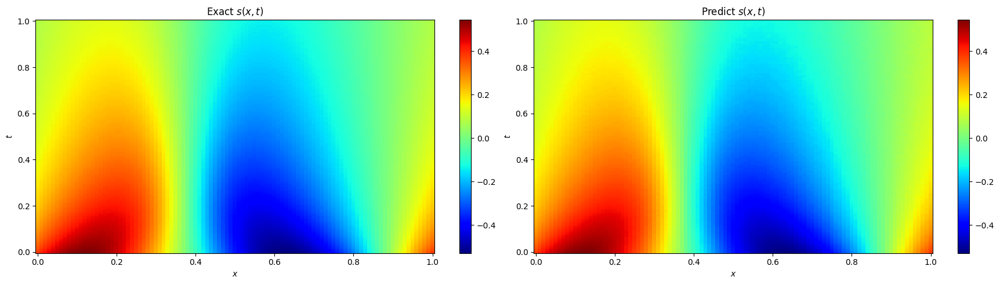

 79%|███████▉  | 15795/20000 [11:14<01:19, 52.98it/s, Loss=0.00070819154, loss_ics=9.0315e-06, loss_bcs=0.00017991527, loss_physics=0.00034764624] 

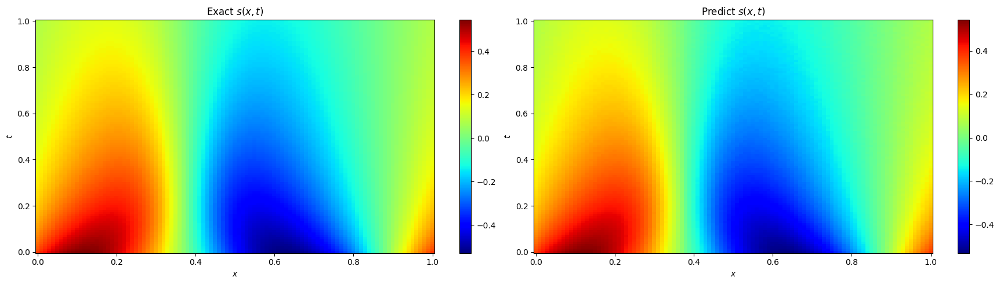

 79%|███████▉  | 15895/20000 [11:18<01:17, 52.84it/s, Loss=0.0007461898, loss_ics=1.2452418e-05, loss_bcs=6.1395105e-05, loss_physics=0.00043574633]

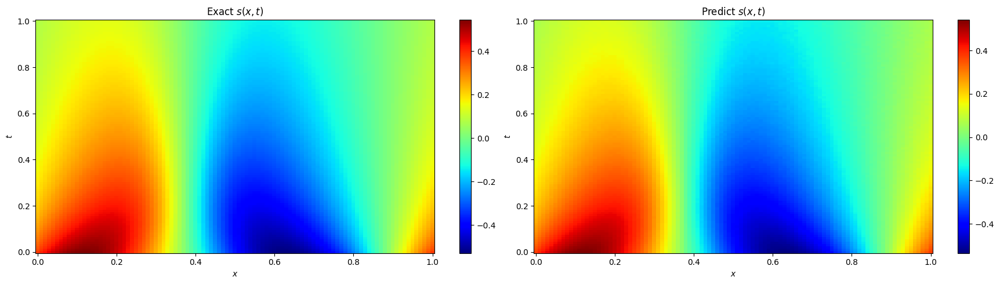

 80%|███████▉  | 15995/20000 [11:23<01:15, 53.08it/s, Loss=0.0006943181, loss_ics=7.4799395e-06, loss_bcs=0.00017734771, loss_physics=0.00036737163]

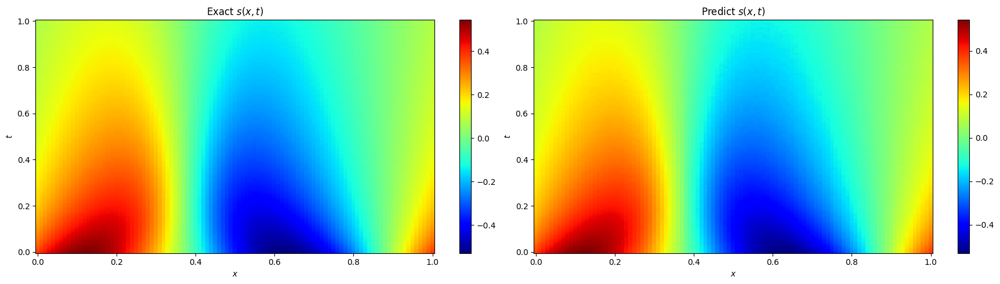

 80%|████████  | 16096/20000 [11:27<01:13, 53.41it/s, Loss=0.000620359, loss_ics=1.1671271e-05, loss_bcs=4.775595e-05, loss_physics=0.0003391776]   

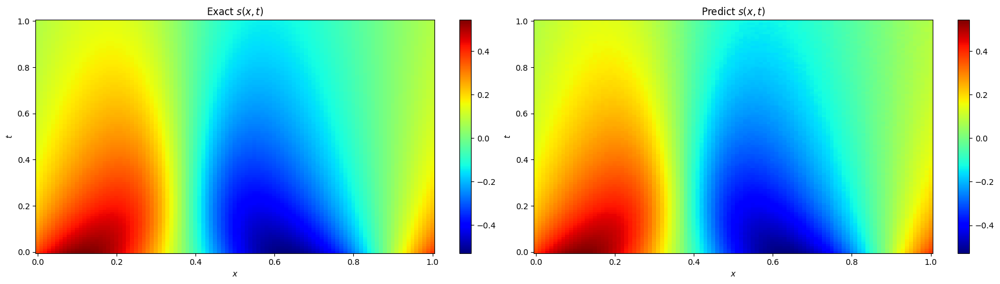

 81%|████████  | 16195/20000 [11:31<01:12, 52.85it/s, Loss=0.0024241656, loss_ics=7.824238e-05, loss_bcs=0.0003325227, loss_physics=0.0005267954]

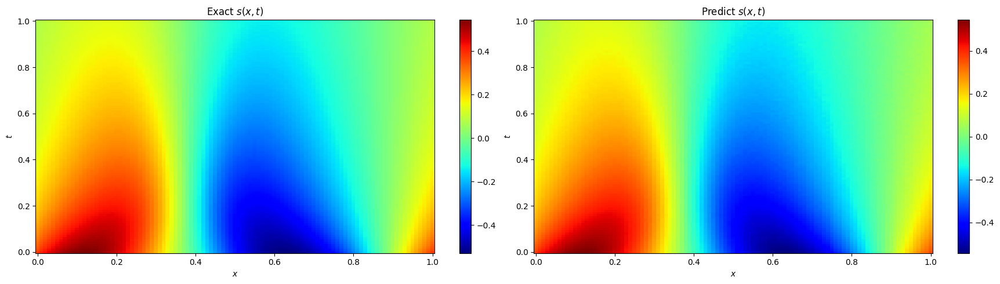

 81%|████████▏ | 16295/20000 [11:35<01:09, 53.07it/s, Loss=0.000527659, loss_ics=7.7961395e-06, loss_bcs=4.026243e-05, loss_physics=0.0003314738]

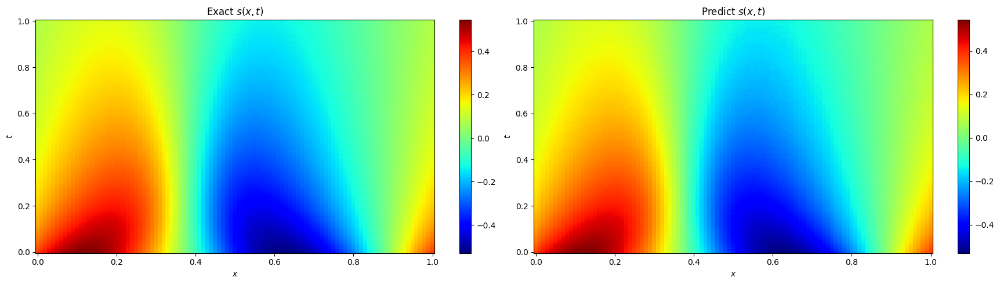

 82%|████████▏ | 16395/20000 [11:39<01:07, 53.02it/s, Loss=0.00081508665, loss_ics=1.2372041e-05, loss_bcs=0.00020391971, loss_physics=0.00036372608]

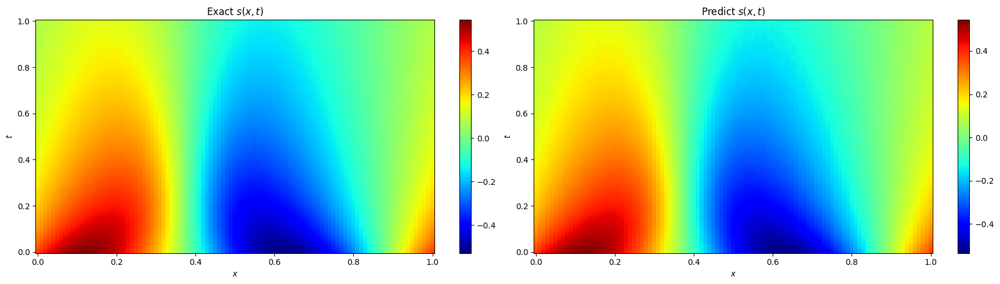

 82%|████████▎ | 16500/20000 [11:43<01:05, 53.34it/s, Loss=0.00077362766, loss_ics=9.951231e-06, loss_bcs=0.00018213427, loss_physics=0.00039246873] 

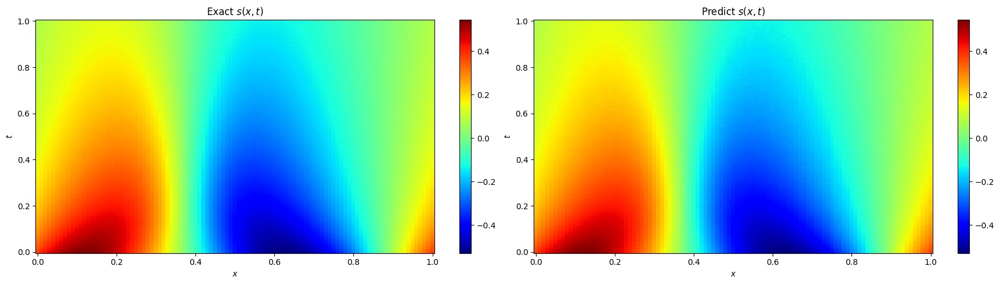

 83%|████████▎ | 16596/20000 [11:47<01:04, 53.02it/s, Loss=0.00059394154, loss_ics=7.864726e-06, loss_bcs=0.00010396003, loss_physics=0.00033268702]

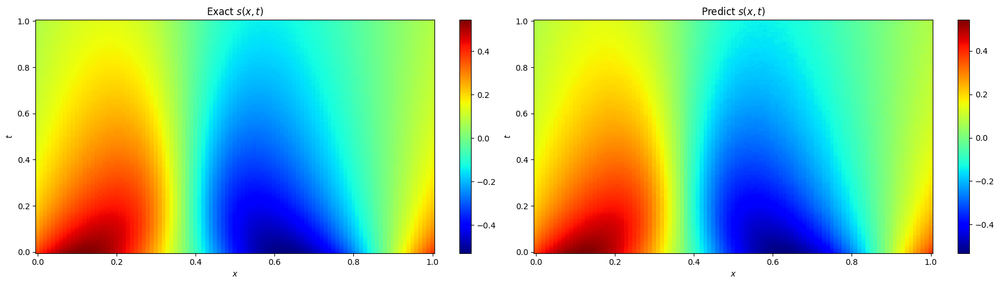

 83%|████████▎ | 16695/20000 [11:51<01:02, 53.04it/s, Loss=0.0005503167, loss_ics=7.083815e-06, loss_bcs=5.0617862e-05, loss_physics=0.00035802255] 

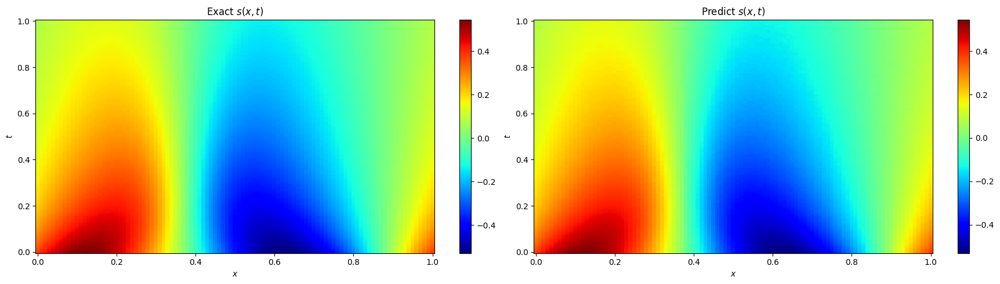

 84%|████████▍ | 16795/20000 [11:56<01:00, 52.84it/s, Loss=0.000474127, loss_ics=7.5921726e-06, loss_bcs=3.8290775e-05, loss_physics=0.0002839928] 

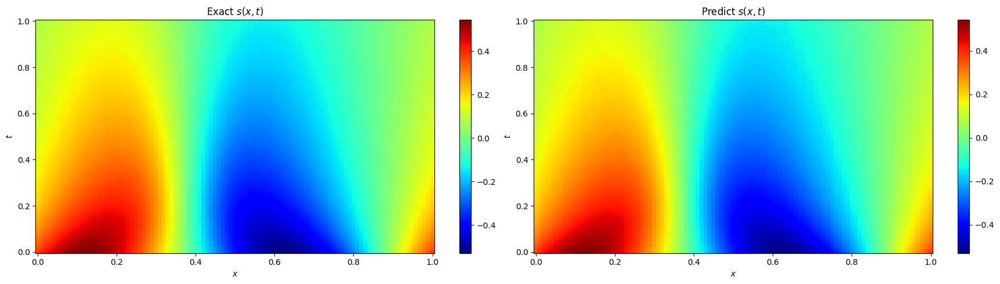

 84%|████████▍ | 16895/20000 [12:00<00:58, 53.05it/s, Loss=0.0006471086, loss_ics=1.2177555e-05, loss_bcs=8.002478e-05, loss_physics=0.00032353273]

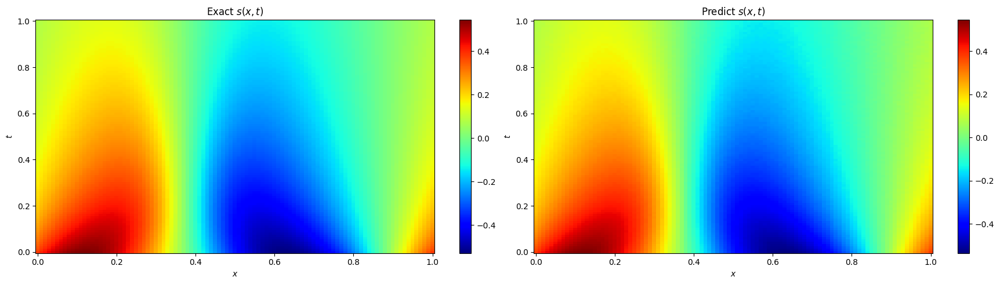

 85%|████████▍ | 16995/20000 [12:04<00:56, 52.93it/s, Loss=0.0005559892, loss_ics=8.7813105e-06, loss_bcs=0.00010242552, loss_physics=0.0002779375]

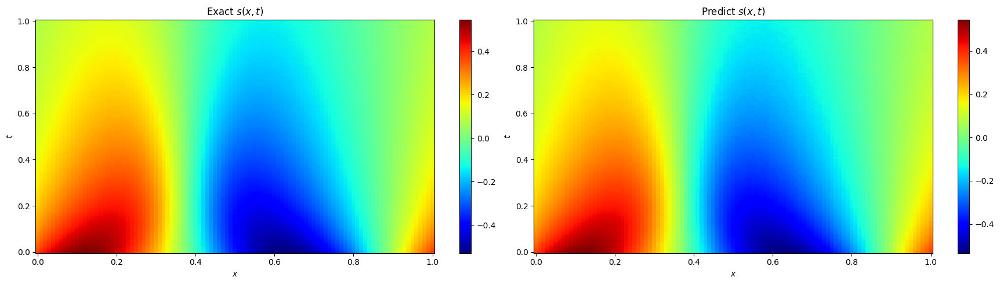

 85%|████████▌ | 17095/20000 [12:08<00:54, 53.04it/s, Loss=0.0005234594, loss_ics=9.485153e-06, loss_bcs=4.6950867e-05, loss_physics=0.00028680547]

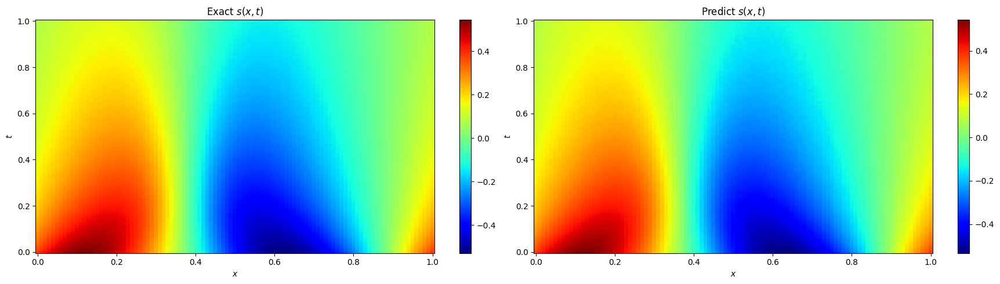

 86%|████████▌ | 17196/20000 [12:12<00:52, 53.13it/s, Loss=0.0004910539, loss_ics=7.425579e-06, loss_bcs=3.7365247e-05, loss_physics=0.00030517706]

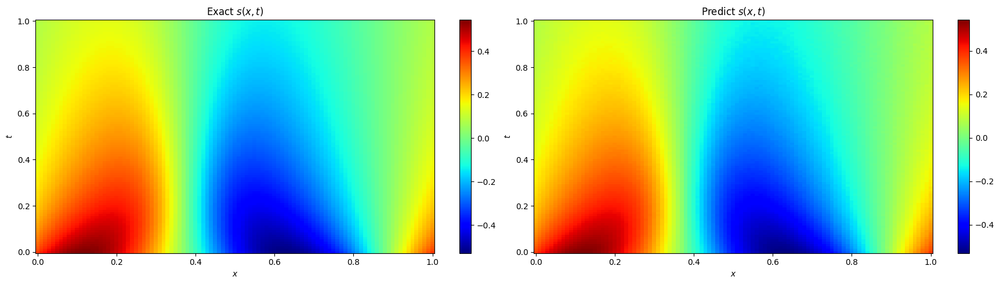

 86%|████████▋ | 17295/20000 [12:16<00:51, 52.97it/s, Loss=0.00085722865, loss_ics=1.9438616e-05, loss_bcs=0.00015752543, loss_physics=0.00031093092]

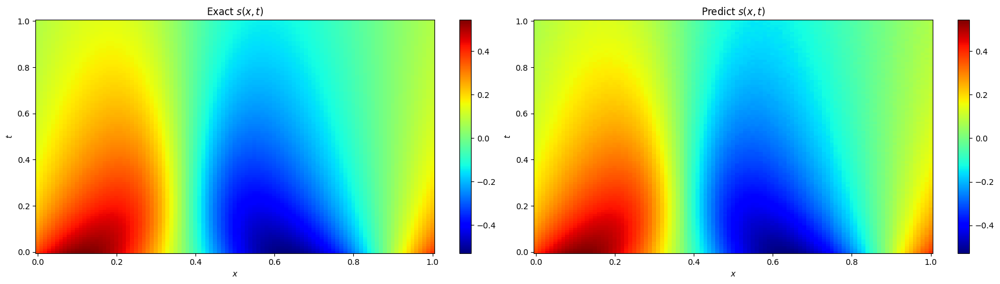

 87%|████████▋ | 17395/20000 [12:20<00:49, 53.10it/s, Loss=0.00053749466, loss_ics=7.629263e-06, loss_bcs=6.577254e-05, loss_physics=0.0003191369]   

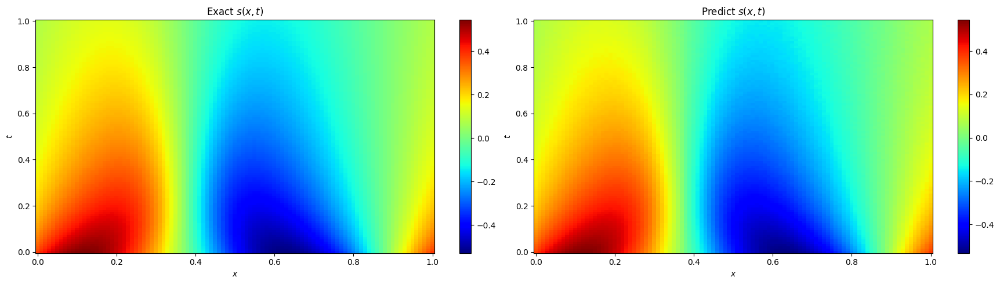

 87%|████████▋ | 17495/20000 [12:25<00:47, 52.90it/s, Loss=0.00063519354, loss_ics=1.645865e-05, loss_bcs=5.580278e-05, loss_physics=0.00025021777]

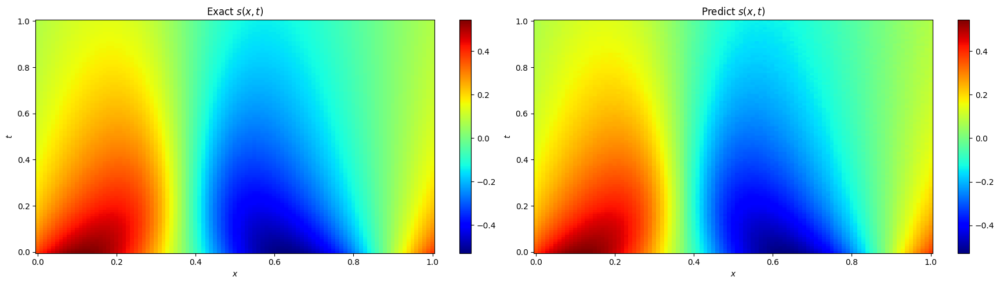

 88%|████████▊ | 17600/20000 [12:29<00:44, 53.47it/s, Loss=0.0005659703, loss_ics=7.153876e-06, loss_bcs=0.00013215131, loss_physics=0.00029074153]

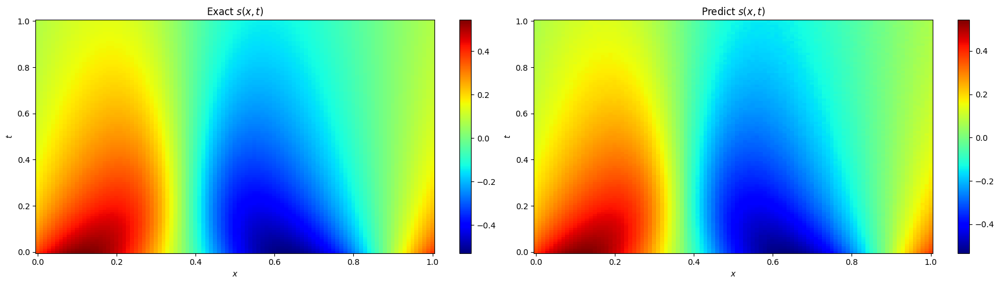

 88%|████████▊ | 17696/20000 [12:33<00:43, 53.11it/s, Loss=0.0006645567, loss_ics=1.3485619e-05, loss_bcs=0.00013399906, loss_physics=0.00026084523]

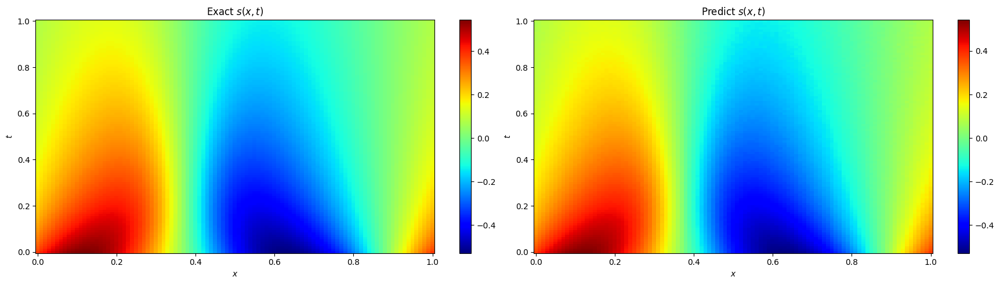

 89%|████████▉ | 17795/20000 [12:37<00:41, 53.11it/s, Loss=0.0004801222, loss_ics=9.1077545e-06, loss_bcs=4.9237802e-05, loss_physics=0.0002487293] 

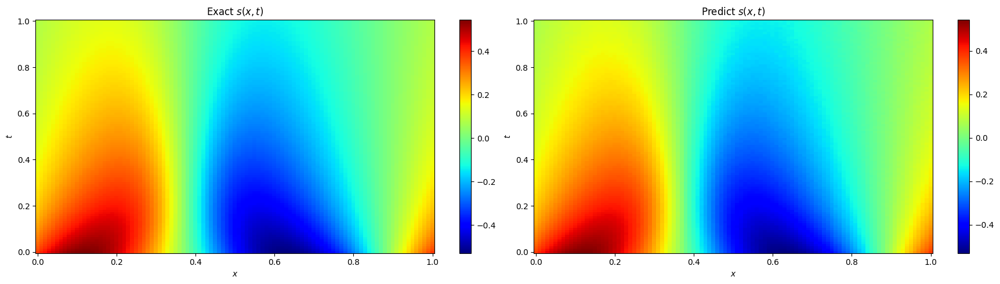

 89%|████████▉ | 17895/20000 [12:41<00:39, 52.81it/s, Loss=0.00043947596, loss_ics=7.3865344e-06, loss_bcs=3.6135407e-05, loss_physics=0.00025560986]

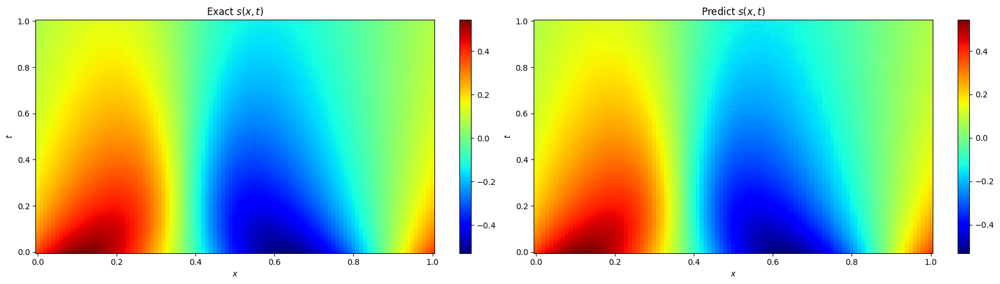

 90%|████████▉ | 17995/20000 [12:45<00:37, 53.08it/s, Loss=0.0006037846, loss_ics=1.4703254e-05, loss_bcs=6.2371124e-05, loss_physics=0.00024734836] 

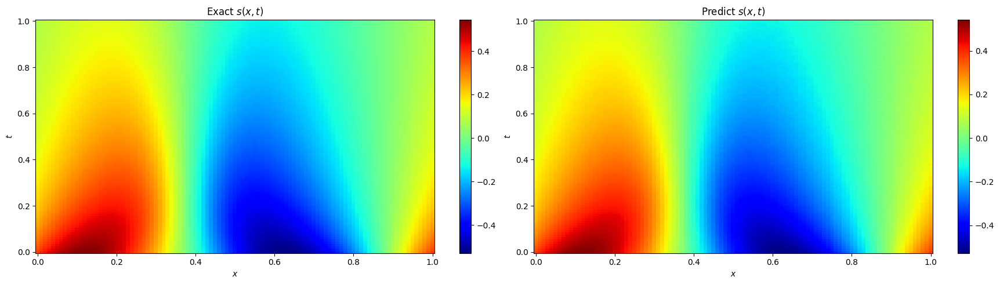

 90%|█████████ | 18100/20000 [12:49<00:35, 53.53it/s, Loss=0.00041554126, loss_ics=6.55509e-06, loss_bcs=4.7186426e-05, loss_physics=0.00023725303] 

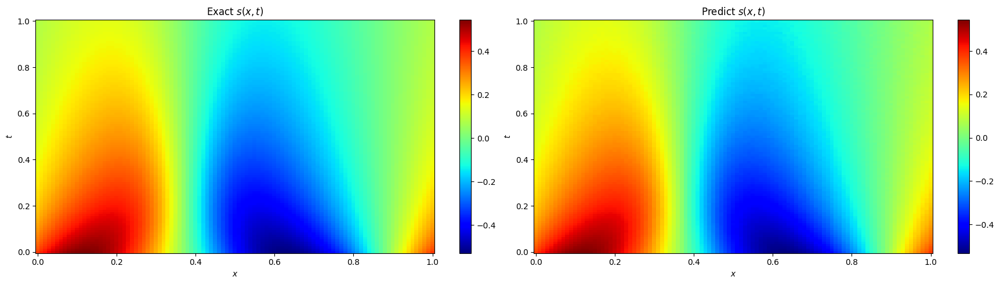

 91%|█████████ | 18196/20000 [12:53<00:34, 52.83it/s, Loss=0.00057448633, loss_ics=8.6236905e-06, loss_bcs=0.00014632502, loss_physics=0.00025568748]

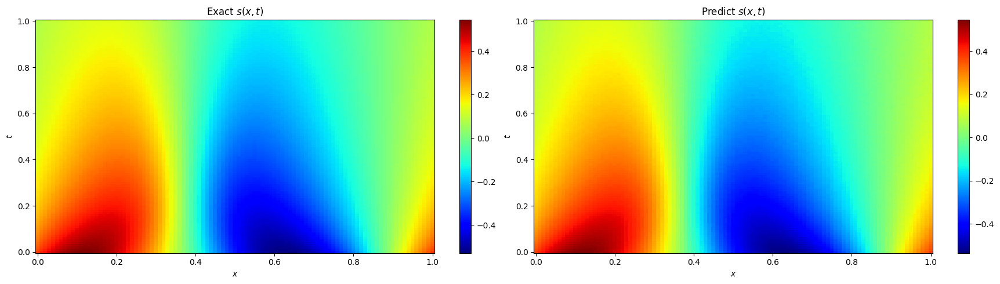

 91%|█████████▏| 18295/20000 [12:57<00:32, 53.07it/s, Loss=0.00047328795, loss_ics=7.4366253e-06, loss_bcs=9.183318e-05, loss_physics=0.00023272225] 

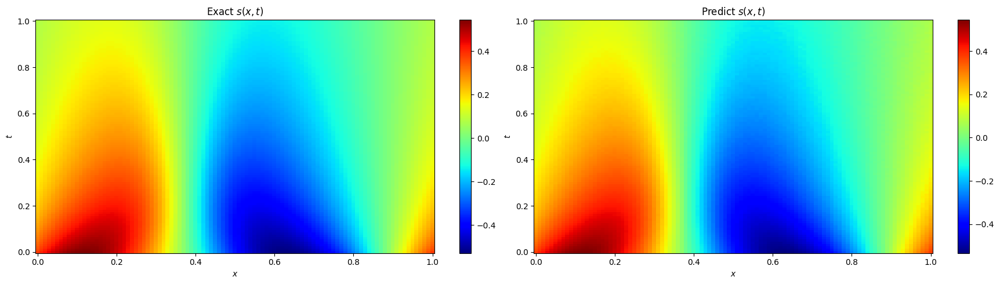

 92%|█████████▏| 18395/20000 [13:01<00:30, 53.09it/s, Loss=0.000581176, loss_ics=6.2933177e-06, loss_bcs=0.00016543437, loss_physics=0.00028987532] 

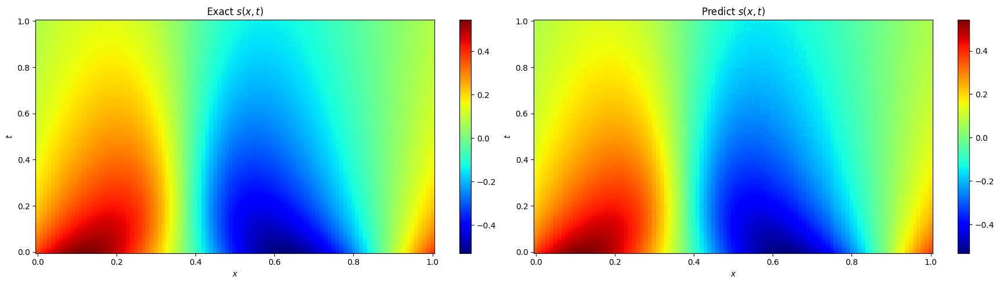

 92%|█████████▏| 18495/20000 [13:06<00:28, 52.80it/s, Loss=0.00043375074, loss_ics=8.55185e-06, loss_bcs=3.5984805e-05, loss_physics=0.00022672892]

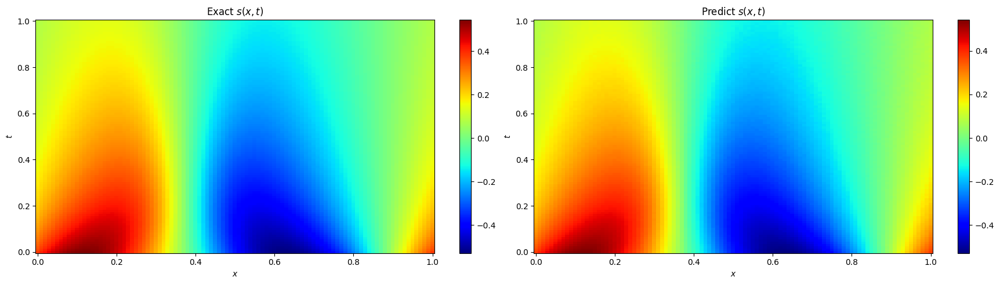

 93%|█████████▎| 18595/20000 [13:10<00:26, 53.08it/s, Loss=0.00069865177, loss_ics=1.646223e-05, loss_bcs=4.1759115e-05, loss_physics=0.00032764804]

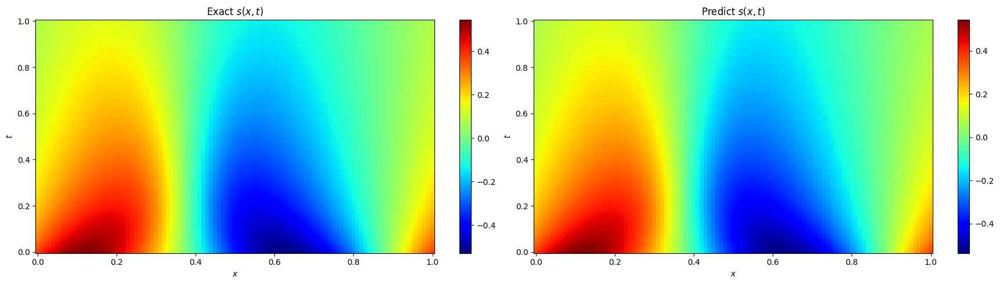

 93%|█████████▎| 18695/20000 [13:14<00:24, 53.05it/s, Loss=0.00063646166, loss_ics=1.5029385e-05, loss_bcs=9.084437e-05, loss_physics=0.00024502954]

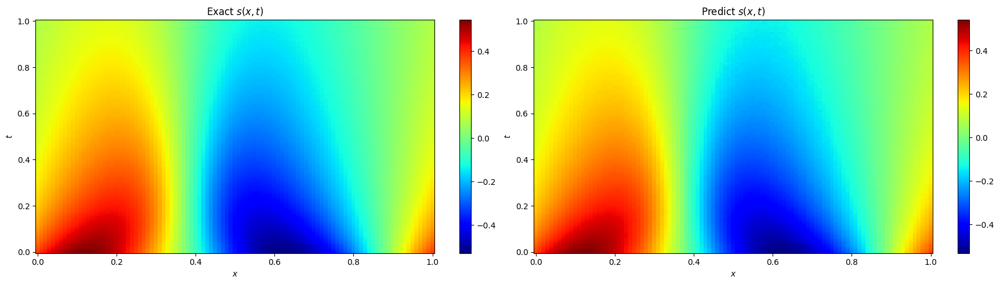

 94%|█████████▍| 18795/20000 [13:18<00:22, 53.03it/s, Loss=0.0006927488, loss_ics=1.5535294e-05, loss_bcs=0.00013253206, loss_physics=0.00024951086]

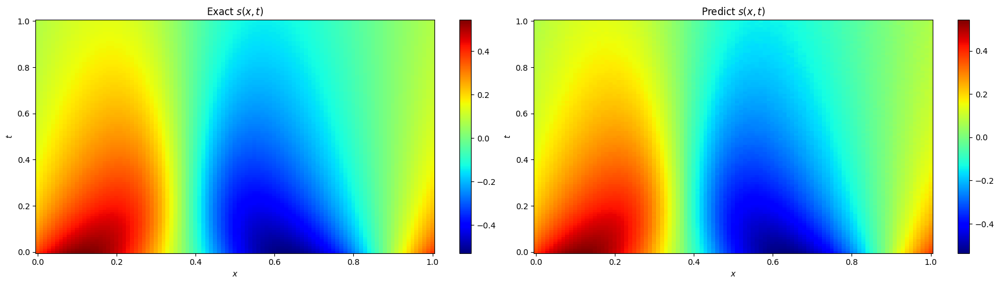

 94%|█████████▍| 18895/20000 [13:22<00:20, 52.86it/s, Loss=0.00042120216, loss_ics=6.873059e-06, loss_bcs=4.9851842e-05, loss_physics=0.00023388914]

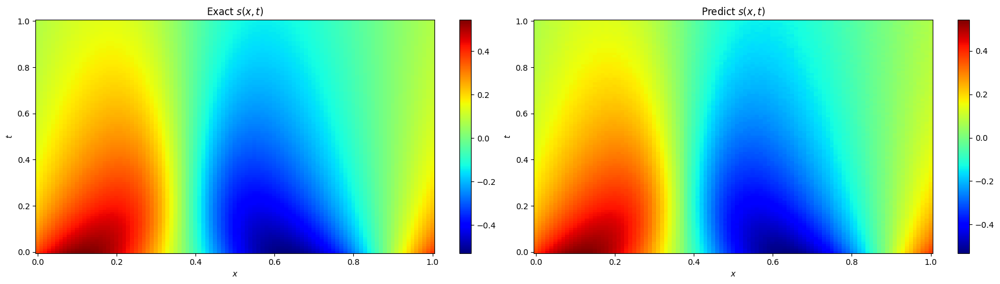

 95%|█████████▍| 18995/20000 [13:26<00:18, 53.05it/s, Loss=0.00052658364, loss_ics=1.29861055e-05, loss_bcs=4.976178e-05, loss_physics=0.00021709975]

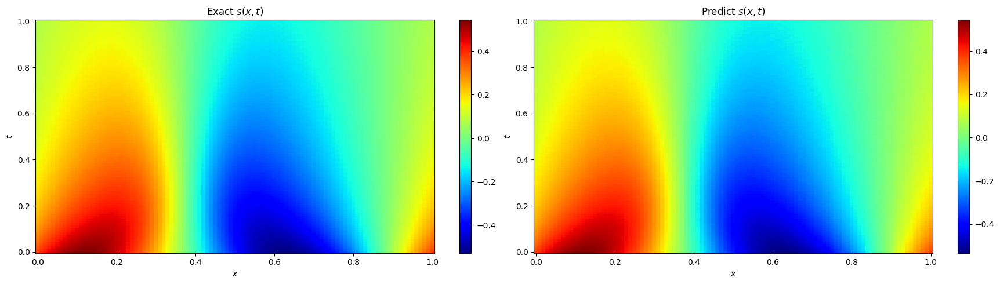

 95%|█████████▌| 19095/20000 [13:30<00:17, 53.03it/s, Loss=0.00040696881, loss_ics=6.9095454e-06, loss_bcs=5.242186e-05, loss_physics=0.00021635603] 

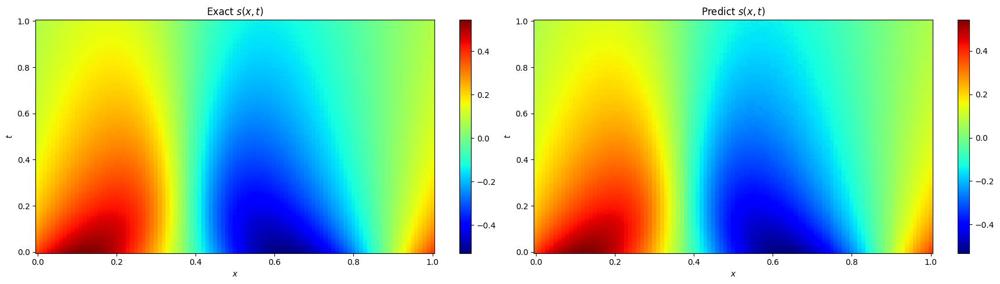

 96%|█████████▌| 19200/20000 [13:35<00:15, 53.32it/s, Loss=0.0004449541, loss_ics=8.252833e-06, loss_bcs=7.359531e-05, loss_physics=0.00020630211]  

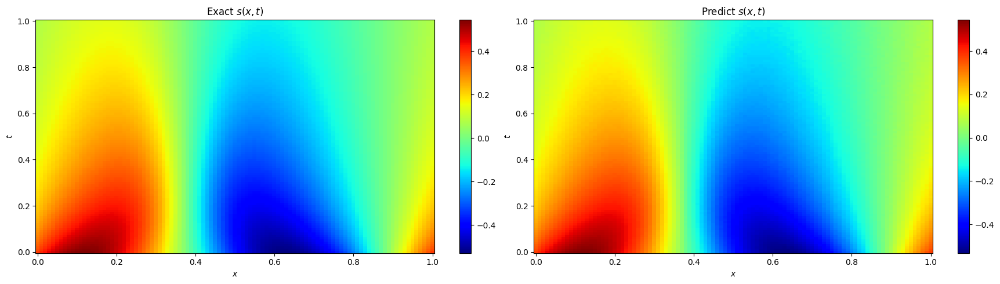

 96%|█████████▋| 19296/20000 [13:39<00:13, 53.04it/s, Loss=0.0004152486, loss_ics=7.72587e-06, loss_bcs=3.5864814e-05, loss_physics=0.00022486638]

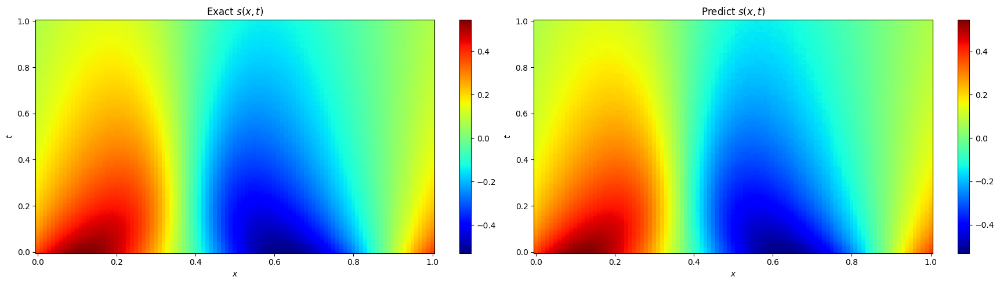

 97%|█████████▋| 19395/20000 [13:43<00:11, 52.95it/s, Loss=0.00038613565, loss_ics=6.5945696e-06, loss_bcs=4.256635e-05, loss_physics=0.00021167789]

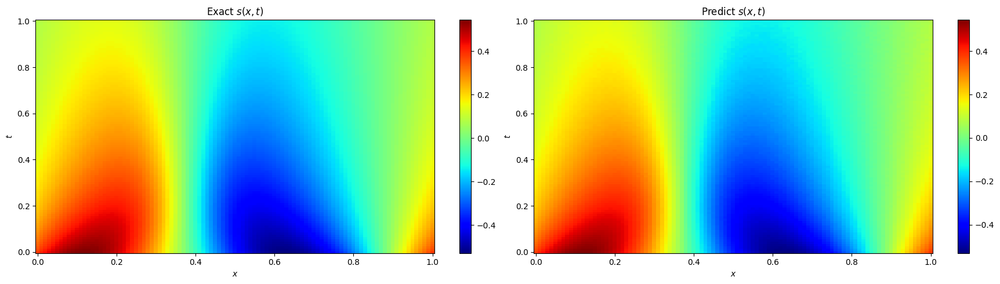

 97%|█████████▋| 19495/20000 [13:47<00:09, 52.93it/s, Loss=0.0012979931, loss_ics=4.166353e-05, loss_bcs=0.00016490281, loss_physics=0.0002998198]  

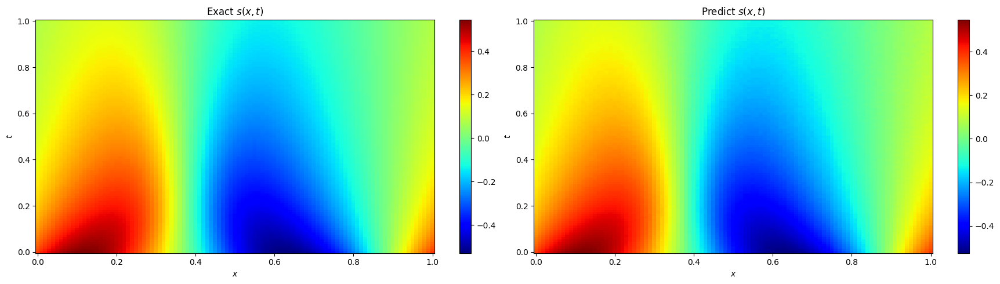

 98%|█████████▊| 19595/20000 [13:51<00:07, 53.11it/s, Loss=0.00041111564, loss_ics=7.2065127e-06, loss_bcs=5.3282994e-05, loss_physics=0.0002137024]

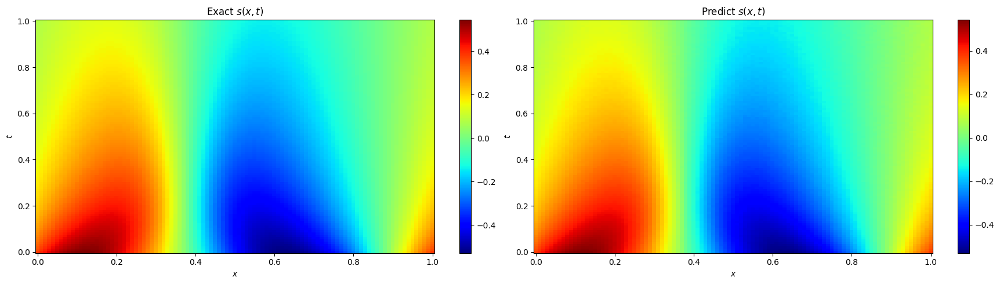

 98%|█████████▊| 19700/20000 [13:55<00:05, 53.43it/s, Loss=0.00038325804, loss_ics=6.3048838e-06, loss_bcs=4.164293e-05, loss_physics=0.00021551744]

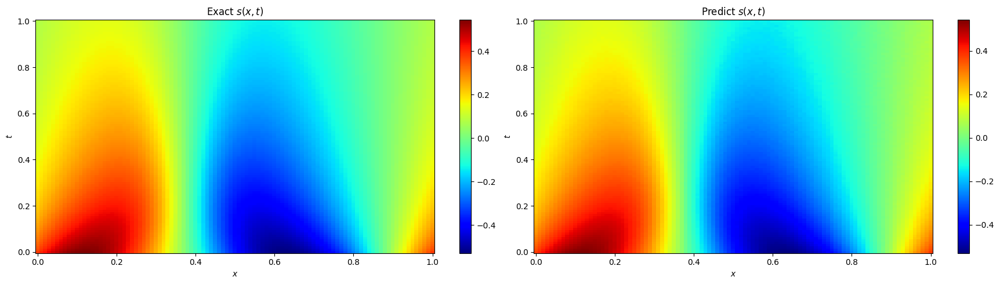

 99%|█████████▉| 19796/20000 [13:59<00:03, 53.03it/s, Loss=0.0004861082, loss_ics=9.021785e-06, loss_bcs=8.1904596e-05, loss_physics=0.00022376791] 

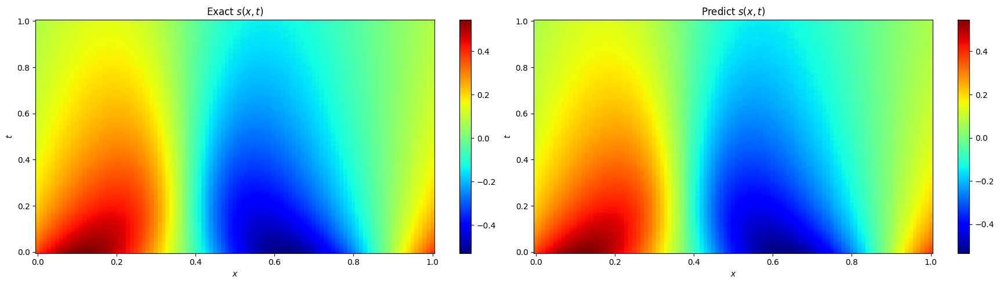

 99%|█████████▉| 19895/20000 [14:03<00:01, 52.92it/s, Loss=0.000453903, loss_ics=6.6847574e-06, loss_bcs=0.0001002693, loss_physics=0.00021993852] 

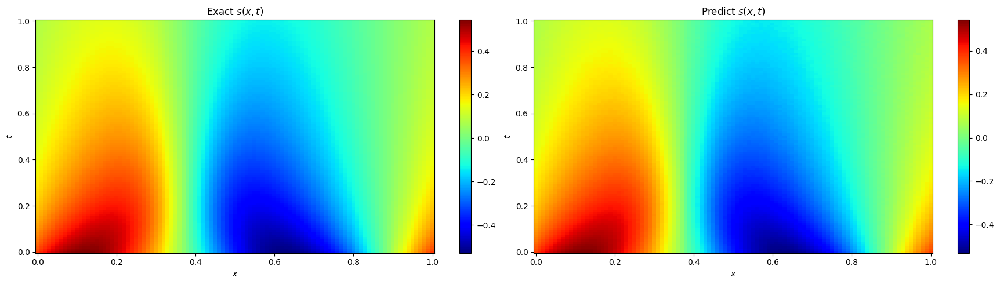

100%|██████████| 20000/20000 [14:06<00:00, 23.63it/s, Loss=0.000453903, loss_ics=6.6847574e-06, loss_bcs=0.0001002693, loss_physics=0.00021993852]


In [ ]:
# Train
# Note: may meet OOM issue if use Colab. Please train this model on the server.
model.train(ics_dataset, bcs_dataset, res_dataset, nIter=20000)

In [9]:
# Restore the trained model
params = model.get_params(model.opt_state)

import pickle

# # save as .pkl file
with open('/content/drive/MyDrive/nif/modified_MLP_lam_{}_params.pkl'.format(20), 'wb') as f:
    pickle.dump(params, f)

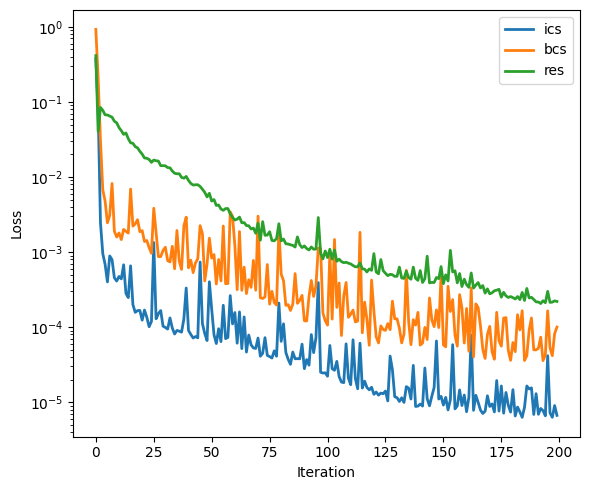

In [ ]:
# Plot for loss function
plt.figure(figsize = (6,5))
# plt.plot(model.loss_log, lw=2)
plt.plot(model.loss_ics_log, lw=2, label='ics')
plt.plot(model.loss_bcs_log, lw=2, label='bcs')
plt.plot(model.loss_res_log, lw=2, label='res')

plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()